<img src='https://www.moex.com/assets-redesign-2021/images/logo-ru.svg' width='350' align='left'></img>  

# <a id='0'>Table of contents (っ・ _・)っ</a>  
- <a href='#1'>Introduction</a> 
- <a href='#2'>Preparing</a> 
    - <a href='#201'>Import libraries</a>   
    - <a href='#202'>Functions</a> 
    - <a href='#203'>Constants</a>     
- <a href='#3'>Парсинг</a> 
    - <a href='#301'>Информация об открытых позициях по производным финансовым инструментам</a>  
    - <a href='#302'>Курс доллара США на валютной бирже - USD000UTSTOM</a>  
    - <a href='#303'>Курс евро-российский рубль на валютной бирже - EUR_RUB__TOM</a> 
    - <a href='#304'>Публичное акционерное общество "Сбербанк России", акция обыкновенная (SBER)</a>
    - <a href='#305'>Публичное акционерное общество "Газпром", акция обыкновенная (GAZP)</a> 
    - <a href='#306'>Банк ВТБ (публичное акционерное общество), акция обыкновенная (VTBR)</a>     
    - <a href='#307'>Публичное акционерное общество "Магнит", акция обыкновенная (MGNT)</a>  
    - <a href='#308'>Публичное акционерное общество "Аэрофлот – российские авиалинии", акция обыкновенная (AFLT)</a>  
    - <a href='#309'>Публичное акционерное общество "Горно-металлургическая компания "Норильский никель", акция обыкновенная (GMKN)</a> 
    - <a href='#310'>Публичное акционерное общество "Нефтяная компания "ЛУКОЙЛ", акция обыкновенная (LKOH)</a>  
    - <a href='#311'>Публичное акционерное общество "Нефтяная компания "Роснефть", акция обыкновенная (ROSN)</a>  
- <a href='#4'>Графики</a> 
    - <a href='#401'>Курс доллара США на валютной бирже - USD000UTSTOM</a>  
    - <a href='#402'>Курс евро-российский рубль на валютной бирже - EUR_RUB__TOM</a>     
    - <a href='#403'>Публичное акционерное общество "Сбербанк России", акция обыкновенная (SBER)</a>     
    - <a href='#404'>Банк ВТБ (публичное акционерное общество), акция обыкновенная (VTBR)</a> 
    - <a href='#405'>Публичное акционерное общество "Газпром", акция обыкновенная (GAZP)</a>     
    - <a href='#406'>Публичное акционерное общество "Нефтяная компания "ЛУКОЙЛ", акция обыкновенная (LKOH)</a>     
    - <a href='#407'>Публичное акционерное общество "Нефтяная компания "Роснефть", акция обыкновенная (ROSN)</a>     
    - <a href='#408'>Публичное акционерное общество "Магнит", акция обыкновенная (MGNT)</a>         
    - <a href='#409'>Публичное акционерное общество "Аэрофлот – российские авиалинии", акция обыкновенная (AFLT)</a>      
    - <a href='#410'>Публичное акционерное общество "Горно-металлургическая компания "Норильский никель", акция обыкновенная (GMKN)</a>    
- <a href='#5'>Создание датасета</a> 
    - <a href='#502'>Объединение таблиц</a> 
    - <a href='#503'>Пропуски в данных</a> 
    - <a href='#504'>Корреляционная зависимость - Курс доллара США</a> 
    - <a href='#505'>Парная корреляция USD & EUR_RUB</a> 
    - <a href='#506'>Корреляционная зависимость - ПАО «Сбербанк»</a> 
    - <a href='#507'>Парная корреляция SBER & ROSN</a>
    - <a href='#508'>Корреляционная зависимость - ПАО «Газпром»</a> 
    - <a href='#509'>Парная корреляция GAZP & VTBR</a>
    - <a href='#510'>Конструирование признаков</a>  
- <a href='#6'>Выбор модели и обучение</a> 
    - <a href='#601'>Первичный выбор модели</a> 
    - <a href='#602'>Обучение модели</a> 
- <a href='#7'>Прогнозирование временных рядов</a> 
    - <a href='#701'>Подготовка данных</a>     

# <a id='1'>Introduction</a>  

# <a id='2'>Preparing</a>  

## <a id='201'>Import libraries</a>  
- <a href='#0'>Table of contents</a> 

In [1]:
from IPython.core.display import display, HTML
display(HTML('<style>.container {width:82.5% !important}</style>'))

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import os
import glob

import math
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import coint, adfuller

from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import learning_curve, KFold, train_test_split
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler

from sklearn.ensemble import BaggingRegressor, ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, VotingRegressor

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM

import time
from datetime import date
from datetime import datetime
from dateutil.rrule import rrule, DAILY
# !pip install python-dateutil

import requests

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [4]:
plt.rcParams.update({'font.size': 14})
pd.set_option('precision', 3)
pd.set_option('max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('max_colwidth', 300)

## <a id='202'>Functions</a>  
- <a href='#0'>Table of contents</a> 

In [5]:
# Функция создания директории
def create_directory(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)
        print(f'Directory «{directory}» created.')
    else:
        print(f'Directory «{directory}» already exists.')

In [6]:
# Функция удаления директории
def del_empty(directory):
    files = glob.glob(directory + '/*.csv')
    for f in files:
        if os.stat(f).st_size <= 500:
            os.remove(f)
            print(f'Empty file «{f}» has been deleted.')

In [7]:
# Function to calculate the root mean squared percentage error
def rmspe(y_true, y_pred):
    return np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))

# Function to early stop with root mean squared percentage error
def feval_rmspe(y_pred, lgb_train):
    y_true = lgb_train.get_label()
    return 'RMSPE', rmspe(y_true, y_pred), False

## <a id='203'>Constants</a>  
- <a href='#0'>Table of contents</a> 

In [8]:
current_date = datetime.now().date()

In [9]:
current_date

datetime.date(2022, 1, 14)

In [10]:
# Диапазон дат для парсинга файлов
moment_start = date(2022, 1, 10) # 2019, 1, 1
# moment_end = current_date
moment_end = date(2022, 1, 13)

# <a id='3'>Parsing</a>  

## <a id='301'>Информация об открытых позициях по производным финансовым инструментам</a>  
- <a href='#0'>Table of contents</a> 

In [11]:
# Создание директории - «derivatives-open-positions»
derivatives = 'derivatives-open-positions'
create_directory(derivatives)

Directory «derivatives-open-positions» already exists.


In [12]:
# Перебор ссылок по дате и сохранение файлов с информацией об открытых позициях по производным финансовым инструментам
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = str(to_date) + '.csv'
    with requests.get('https://www.moex.com/ru/derivatives/open-positions-csv.aspx?d={}&t=1'.format(to_date)) as response:
        with open('{}/{}'.format(derivatives, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [13]:
# https://www.moex.com/ru/derivatives/open-positions-csv.aspx?d=20210902&t=1 - вид полной ссылки
# t=1 - разделители запятые, t=2 - разделители точка с запятой

In [14]:
# Удаление пустых файлов
del_empty(derivatives)

### Извлечение данных по фьючерсным контрактам

In [15]:
# Список файлов и директорий в папке
derivatives_files = os.listdir(derivatives)
# Указание пути к директории «'derivatives-open-positions/»
DERIVATIVES_FILES_PATH = derivatives + '/'

In [16]:
derivatives_si = pd.DataFrame()     # Фьючерсный контракт на курс доллар США - российский рубль  
derivatives_eu = pd.DataFrame()     # Фьючерсный контракт на курс евро-российский рубль  
derivatives_brent = pd.DataFrame()  # Фьючерсный контракт на нефть Brent  
derivatives_gold = pd.DataFrame()   # Фьючерсный контракт на аффинированное золото в слитках  
derivatives_silv = pd.DataFrame()   # Фьючерсный контракт на аффинированное серебро в слитках  
derivatives_ng = pd.DataFrame()     # Фьючерсный контракт на природный газ  
derivatives_sbrf = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции ПАО Сбербанк  
derivatives_vtbr = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО)  
derivatives_gazr = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции ПАО "Газпром"  
derivatives_gmkn = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции ПАО "ГМК "Норильский никель"   
derivatives_aflt = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции ПАО "Аэрофлот"  
derivatives_mgnt = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции ПАО «Магнит»  
derivatives_lkoh = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции ПАО "НК "ЛУКОЙЛ"  
derivatives_rosn = pd.DataFrame()   # Фьючерсный контракт на обыкновенные акции ПАО "НК "Роснефть"  
derivatives_rts = pd.DataFrame()    # Фьючерсный контракт на Индекс РТС  
derivatives_mix = pd.DataFrame()    # Фьючерсный контракт на Индекс МосБиржи  
derivatives_spyf = pd.DataFrame()   # Фьючерсный контракт на инвестиционные паи SPDR S&P 500 ETF Trust  

for file in derivatives_files:
    derivatives_tmp = pd.read_csv(DERIVATIVES_FILES_PATH + file)
    # Преобразование из объекта в дату
    derivatives_tmp['moment'] = derivatives_tmp['moment'].astype('datetime64[ns]')
    # Удаление пустых или малозначимых столбцов
    derivatives_tmp.drop('contract_type', axis=1, inplace=True)
    derivatives_tmp.drop('change_prev_week_short_perc', axis=1, inplace=True)
    derivatives_tmp.drop('change_prev_week_long_perc', axis=1, inplace=True)
    derivatives_tmp.drop('Unnamed: 13', axis=1, inplace=True)
    # Изменение последовательности столбцов
    derivatives_tmp = derivatives_tmp[['moment', 'isin', 'name', 'iz_fiz', 'long_position', 'short_position', 'change_prev_week_long_abs', 'change_prev_week_short_abs', 'clients_in_long', 'clients_in_short']]
    
    ##### Валюта #####
    # Фьючерсный контракт на курс доллар США - российский рубль
    si_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на курс доллар США - российский рубль']
    # Отбор физических и юридических лиц, по признаку
    si_ind = si_tmp[si_tmp['iz_fiz'] == 1]
    si_ent = si_tmp[si_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    si_tmp = pd.merge(si_ind, si_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_si_ind', '_si_ent'))
    # Удаление пустых или малозначимых столбцов
    si_tmp.drop('iz_fiz_si_ind', axis=1, inplace=True)
    si_tmp.drop('iz_fiz_si_ent', axis=1, inplace=True)
    si_tmp.drop('change_prev_week_long_abs_si_ind', axis=1, inplace=True)
    si_tmp.drop('change_prev_week_short_abs_si_ind', axis=1, inplace=True)
    si_tmp.drop('change_prev_week_long_abs_si_ent', axis=1, inplace=True)
    si_tmp.drop('change_prev_week_short_abs_si_ent', axis=1, inplace=True)
    derivatives_si = derivatives_si.append(si_tmp, ignore_index = True)
    
    # Фьючерсный контракт на курс евро-российский рубль
    eu_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на курс евро - российский рубль']
    # Отбор физических и юридических лиц, по признаку
    eu_ind = eu_tmp[eu_tmp['iz_fiz'] == 1]
    eu_ent = eu_tmp[eu_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    eu_tmp = pd.merge(eu_ind, eu_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_eu_ind', '_eu_ent'))
    # Удаление пустых или малозначимых столбцов
    eu_tmp.drop('iz_fiz_eu_ind', axis=1, inplace=True)
    eu_tmp.drop('iz_fiz_eu_ent', axis=1, inplace=True)
    eu_tmp.drop('change_prev_week_long_abs_eu_ind', axis=1, inplace=True)
    eu_tmp.drop('change_prev_week_short_abs_eu_ind', axis=1, inplace=True)
    eu_tmp.drop('change_prev_week_long_abs_eu_ent', axis=1, inplace=True)
    eu_tmp.drop('change_prev_week_short_abs_eu_ent', axis=1, inplace=True)
    derivatives_eu = derivatives_eu.append(eu_tmp, ignore_index = True)
    
    
    ##### Товарные контракты #####
    # Фьючерсный контракт на нефть Brent
    brent_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на нефть BRENT']
    # Отбор физических и юридических лиц, по признаку
    brent_ind = brent_tmp[brent_tmp['iz_fiz'] == 1]
    brent_ent = brent_tmp[brent_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    brent_tmp = pd.merge(brent_ind, brent_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_brent_ind', '_brent_ent'))
    # Удаление пустых или малозначимых столбцов
    brent_tmp.drop('iz_fiz_brent_ind', axis=1, inplace=True)
    brent_tmp.drop('iz_fiz_brent_ent', axis=1, inplace=True)
    brent_tmp.drop('change_prev_week_long_abs_brent_ind', axis=1, inplace=True)
    brent_tmp.drop('change_prev_week_short_abs_brent_ind', axis=1, inplace=True)
    brent_tmp.drop('change_prev_week_long_abs_brent_ent', axis=1, inplace=True)
    brent_tmp.drop('change_prev_week_short_abs_brent_ent', axis=1, inplace=True)
    derivatives_brent = derivatives_brent.append(brent_tmp, ignore_index = True)
    
    # Фьючерсный контракт на аффинированное золото в слитках
    gold_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на аффинированное золото в слитках']
    # Отбор физических и юридических лиц, по признаку
    gold_ind = gold_tmp[gold_tmp['iz_fiz'] == 1]
    gold_ent = gold_tmp[gold_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    gold_tmp = pd.merge(gold_ind, gold_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_gold_ind', '_gold_ent'))
    # Удаление пустых или малозначимых столбцов
    gold_tmp.drop('iz_fiz_gold_ind', axis=1, inplace=True)
    gold_tmp.drop('iz_fiz_gold_ent', axis=1, inplace=True)
    gold_tmp.drop('change_prev_week_long_abs_gold_ind', axis=1, inplace=True)
    gold_tmp.drop('change_prev_week_short_abs_gold_ind', axis=1, inplace=True)
    gold_tmp.drop('change_prev_week_long_abs_gold_ent', axis=1, inplace=True)
    gold_tmp.drop('change_prev_week_short_abs_gold_ent', axis=1, inplace=True)
    derivatives_gold = derivatives_gold.append(gold_tmp, ignore_index = True)
    
    # Фьючерсный контракт на аффинированное серебро в слитках
    silv_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на аффинированное серебро в слитках']
    # Отбор физических и юридических лиц, по признаку
    silv_ind = silv_tmp[silv_tmp['iz_fiz'] == 1]
    silv_ent = silv_tmp[silv_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    silv_tmp = pd.merge(silv_ind, silv_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_silv_ind', '_silv_ent'))
    # Удаление пустых или малозначимых столбцов
    silv_tmp.drop('iz_fiz_silv_ind', axis=1, inplace=True)
    silv_tmp.drop('iz_fiz_silv_ent', axis=1, inplace=True)
    silv_tmp.drop('change_prev_week_long_abs_silv_ind', axis=1, inplace=True)
    silv_tmp.drop('change_prev_week_short_abs_silv_ind', axis=1, inplace=True)
    silv_tmp.drop('change_prev_week_long_abs_silv_ent', axis=1, inplace=True)
    silv_tmp.drop('change_prev_week_short_abs_silv_ent', axis=1, inplace=True)
    derivatives_silv = derivatives_silv.append(silv_tmp, ignore_index = True)
    
    # Фьючерсный контракт на природный газ
    ng_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на природный газ']
    # Отбор физических и юридических лиц, по признаку
    ng_ind = ng_tmp[ng_tmp['iz_fiz'] == 1]
    ng_ent = ng_tmp[ng_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    ng_tmp = pd.merge(ng_ind, ng_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_ng_ind', '_ng_ent'))
    # Удаление пустых или малозначимых столбцов
    ng_tmp.drop('iz_fiz_ng_ind', axis=1, inplace=True)
    ng_tmp.drop('iz_fiz_ng_ent', axis=1, inplace=True)
    ng_tmp.drop('change_prev_week_long_abs_ng_ind', axis=1, inplace=True)
    ng_tmp.drop('change_prev_week_short_abs_ng_ind', axis=1, inplace=True)
    ng_tmp.drop('change_prev_week_long_abs_ng_ent', axis=1, inplace=True)
    ng_tmp.drop('change_prev_week_short_abs_ng_ent', axis=1, inplace=True)
    derivatives_ng = derivatives_ng.append(ng_tmp, ignore_index = True)
    
    
    ##### Акции ##### 
    # Фьючерсный контракт на обыкновенные акции ПАО Сбербанк SBRF
    sbrf_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на обыкновенные акции ПАО Сбербанк']
    # Отбор физических и юридических лиц, по признаку
    sbrf_ind = sbrf_tmp[sbrf_tmp['iz_fiz'] == 1]
    sbrf_ent = sbrf_tmp[sbrf_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    sbrf_tmp = pd.merge(sbrf_ind, sbrf_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_sbrf_ind', '_sbrf_ent'))
    # Удаление пустых или малозначимых столбцов
    sbrf_tmp.drop('iz_fiz_sbrf_ind', axis=1, inplace=True)
    sbrf_tmp.drop('iz_fiz_sbrf_ent', axis=1, inplace=True)
    sbrf_tmp.drop('change_prev_week_long_abs_sbrf_ind', axis=1, inplace=True)
    sbrf_tmp.drop('change_prev_week_short_abs_sbrf_ind', axis=1, inplace=True)
    sbrf_tmp.drop('change_prev_week_long_abs_sbrf_ent', axis=1, inplace=True)
    sbrf_tmp.drop('change_prev_week_short_abs_sbrf_ent', axis=1, inplace=True)
    derivatives_sbrf = derivatives_sbrf.append(sbrf_tmp, ignore_index = True)
    
    # Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО)
    vtbr_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО)']
    # Отбор физических и юридических лиц, по признаку
    vtbr_ind = vtbr_tmp[vtbr_tmp['iz_fiz'] == 1]
    vtbr_ent = vtbr_tmp[vtbr_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    vtbr_tmp = pd.merge(vtbr_ind, vtbr_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_vtbr_ind', '_vtbr_ent'))
    # Удаление пустых или малозначимых столбцов
    vtbr_tmp.drop('iz_fiz_vtbr_ind', axis=1, inplace=True)
    vtbr_tmp.drop('iz_fiz_vtbr_ent', axis=1, inplace=True)
    vtbr_tmp.drop('change_prev_week_long_abs_vtbr_ind', axis=1, inplace=True)
    vtbr_tmp.drop('change_prev_week_short_abs_vtbr_ind', axis=1, inplace=True)
    vtbr_tmp.drop('change_prev_week_long_abs_vtbr_ent', axis=1, inplace=True)
    vtbr_tmp.drop('change_prev_week_short_abs_vtbr_ent', axis=1, inplace=True)
    derivatives_vtbr = derivatives_vtbr.append(vtbr_tmp, ignore_index = True)
    
    # Фьючерсный контракт на обыкновенные акции ПАО "Газпром"
    gazr_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на обыкновенные акции ПАО "Газпром"']
    # Отбор физических и юридических лиц, по признаку
    gazr_ind = gazr_tmp[gazr_tmp['iz_fiz'] == 1]
    gazr_ent = gazr_tmp[gazr_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    gazr_tmp = pd.merge(gazr_ind, gazr_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_gazr_ind', '_gazr_ent'))
    # Удаление пустых или малозначимых столбцов
    gazr_tmp.drop('iz_fiz_gazr_ind', axis=1, inplace=True)
    gazr_tmp.drop('iz_fiz_gazr_ent', axis=1, inplace=True)
    gazr_tmp.drop('change_prev_week_long_abs_gazr_ind', axis=1, inplace=True)
    gazr_tmp.drop('change_prev_week_short_abs_gazr_ind', axis=1, inplace=True)
    gazr_tmp.drop('change_prev_week_long_abs_gazr_ent', axis=1, inplace=True)
    gazr_tmp.drop('change_prev_week_short_abs_gazr_ent', axis=1, inplace=True)
    derivatives_gazr = derivatives_gazr.append(gazr_tmp, ignore_index = True)
    
    # Фьючерсный контракт на обыкновенные акции ПАО "ГМК "Норильский никель"
    gmkn_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на обыкновенные акции ПАО "ГМК "Норильский никель"']
    # Отбор физических и юридических лиц, по признаку
    gmkn_ind = gmkn_tmp[gmkn_tmp['iz_fiz'] == 1]
    gmkn_ent = gmkn_tmp[gmkn_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    gmkn_tmp = pd.merge(gmkn_ind, gmkn_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_gmkn_ind', '_gmkn_ent'))
    # Удаление пустых или малозначимых столбцов
    gmkn_tmp.drop('iz_fiz_gmkn_ind', axis=1, inplace=True)
    gmkn_tmp.drop('iz_fiz_gmkn_ent', axis=1, inplace=True)
    gmkn_tmp.drop('change_prev_week_long_abs_gmkn_ind', axis=1, inplace=True)
    gmkn_tmp.drop('change_prev_week_short_abs_gmkn_ind', axis=1, inplace=True)
    gmkn_tmp.drop('change_prev_week_long_abs_gmkn_ent', axis=1, inplace=True)
    gmkn_tmp.drop('change_prev_week_short_abs_gmkn_ent', axis=1, inplace=True)
    derivatives_gmkn = derivatives_gmkn.append(gmkn_tmp, ignore_index = True)
    
    # Фьючерсный контракт на обыкновенные акции ПАО "Аэрофлот"
    aflt_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на  обыкновенные акции ПАО "Аэрофлот"']
    # Отбор физических и юридических лиц, по признаку
    aflt_ind = aflt_tmp[aflt_tmp['iz_fiz'] == 1]
    aflt_ent = aflt_tmp[aflt_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    aflt_tmp = pd.merge(aflt_ind, aflt_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_aflt_ind', '_aflt_ent'))
    # Удаление пустых или малозначимых столбцов
    aflt_tmp.drop('iz_fiz_aflt_ind', axis=1, inplace=True)
    aflt_tmp.drop('iz_fiz_aflt_ent', axis=1, inplace=True)
    aflt_tmp.drop('change_prev_week_long_abs_aflt_ind', axis=1, inplace=True)
    aflt_tmp.drop('change_prev_week_short_abs_aflt_ind', axis=1, inplace=True)
    aflt_tmp.drop('change_prev_week_long_abs_aflt_ent', axis=1, inplace=True)
    aflt_tmp.drop('change_prev_week_short_abs_aflt_ent', axis=1, inplace=True)
    derivatives_aflt = derivatives_aflt.append(aflt_tmp, ignore_index = True)
    
    # Фьючерсный контракт на обыкновенные акции ПАО «Магнит»
    mgnt_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на обыкновенные акции ПАО "Магнит"']
    # Отбор физических и юридических лиц, по признаку
    mgnt_ind = mgnt_tmp[mgnt_tmp['iz_fiz'] == 1]
    mgnt_ent = mgnt_tmp[mgnt_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    mgnt_tmp = pd.merge(mgnt_ind, mgnt_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_mgnt_ind', '_mgnt_ent'))
    # Удаление пустых или малозначимых столбцов
    mgnt_tmp.drop('iz_fiz_mgnt_ind', axis=1, inplace=True)
    mgnt_tmp.drop('iz_fiz_mgnt_ent', axis=1, inplace=True)
    mgnt_tmp.drop('change_prev_week_long_abs_mgnt_ind', axis=1, inplace=True)
    mgnt_tmp.drop('change_prev_week_short_abs_mgnt_ind', axis=1, inplace=True)
    mgnt_tmp.drop('change_prev_week_long_abs_mgnt_ent', axis=1, inplace=True)
    mgnt_tmp.drop('change_prev_week_short_abs_mgnt_ent', axis=1, inplace=True)
    derivatives_mgnt = derivatives_mgnt.append(mgnt_tmp, ignore_index = True)
    
    # Фьючерсный контракт на обыкновенные акции ПАО "НК "ЛУКОЙЛ"
    lkoh_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на обыкновенные акции ПАО "НК "ЛУКОЙЛ"']
    # Отбор физических и юридических лиц, по признаку
    lkoh_ind = lkoh_tmp[lkoh_tmp['iz_fiz'] == 1]
    lkoh_ent = lkoh_tmp[lkoh_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    lkoh_tmp = pd.merge(lkoh_ind, lkoh_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_lkoh_ind', '_lkoh_ent'))
    # Удаление пустых или малозначимых столбцов
    lkoh_tmp.drop('iz_fiz_lkoh_ind', axis=1, inplace=True)
    lkoh_tmp.drop('iz_fiz_lkoh_ent', axis=1, inplace=True)
    lkoh_tmp.drop('change_prev_week_long_abs_lkoh_ind', axis=1, inplace=True)
    lkoh_tmp.drop('change_prev_week_short_abs_lkoh_ind', axis=1, inplace=True)
    lkoh_tmp.drop('change_prev_week_long_abs_lkoh_ent', axis=1, inplace=True)
    lkoh_tmp.drop('change_prev_week_short_abs_lkoh_ent', axis=1, inplace=True)
    derivatives_lkoh = derivatives_lkoh.append(lkoh_tmp, ignore_index = True)
    
    # Фьючерсный контракт на обыкновенные акции ПАО "НК "Роснефть"
    rosn_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на обыкновенные акции ПАО "НК "Роснефть"']
    # Отбор физических и юридических лиц, по признаку
    rosn_ind = rosn_tmp[rosn_tmp['iz_fiz'] == 1]
    rosn_ent = rosn_tmp[rosn_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    rosn_tmp = pd.merge(rosn_ind, rosn_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_rosn_ind', '_rosn_ent'))
    # Удаление пустых или малозначимых столбцов
    rosn_tmp.drop('iz_fiz_rosn_ind', axis=1, inplace=True)
    rosn_tmp.drop('iz_fiz_rosn_ent', axis=1, inplace=True)
    rosn_tmp.drop('change_prev_week_long_abs_rosn_ind', axis=1, inplace=True)
    rosn_tmp.drop('change_prev_week_short_abs_rosn_ind', axis=1, inplace=True)
    rosn_tmp.drop('change_prev_week_long_abs_rosn_ent', axis=1, inplace=True)
    rosn_tmp.drop('change_prev_week_short_abs_rosn_ent', axis=1, inplace=True)
    derivatives_rosn = derivatives_rosn.append(rosn_tmp, ignore_index = True)
    
    
    ##### Индексы #####
    # Фьючерсный контракт на Индекс РТС
    rts_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на Индекс РТС']
    # Отбор физических и юридических лиц, по признаку
    rts_ind = rts_tmp[rts_tmp['iz_fiz'] == 1]
    rts_ent = rts_tmp[rts_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    rts_tmp = pd.merge(rts_ind, rts_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_rts_ind', '_rts_ent'))
    # Удаление пустых или малозначимых столбцов
    rts_tmp.drop('iz_fiz_rts_ind', axis=1, inplace=True)
    rts_tmp.drop('iz_fiz_rts_ent', axis=1, inplace=True)
    rts_tmp.drop('change_prev_week_long_abs_rts_ind', axis=1, inplace=True)
    rts_tmp.drop('change_prev_week_short_abs_rts_ind', axis=1, inplace=True)
    rts_tmp.drop('change_prev_week_long_abs_rts_ent', axis=1, inplace=True)
    rts_tmp.drop('change_prev_week_short_abs_rts_ent', axis=1, inplace=True)
    derivatives_rts = derivatives_rts.append(rts_tmp, ignore_index = True)
    
    # Фьючерсный контракт на Индекс МосБиржи
    mix_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на Индекс МосБиржи']
    # Отбор физических и юридических лиц, по признаку
    mix_ind = mix_tmp[mix_tmp['iz_fiz'] == 1]
    mix_ent = mix_tmp[mix_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    mix_tmp = pd.merge(mix_ind, mix_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_mix_ind', '_mix_ent'))
    # Удаление пустых или малозначимых столбцов
    mix_tmp.drop('iz_fiz_mix_ind', axis=1, inplace=True)
    mix_tmp.drop('iz_fiz_mix_ent', axis=1, inplace=True)
    mix_tmp.drop('change_prev_week_long_abs_mix_ind', axis=1, inplace=True)
    mix_tmp.drop('change_prev_week_short_abs_mix_ind', axis=1, inplace=True)
    mix_tmp.drop('change_prev_week_long_abs_mix_ent', axis=1, inplace=True)
    mix_tmp.drop('change_prev_week_short_abs_mix_ent', axis=1, inplace=True)
    derivatives_mix = derivatives_mix.append(mix_tmp, ignore_index = True)
    
    # Фьючерсный контракт на инвестиционные паи SPDR S&P 500 ETF Trust
    spyf_tmp = derivatives_tmp[derivatives_tmp['name'] == 'Фьючерсный контракт на инвестиционные паи SPDR SP500 ETF Trust']
    # Отбор физических и юридических лиц, по признаку
    spyf_ind = spyf_tmp[spyf_tmp['iz_fiz'] == 1]
    spyf_ent = spyf_tmp[spyf_tmp['iz_fiz'] != 1]
    # Объединение датафреймов
    spyf_tmp = pd.merge(spyf_ind, spyf_ent, how='outer', on=['moment', 'isin', 'name'], suffixes=('_spyf_ind', '_spyf_ent'))
    # Удаление пустых или малозначимых столбцов
    spyf_tmp.drop('iz_fiz_spyf_ind', axis=1, inplace=True)
    spyf_tmp.drop('iz_fiz_spyf_ent', axis=1, inplace=True)
    spyf_tmp.drop('change_prev_week_long_abs_spyf_ind', axis=1, inplace=True)
    spyf_tmp.drop('change_prev_week_short_abs_spyf_ind', axis=1, inplace=True)
    spyf_tmp.drop('change_prev_week_long_abs_spyf_ent', axis=1, inplace=True)
    spyf_tmp.drop('change_prev_week_short_abs_spyf_ent', axis=1, inplace=True)
    derivatives_spyf = derivatives_spyf.append(spyf_tmp, ignore_index = True)

## <a id='302'>Курс доллара США на валютной бирже - USD000UTSTOM</a>  
- <a href='#0'>Table of contents</a>  

In [17]:
# Создание директории - «contracts_si»
contracts_si = 'contract-results/contracts_si'
create_directory(contracts_si)

Directory «contract-results/contracts_si» already exists.


In [18]:
# Код инструмента
SECID = 'USD000UTSTOM'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/currency/markets/selt/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_si, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [19]:
# https://iss.moex.com/iss/history/engines/currency/markets/selt/securities/USD000UTSTOM.html?iss.meta=on&iss.only=history&limit=1&from=2021-09-14 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - USD000UTSTOM

In [20]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_si)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_si + '/'

In [21]:
contract_si = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True) 
    contract_si = contract_si.append(contract_tmp, ignore_index = True)

In [22]:
contract_si = contract_si.rename({'TRADEDATE': 'moment', 'OPEN': 'si_open', 'LOW': 'si_low', 'HIGH': 'si_high', 'CLOSE': 'si_close', 
                                  'VOLRUR': 'si_volrur', 'WAPRICE': 'si_price'}, axis='columns')

In [23]:
# BOARDID - Идентификатор режима торгов / The particular board for which security information should be sent, or BLANK for all boards.
# SHORTNAME - Краткое наименование бумаги / The short name for the security.
# SECID - Идентификатор финансового инструмента.
# NUMTRADES - Количество сделок за торговый день / Number of the trades for current trade session.
# OPEN - Цена первой сделки / Open price for the security today.
# LOW - Минимальная цена сделки / The lowest traded price for the security today.
# HIGH - Максимальная цена сделки / The highest traded price for the security today.
# CLOSE - Цена последней сделки

In [24]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_si['si_h'] = contract_si['si_high'] - contract_si['si_open']
# Глубина опускания цены (l = O - L)
contract_si['si_l'] = contract_si['si_open'] - contract_si['si_low']
# Доходность (r = C - O)
contract_si['si_r'] = contract_si['si_close'] - contract_si['si_open']
# # Амплитуда размаха цены (a = h + l)
# contract_si['si_a'] = contract_si['si_h'] + contract_si['si_l']
# # Модифицированная амплитуда размаха (v = a - abs(r)/2)
# contract_si['si_v'] = contract_si['si_a'] - abs(contract_si['si_r'])/2

# contract_si['upper_shadow_si'] = contract_si['si_high'] - np.maximum(contract_si['si_close'], contract_si['si_open'])
# contract_si['lower_shadow_si'] = np.minimum(contract_si['si_close'], contract_si['si_open']) - contract_si['si_low']

In [25]:
contract_si.drop('si_open', axis=1, inplace=True)
contract_si.drop('si_low', axis=1, inplace=True)
contract_si.drop('si_high', axis=1, inplace=True)
contract_si.drop('si_close', axis=1, inplace=True)

In [26]:
# Удаление дублирующих строк
contract_si = contract_si.drop_duplicates(subset=['moment'])

In [27]:
contract_si.head()

,moment,si_volrur,si_price,si_h,si_l,si_r
0,2019-01-03,70407381295.00000,69.04240,2.05750,0.87250,-0.75500
3,2019-01-04,88010746665.00000,68.01030,0.94750,0.28750,-0.06000
4,2019-01-08,66532359815.00000,67.02320,0.46250,0.12500,0.02000
8,2019-01-09,223118391100.00000,66.99830,0.15000,0.63250,-0.55500
9,2019-01-10,206781362150.00000,67.03050,0.51500,0.12500,0.08500


In [28]:
# Объединение таблиц на основе ключа - 'moment'
si_df = pd.merge(derivatives_si, contract_si, on='moment', how='left')

In [29]:
si_df.head()

,moment,isin,name,long_position_si_ind,short_position_si_ind,clients_in_long_si_ind,clients_in_short_si_ind,long_position_si_ent,short_position_si_ent,clients_in_long_si_ent,clients_in_short_si_ent,si_volrur,si_price,si_h,si_l,si_r
0,2019-01-03,Si,Фьючерсный контракт на курс доллар США - российский рубль,495046.00000,152387.00000,7082.00000,3583.00000,752916.00000,1095575.00000,284.00000,133.00000,70407381295.00000,69.04240,2.05750,0.87250,-0.75500
1,2019-01-04,Si,Фьючерсный контракт на курс доллар США - российский рубль,513385.00000,134988.00000,7204.00000,3390.00000,671794.00000,1050191.00000,292.00000,114.00000,88010746665.00000,68.01030,0.94750,0.28750,-0.06000
2,2019-01-08,Si,Фьючерсный контракт на курс доллар США - российский рубль,534128.00000,122767.00000,7911.00000,3341.00000,667668.00000,1079029.00000,307.00000,120.00000,66532359815.00000,67.02320,0.46250,0.12500,0.02000
3,2019-01-09,Si,Фьючерсный контракт на курс доллар США - российский рубль,580272.00000,109831.00000,8887.00000,3242.00000,680891.00000,1151332.00000,332.00000,102.00000,223118391100.00000,66.99830,0.15000,0.63250,-0.55500
4,2019-01-10,Si,Фьючерсный контракт на курс доллар США - российский рубль,685629.00000,80301.00000,10598.00000,2322.00000,699811.00000,1305139.00000,350.00000,94.00000,206781362150.00000,67.03050,0.51500,0.12500,0.08500


In [30]:
si_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='303'>Курс евро-российский рубль на валютной бирже - EUR_RUB__TOM</a>  
- <a href='#0'>Table of contents</a>  

In [31]:
# Создание директории - «contracts_eu»
contracts_eu = 'contract-results/contracts_eu'
create_directory(contracts_eu)

Directory «contract-results/contracts_eu» already exists.


In [32]:
# Код инструмента
SECID = 'EUR_RUB__TOM'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/currency/markets/selt/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_eu, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [33]:
# https://iss.moex.com/iss/history/engines/currency/markets/selt/securities/EUR_RUB__TOM.html?iss.meta=on&iss.only=history&limit=1&from=2021-09-14 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - EUR_RUB__TOM

In [34]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_eu)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_eu + '/'

In [35]:
contract_eu = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True) 
    contract_eu = contract_eu.append(contract_tmp, ignore_index = True)

In [36]:
contract_eu = contract_eu.rename({'TRADEDATE': 'moment', 'OPEN': 'eu_open', 'LOW': 'eu_low', 'HIGH': 'eu_high', 'CLOSE': 'eu_close', 
                                  'VOLRUR': 'eu_volrur', 'WAPRICE': 'eu_price'}, axis='columns')

In [37]:
# BOARDID - Идентификатор режима торгов / The particular board for which security information should be sent, or BLANK for all boards.
# SHORTNAME - Краткое наименование бумаги / The short name for the security.
# SECID - Идентификатор финансового инструмента.
# NUMTRADES - Количество сделок за торговый день / Number of the trades for current trade session.
# OPEN - Цена первой сделки / Open price for the security today.
# LOW - Минимальная цена сделки / The lowest traded price for the security today.
# HIGH - Максимальная цена сделки / The highest traded price for the security today.
# CLOSE - Цена последней сделки

In [38]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_eu['eu_h'] = contract_eu['eu_high'] - contract_eu['eu_open']
# Глубина опускания цены (l = O - L)
contract_eu['eu_l'] = contract_eu['eu_open'] - contract_eu['eu_low']
# Доходность (r = C - O)
contract_eu['eu_r'] = contract_eu['eu_close'] - contract_eu['eu_open']

In [39]:
contract_eu.drop('eu_open', axis=1, inplace=True)
contract_eu.drop('eu_low', axis=1, inplace=True)
contract_eu.drop('eu_high', axis=1, inplace=True)
contract_eu.drop('eu_close', axis=1, inplace=True)

In [40]:
# Удаление дублирующих строк
contract_eu = contract_eu.drop_duplicates(subset=['moment'])

In [41]:
contract_eu.head()

,moment,eu_volrur,eu_price,eu_h,eu_l,eu_r
0,2019-01-03,8319800877.50000,78.58510,0.31750,0.75500,-0.62250
3,2019-01-04,7531006237.50000,77.62960,0.30250,0.96000,-0.69250
4,2019-01-08,7914974070.00000,76.75500,0.49250,0.15500,0.01500
8,2019-01-09,23753273645.00000,76.85450,0.54500,0.11250,0.41250
9,2019-01-10,25225514445.00000,77.26940,0.45750,0.24500,-0.24500


In [42]:
# Объединение таблиц на основе ключа - 'moment'
eu_df = pd.merge(derivatives_eu, contract_eu, on='moment', how='left')

In [43]:
eu_df.head()

,moment,isin,name,long_position_eu_ind,short_position_eu_ind,clients_in_long_eu_ind,clients_in_short_eu_ind,long_position_eu_ent,short_position_eu_ent,clients_in_long_eu_ent,clients_in_short_eu_ent,eu_volrur,eu_price,eu_h,eu_l,eu_r
0,2019-01-03,Eu,Фьючерсный контракт на курс евро - российский рубль,17070.00000,15852.00000,684.00000,415.00000,60385.00000,61603.00000,52.00000,43.00000,8319800877.50000,78.58510,0.31750,0.75500,-0.62250
1,2019-01-04,Eu,Фьючерсный контракт на курс евро - российский рубль,19169.00000,13869.00000,695.00000,368.00000,57815.00000,63115.00000,52.00000,42.00000,7531006237.50000,77.62960,0.30250,0.96000,-0.69250
2,2019-01-08,Eu,Фьючерсный контракт на курс евро - российский рубль,22967.00000,12008.00000,800.00000,355.00000,51439.00000,62398.00000,55.00000,41.00000,7914974070.00000,76.75500,0.49250,0.15500,0.01500
3,2019-01-09,Eu,Фьючерсный контракт на курс евро - российский рубль,25947.00000,7053.00000,939.00000,273.00000,48815.00000,67709.00000,56.00000,41.00000,23753273645.00000,76.85450,0.54500,0.11250,0.41250
4,2019-01-10,Eu,Фьючерсный контракт на курс евро - российский рубль,35567.00000,5383.00000,1077.00000,221.00000,43930.00000,74114.00000,69.00000,29.00000,25225514445.00000,77.26940,0.45750,0.24500,-0.24500


In [44]:
eu_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='304'>Публичное акционерное общество "Сбербанк России", акция обыкновенная (SBER)</a>  
- <a href='#0'>Table of contents</a>  

In [45]:
# Создание директории - «contracts_sber»
contracts_sber = 'contract-results/contracts_sber'
create_directory(contracts_sber)

Directory «contract-results/contracts_sber» already exists.


In [46]:
# Код инструмента
SECID = 'SBER'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_sber, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [47]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/SBER.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (SBER)

In [48]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_sber)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_sber + '/'

In [49]:
contract_sber = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_sber = contract_sber.append(contract_tmp, ignore_index = True)

In [50]:
contract_sber = contract_sber.rename({'TRADEDATE': 'moment', 'VALUE': 'sber_value', 'OPEN': 'sber_open', 'LOW': 'sber_low', 'HIGH': 'sber_high',
                                      'CLOSE': 'sber_close', 'WAPRICE': 'sber_price', 'VOLUME': 'sber_volume'}, axis='columns')

In [51]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_sber['sber_h'] = contract_sber['sber_high'] - contract_sber['sber_open']
# Глубина опускания цены (l = O - L)
contract_sber['sber_l'] = contract_sber['sber_open'] - contract_sber['sber_low']
# Доходность (r = C - O)
contract_sber['sber_r'] = contract_sber['sber_close'] - contract_sber['sber_open']

In [52]:
contract_sber.drop('sber_open', axis=1, inplace=True)
contract_sber.drop('sber_low', axis=1, inplace=True)
contract_sber.drop('sber_high', axis=1, inplace=True)
contract_sber.drop('sber_close', axis=1, inplace=True)

In [53]:
# Удаление дублирующих строк
contract_sber = contract_sber.drop_duplicates(subset=['moment'])

In [54]:
contract_sber.head()

,moment,sber_value,sber_price,sber_volume,sber_h,sber_l,sber_r
0,2019-01-03,7606839232.60000,188.97000,40249190,5.13000,0.37000,0.62000
3,2019-01-04,6178982723.20000,189.64000,32583360,2.99000,0.23000,2.99000
4,2019-01-08,7439747926.70000,191.48000,38856560,1.53000,1.28000,-0.41000
8,2019-01-09,13793750286.70000,195.08000,70707820,4.29000,0.61000,4.29000
9,2019-01-10,11072132895.50000,196.39000,56378780,1.39000,1.22000,0.50000


In [55]:
# Объединение таблиц на основе ключа - 'moment'
sber_df = pd.merge(derivatives_sbrf, contract_sber, on='moment', how='left')

In [56]:
sber_df.head()

,moment,isin,name,long_position_sbrf_ind,short_position_sbrf_ind,clients_in_long_sbrf_ind,clients_in_short_sbrf_ind,long_position_sbrf_ent,short_position_sbrf_ent,clients_in_long_sbrf_ent,clients_in_short_sbrf_ent,sber_value,sber_price,sber_volume,sber_h,sber_l,sber_r
0,2019-01-03,SBRF,Фьючерсный контракт на обыкновенные акции ПАО Сбербанк,125849.00000,41794.00000,2311.00000,1447.00000,193033.00000,277088.00000,67.00000,52.00000,7606839232.60000,188.97000,40249190,5.13000,0.37000,0.62000
1,2019-01-04,SBRF,Фьючерсный контракт на обыкновенные акции ПАО Сбербанк,128721.00000,40539.00000,2346.00000,1454.00000,195949.00000,284131.00000,77.00000,44.00000,6178982723.20000,189.64000,32583360,2.99000,0.23000,2.99000
2,2019-01-08,SBRF,Фьючерсный контракт на обыкновенные акции ПАО Сбербанк,117245.00000,49817.00000,2138.00000,1936.00000,194523.00000,261951.00000,53.00000,65.00000,7439747926.70000,191.48000,38856560,1.53000,1.28000,-0.41000
3,2019-01-09,SBRF,Фьючерсный контракт на обыкновенные акции ПАО Сбербанк,146550.00000,67674.00000,2316.00000,2228.00000,195839.00000,274715.00000,77.00000,61.00000,13793750286.70000,195.08000,70707820,4.29000,0.61000,4.29000
4,2019-01-10,SBRF,Фьючерсный контракт на обыкновенные акции ПАО Сбербанк,123306.00000,64565.00000,2241.00000,2252.00000,212535.00000,271276.00000,73.00000,77.00000,11072132895.50000,196.39000,56378780,1.39000,1.22000,0.50000


In [57]:
sber_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='305'>Публичное акционерное общество "Газпром", акция обыкновенная (GAZP)</a>  
- <a href='#0'>Table of contents</a>  

In [58]:
# Создание директории - «contracts_gazp»
contracts_gazp = 'contract-results/contracts_gazp'
create_directory(contracts_gazp)

Directory «contract-results/contracts_gazp» already exists.


In [59]:
# Код инструмента
SECID = 'GAZP'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_gazp, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [60]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/GAZP.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (GAZP)

In [61]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_gazp)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_gazp + '/'

In [62]:
contract_gazp = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_gazp = contract_gazp.append(contract_tmp, ignore_index = True)

In [63]:
contract_gazp = contract_gazp.rename({'TRADEDATE': 'moment', 'VALUE': 'gazr_value', 'OPEN': 'gazr_open', 'LOW': 'gazr_low', 'HIGH': 'gazr_high',
                                      'CLOSE': 'gazr_close', 'WAPRICE': 'gazr_price', 'VOLUME': 'gazr_volume'}, axis='columns')

In [64]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_gazp['gazr_h'] = contract_gazp['gazr_high'] - contract_gazp['gazr_open']
# Глубина опускания цены (l = O - L)
contract_gazp['gazr_l'] = contract_gazp['gazr_open'] - contract_gazp['gazr_low']
# Доходность (r = C - O)
contract_gazp['gazr_r'] = contract_gazp['gazr_close'] - contract_gazp['gazr_open']

In [65]:
contract_gazp.drop('gazr_open', axis=1, inplace=True)
contract_gazp.drop('gazr_low', axis=1, inplace=True)
contract_gazp.drop('gazr_high', axis=1, inplace=True)
contract_gazp.drop('gazr_close', axis=1, inplace=True)

In [66]:
# Удаление дублирующих строк
contract_gazp = contract_gazp.drop_duplicates(subset=['moment'])

In [67]:
contract_gazp.head()

,moment,gazr_value,gazr_price,gazr_volume,gazr_h,gazr_l,gazr_r
0,2019-01-03,2210472430.10000,155.92000,14178500,3.17000,0.02000,2.15000
3,2019-01-04,2297413672.70000,157.75000,14563370,2.44000,0.00000,2.44000
4,2019-01-08,2686999296.30000,157.68000,17041340,0.19000,2.20000,-0.49000
8,2019-01-09,3059300418.10000,159.74000,19149630,1.52000,0.48000,1.36000
9,2019-01-10,3175534988.40000,159.17000,19950220,0.45000,2.19000,0.45000


In [68]:
# Объединение таблиц на основе ключа - 'moment'
gazr_df = pd.merge(derivatives_gazr, contract_gazp, on='moment', how='left')

In [69]:
gazr_df.head()

,moment,isin,name,long_position_gazr_ind,short_position_gazr_ind,clients_in_long_gazr_ind,clients_in_short_gazr_ind,long_position_gazr_ent,short_position_gazr_ent,clients_in_long_gazr_ent,clients_in_short_gazr_ent,gazr_value,gazr_price,gazr_volume,gazr_h,gazr_l,gazr_r
0,2019-01-03,GAZR,"Фьючерсный контракт на обыкновенные акции ПАО ""Газпром""",81833.00000,14477.00000,916.00000,543.00000,15413.00000,82769.00000,38.00000,31.00000,2210472430.10000,155.92000,14178500,3.17000,0.02000,2.15000
1,2019-01-04,GAZR,"Фьючерсный контракт на обыкновенные акции ПАО ""Газпром""",77810.00000,15572.00000,905.00000,545.00000,14343.00000,76581.00000,42.00000,29.00000,2297413672.70000,157.75000,14563370,2.44000,0.00000,2.44000
2,2019-01-08,GAZR,"Фьючерсный контракт на обыкновенные акции ПАО ""Газпром""",79237.00000,16524.00000,923.00000,587.00000,14187.00000,76900.00000,32.00000,39.00000,2686999296.30000,157.68000,17041340,0.19000,2.20000,-0.49000
3,2019-01-09,GAZR,"Фьючерсный контракт на обыкновенные акции ПАО ""Газпром""",78593.00000,17386.00000,913.00000,713.00000,13628.00000,74835.00000,32.00000,38.00000,3059300418.10000,159.74000,19149630,1.52000,0.48000,1.36000
4,2019-01-10,GAZR,"Фьючерсный контракт на обыкновенные акции ПАО ""Газпром""",78866.00000,22166.00000,886.00000,809.00000,19256.00000,75956.00000,37.00000,34.00000,3175534988.40000,159.17000,19950220,0.45000,2.19000,0.45000


In [70]:
gazr_df.drop(['isin', 'name'], axis=1, inplace=True)

In [71]:
gazr_df.isnull().sum()

moment                       0
long_position_gazr_ind       0
short_position_gazr_ind      0
clients_in_long_gazr_ind     0
clients_in_short_gazr_ind    0
long_position_gazr_ent       0
short_position_gazr_ent      0
clients_in_long_gazr_ent     0
clients_in_short_gazr_ent    0
gazr_value                   0
gazr_price                   1
gazr_volume                  0
gazr_h                       1
gazr_l                       1
gazr_r                       1
dtype: int64

## <a id='306'>Банк ВТБ (публичное акционерное общество), акция обыкновенная (VTBR)</a>  
- <a href='#0'>Table of contents</a>  

In [72]:
# Создание директории - «contracts_vtbr»
contracts_vtbr = 'contract-results/contracts_vtbr'
create_directory(contracts_vtbr)

Directory «contract-results/contracts_vtbr» already exists.


In [73]:
# Код инструмента
SECID = 'VTBR'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_vtbr, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [74]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/VTBR.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (VTBR)

In [75]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_vtbr)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_vtbr + '/'

In [76]:
contract_vtbr = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_vtbr = contract_vtbr.append(contract_tmp, ignore_index = True)

In [77]:
contract_vtbr = contract_vtbr.rename({'TRADEDATE': 'moment', 'VALUE': 'vtbr_value', 'OPEN': 'vtbr_open', 'LOW': 'vtbr_low', 'HIGH': 'vtbr_high',
                                      'CLOSE': 'vtbr_close', 'WAPRICE': 'vtbr_price', 'VOLUME': 'vtbr_volume'}, axis='columns')

In [78]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_vtbr['vtbr_h'] = contract_vtbr['vtbr_high'] - contract_vtbr['vtbr_open']
# Глубина опускания цены (l = O - L)
contract_vtbr['vtbr_l'] = contract_vtbr['vtbr_open'] - contract_vtbr['vtbr_low']
# Доходность (r = C - O)
contract_vtbr['vtbr_r'] = contract_vtbr['vtbr_close'] - contract_vtbr['vtbr_open']

In [79]:
contract_vtbr.drop('vtbr_open', axis=1, inplace=True)
contract_vtbr.drop('vtbr_low', axis=1, inplace=True)
contract_vtbr.drop('vtbr_high', axis=1, inplace=True)
contract_vtbr.drop('vtbr_close', axis=1, inplace=True)

In [80]:
# Удаление дублирующих строк
contract_vtbr = contract_vtbr.drop_duplicates(subset=['moment'])

In [81]:
contract_vtbr.head()

,moment,vtbr_value,vtbr_price,vtbr_volume,vtbr_h,vtbr_l,vtbr_r
0,2019-01-03,307679094.85000,0.03413,423175408,0.00046,0.00024,0.00030
3,2019-01-04,296856106.25000,0.03448,19455408,0.00038,0.00002,0.00038
4,2019-01-08,383012779.55000,0.03478,-1866791888,0.00029,0.00023,0.00014
8,2019-01-09,429540026.75000,0.03501,-615541888,0.00014,0.00016,0.00000
9,2019-01-10,448676794.15000,0.03486,-15991888,0.00006,0.00035,0.00004


In [82]:
# Объединение таблиц на основе ключа - 'moment'
vtbr_df = pd.merge(derivatives_vtbr, contract_vtbr, on='moment', how='left')

In [83]:
vtbr_df.head()

,moment,isin,name,long_position_vtbr_ind,short_position_vtbr_ind,clients_in_long_vtbr_ind,clients_in_short_vtbr_ind,long_position_vtbr_ent,short_position_vtbr_ent,clients_in_long_vtbr_ent,clients_in_short_vtbr_ent,vtbr_value,vtbr_price,vtbr_volume,vtbr_h,vtbr_l,vtbr_r
0,2019-01-03,VTBR,Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО),97988.00000,8276.00000,1182.00000,301.00000,35848.00000,125560.00000,22.00000,21.00000,307679094.85000,0.03413,423175408,0.00046,0.00024,0.00030
1,2019-01-04,VTBR,Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО),96199.00000,7374.00000,1191.00000,263.00000,35770.00000,124595.00000,21.00000,22.00000,296856106.25000,0.03448,19455408,0.00038,0.00002,0.00038
2,2019-01-08,VTBR,Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО),94640.00000,7363.00000,1159.00000,286.00000,35788.00000,123065.00000,19.00000,26.00000,383012779.55000,0.03478,-1866791888,0.00029,0.00023,0.00014
3,2019-01-09,VTBR,Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО),95509.00000,7549.00000,1201.00000,307.00000,35873.00000,123833.00000,20.00000,29.00000,429540026.75000,0.03501,-615541888,0.00014,0.00016,0.00000
4,2019-01-10,VTBR,Фьючерсный контракт на обыкновенные акции Банк ВТБ (ПАО),101394.00000,7353.00000,1196.00000,303.00000,36069.00000,130110.00000,21.00000,30.00000,448676794.15000,0.03486,-15991888,0.00006,0.00035,0.00004


In [84]:
vtbr_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='307'>Публичное акционерное общество "Магнит", акция обыкновенная (MGNT)</a>  
- <a href='#0'>Table of contents</a>  

In [85]:
# Создание директории - «contracts_mgnt»
contracts_mgnt = 'contract-results/contracts_mgnt'
create_directory(contracts_mgnt)

Directory «contract-results/contracts_mgnt» already exists.


In [86]:
# Код инструмента
SECID = 'MGNT'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_mgnt, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [87]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/MGNT.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (MGNT)

In [88]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_mgnt)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_mgnt + '/'

In [89]:
contract_mgnt = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)    
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_mgnt = contract_mgnt.append(contract_tmp, ignore_index = True)

In [90]:
contract_mgnt = contract_mgnt.rename({'TRADEDATE': 'moment', 'VALUE': 'mgnt_value', 'OPEN': 'mgnt_open', 'LOW': 'mgnt_low', 'HIGH': 'mgnt_high',
                                      'CLOSE': 'mgnt_close', 'WAPRICE': 'mgnt_price', 'VOLUME': 'mgnt_volume'}, axis='columns')

In [91]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_mgnt['mgnt_h'] = contract_mgnt['mgnt_high'] - contract_mgnt['mgnt_open']
# Глубина опускания цены (l = O - L)
contract_mgnt['mgnt_l'] = contract_mgnt['mgnt_open'] - contract_mgnt['mgnt_low']
# Доходность (r = C - O)
contract_mgnt['mgnt_r'] = contract_mgnt['mgnt_close'] - contract_mgnt['mgnt_open']

In [92]:
contract_mgnt.drop('mgnt_open', axis=1, inplace=True)
contract_mgnt.drop('mgnt_low', axis=1, inplace=True)
contract_mgnt.drop('mgnt_high', axis=1, inplace=True)
contract_mgnt.drop('mgnt_close', axis=1, inplace=True)

In [93]:
# Удаление дублирующих строк
contract_mgnt = contract_mgnt.drop_duplicates(subset=['moment'])

In [94]:
contract_mgnt.head()

,moment,mgnt_value,mgnt_price,mgnt_volume,mgnt_h,mgnt_l,mgnt_r
0,2019-01-03,789639918.00000,3559.50000,221569,85.00000,29.50000,64.50000
3,2019-01-04,937284010.50000,3613.00000,259359,52.50000,20.00000,0.00000
4,2019-01-08,845062571.00000,3625.50000,232888,88.00000,37.00000,80.00000
8,2019-01-09,938679697.50000,3704.00000,252901,71.00000,18.00000,19.50000
9,2019-01-10,1602459070.50000,3775.00000,423307,135.50000,4.00000,127.00000


In [95]:
# Объединение таблиц на основе ключа - 'moment'
mgnt_df = pd.merge(derivatives_mgnt, contract_mgnt, on='moment', how='left')

In [96]:
mgnt_df.head()

,moment,isin,name,long_position_mgnt_ind,short_position_mgnt_ind,clients_in_long_mgnt_ind,clients_in_short_mgnt_ind,long_position_mgnt_ent,short_position_mgnt_ent,clients_in_long_mgnt_ent,clients_in_short_mgnt_ent,mgnt_value,mgnt_price,mgnt_volume,mgnt_h,mgnt_l,mgnt_r
0,2019-01-03,MGNT,"Фьючерсный контракт на обыкновенные акции ПАО ""Магнит""",82563.00000,5395.00000,550.00000,104.00000,4739.00000,81907.00000,13.00000,16.00000,789639918.00000,3559.50000,221569,85.00000,29.50000,64.50000
1,2019-01-04,MGNT,"Фьючерсный контракт на обыкновенные акции ПАО ""Магнит""",79871.00000,4466.00000,559.00000,107.00000,4520.00000,79925.00000,14.00000,18.00000,937284010.50000,3613.00000,259359,52.50000,20.00000,0.00000
2,2019-01-08,MGNT,"Фьючерсный контракт на обыкновенные акции ПАО ""Магнит""",80326.00000,5659.00000,567.00000,126.00000,4437.00000,79104.00000,15.00000,17.00000,845062571.00000,3625.50000,232888,88.00000,37.00000,80.00000
3,2019-01-09,MGNT,"Фьючерсный контракт на обыкновенные акции ПАО ""Магнит""",79202.00000,5220.00000,569.00000,123.00000,4238.00000,78220.00000,14.00000,18.00000,938679697.50000,3704.00000,252901,71.00000,18.00000,19.50000
4,2019-01-10,MGNT,"Фьючерсный контракт на обыкновенные акции ПАО ""Магнит""",85295.00000,8135.00000,590.00000,185.00000,5677.00000,82837.00000,19.00000,18.00000,1602459070.50000,3775.00000,423307,135.50000,4.00000,127.00000


In [97]:
mgnt_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='308'>Публичное акционерное общество "Аэрофлот – российские авиалинии", акция обыкновенная (AFLT)</a>  
- <a href='#0'>Table of contents</a>  

In [98]:
# Создание директории - «contracts_aflt»
contracts_aflt = 'contract-results/contracts_aflt'
create_directory(contracts_aflt)

Directory «contract-results/contracts_aflt» already exists.


In [99]:
# Код инструмента
SECID = 'AFLT'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_aflt, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [100]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/AFLT.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (AFLT)

In [101]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_aflt)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_aflt + '/'

In [102]:
contract_aflt = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_aflt = contract_aflt.append(contract_tmp, ignore_index = True)

In [103]:
contract_aflt = contract_aflt.rename({'TRADEDATE': 'moment', 'VALUE': 'aflt_value', 'OPEN': 'aflt_open', 'LOW': 'aflt_low', 'HIGH': 'aflt_high',
                                      'CLOSE': 'aflt_close', 'WAPRICE': 'aflt_price', 'VOLUME': 'aflt_volume'}, axis='columns')

In [104]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_aflt['aflt_h'] = contract_aflt['aflt_high'] - contract_aflt['aflt_open']
# Глубина опускания цены (l = O - L)
contract_aflt['aflt_l'] = contract_aflt['aflt_open'] - contract_aflt['aflt_low']
# Доходность (r = C - O)
contract_aflt['aflt_r'] = contract_aflt['aflt_close'] - contract_aflt['aflt_open']

In [105]:
contract_aflt.drop('aflt_open', axis=1, inplace=True)
contract_aflt.drop('aflt_low', axis=1, inplace=True)
contract_aflt.drop('aflt_high', axis=1, inplace=True)
contract_aflt.drop('aflt_close', axis=1, inplace=True)

In [106]:
# Удаление дублирующих строк
contract_aflt = contract_aflt.drop_duplicates(subset=['moment'])

In [107]:
contract_aflt.head()

,moment,aflt_value,aflt_price,aflt_volume,aflt_h,aflt_l,aflt_r
0,2019-01-03,172958364.20000,101.14000,1710190,0.00000,1.18000,-0.40000
3,2019-01-04,133536174.20000,101.10000,1320990,0.18000,0.70000,-0.40000
4,2019-01-08,127848168.80000,101.06000,1265180,0.34000,0.70000,-0.40000
8,2019-01-09,567022794.80000,102.40000,5537730,2.04000,0.28000,0.92000
9,2019-01-10,649031504.60000,104.10000,6235350,2.26000,0.42000,2.26000


In [108]:
# Объединение таблиц на основе ключа - 'moment'
aflt_df = pd.merge(derivatives_aflt, contract_aflt, on='moment', how='left')

In [109]:
aflt_df.head()

,moment,isin,name,long_position_aflt_ind,short_position_aflt_ind,clients_in_long_aflt_ind,clients_in_short_aflt_ind,long_position_aflt_ent,short_position_aflt_ent,clients_in_long_aflt_ent,clients_in_short_aflt_ent,aflt_value,aflt_price,aflt_volume,aflt_h,aflt_l,aflt_r
0,2019-01-03,AFLT,"Фьючерсный контракт на обыкновенные акции ПАО ""Аэрофлот""",5113.00000,671.00000,203.00000,58.00000,145.00000,4587.00000,3.00000,8.00000,172958364.20000,101.14000,1710190,0.00000,1.18000,-0.40000
1,2019-01-04,AFLT,"Фьючерсный контракт на обыкновенные акции ПАО ""Аэрофлот""",5154.00000,733.00000,207.00000,61.00000,145.00000,4566.00000,3.00000,7.00000,133536174.20000,101.10000,1320990,0.18000,0.70000,-0.40000
2,2019-01-08,AFLT,"Фьючерсный контракт на обыкновенные акции ПАО ""Аэрофлот""",5524.00000,735.00000,219.00000,63.00000,185.00000,4974.00000,3.00000,8.00000,127848168.80000,101.06000,1265180,0.34000,0.70000,-0.40000
3,2019-01-09,AFLT,"Фьючерсный контракт на обыкновенные акции ПАО ""Аэрофлот""",5538.00000,722.00000,222.00000,64.00000,184.00000,5000.00000,3.00000,7.00000,567022794.80000,102.40000,5537730,2.04000,0.28000,0.92000
4,2019-01-10,AFLT,"Фьючерсный контракт на обыкновенные акции ПАО ""Аэрофлот""",6031.00000,905.00000,254.00000,77.00000,182.00000,5308.00000,3.00000,7.00000,649031504.60000,104.10000,6235350,2.26000,0.42000,2.26000


In [110]:
aflt_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='309'>Публичное акционерное общество "Горно-металлургическая компания "Норильский никель", акция обыкновенная (GMKN)</a>  
- <a href='#0'>Table of contents</a>  

In [111]:
# Создание директории - «contracts_gmkn»
contracts_gmkn = 'contract-results/contracts_gmkn'
create_directory(contracts_gmkn)

Directory «contract-results/contracts_gmkn» already exists.


In [112]:
# Код инструмента
SECID = 'GMKN'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_gmkn, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [113]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/GMKN.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (GMKN)

In [114]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_gmkn)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_gmkn + '/'

In [115]:
contract_gmkn = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)
    contract_tmp['VALUE'] = contract_tmp['VALUE'].astype(int)
#     contract_tmp['WAPRICE'] = contract_tmp['WAPRICE'].astype(int)
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_gmkn = contract_gmkn.append(contract_tmp, ignore_index = True)

In [116]:
contract_gmkn = contract_gmkn.rename({'TRADEDATE': 'moment', 'VALUE': 'gmkn_value', 'OPEN': 'gmkn_open', 'LOW': 'gmkn_low', 'HIGH': 'gmkn_high',
                                      'CLOSE': 'gmkn_close', 'WAPRICE': 'gmkn_price', 'VOLUME': 'gmkn_volume'}, axis='columns')

In [117]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_gmkn['gmkn_h'] = contract_gmkn['gmkn_high'] - contract_gmkn['gmkn_open']
# Глубина опускания цены (l = O - L)
contract_gmkn['gmkn_l'] = contract_gmkn['gmkn_open'] - contract_gmkn['gmkn_low']
# Доходность (r = C - O)
contract_gmkn['gmkn_r'] = contract_gmkn['gmkn_close'] - contract_gmkn['gmkn_open']
contract_gmkn['gmkn_h'] = contract_gmkn['gmkn_h'].astype(float)
contract_gmkn['gmkn_l'] = contract_gmkn['gmkn_l'].astype(float)
contract_gmkn['gmkn_r'] = contract_gmkn['gmkn_r'].astype(float)

In [118]:
contract_gmkn.drop('gmkn_open', axis=1, inplace=True)
contract_gmkn.drop('gmkn_low', axis=1, inplace=True)
contract_gmkn.drop('gmkn_high', axis=1, inplace=True)
contract_gmkn.drop('gmkn_close', axis=1, inplace=True)

In [119]:
# Удаление дублирующих строк
contract_gmkn = contract_gmkn.drop_duplicates(subset=['moment'])

In [120]:
contract_gmkn.head()

,moment,gmkn_value,gmkn_price,gmkn_volume,gmkn_h,gmkn_l,gmkn_r
0,2019-01-03,823238868,12964.00000,63500,65.00000,127.00000,15.00000
3,2019-01-04,752858512,13005.00000,57889,54.00000,87.00000,49.00000
4,2019-01-08,1043469533,13081.00000,79771,34.00000,64.00000,34.00000
8,2019-01-09,1197818561,13234.00000,90514,142.00000,12.00000,54.00000
9,2019-01-10,1412106190,13273.00000,106387,108.00000,98.00000,108.00000


In [121]:
# Объединение таблиц на основе ключа - 'moment'
gmkn_df = pd.merge(derivatives_gmkn, contract_gmkn, on='moment', how='left')

In [122]:
gmkn_df.head()

,moment,isin,name,long_position_gmkn_ind,short_position_gmkn_ind,clients_in_long_gmkn_ind,clients_in_short_gmkn_ind,long_position_gmkn_ent,short_position_gmkn_ent,clients_in_long_gmkn_ent,clients_in_short_gmkn_ent,gmkn_value,gmkn_price,gmkn_volume,gmkn_h,gmkn_l,gmkn_r
0,2019-01-03,GMKR,"Фьючерсный контракт на обыкновенные акции ПАО ""ГМК ""Норильский никель""",280.00000,1952.00000,76.00000,230.00000,2817.00000,1145.00000,11.00000,14.00000,823238868,12964.00000,63500,65.00000,127.00000,15.00000
1,2019-01-04,GMKR,"Фьючерсный контракт на обыкновенные акции ПАО ""ГМК ""Норильский никель""",298.00000,1964.00000,80.00000,237.00000,2850.00000,1184.00000,7.00000,14.00000,752858512,13005.00000,57889,54.00000,87.00000,49.00000
2,2019-01-08,GMKR,"Фьючерсный контракт на обыкновенные акции ПАО ""ГМК ""Норильский никель""",392.00000,2047.00000,78.00000,242.00000,2891.00000,1236.00000,9.00000,12.00000,1043469533,13081.00000,79771,34.00000,64.00000,34.00000
3,2019-01-09,GMKR,"Фьючерсный контракт на обыкновенные акции ПАО ""ГМК ""Норильский никель""",411.00000,2186.00000,81.00000,258.00000,3086.00000,1311.00000,9.00000,15.00000,1197818561,13234.00000,90514,142.00000,12.00000,54.00000
4,2019-01-10,GMKR,"Фьючерсный контракт на обыкновенные акции ПАО ""ГМК ""Норильский никель""",410.00000,2240.00000,80.00000,276.00000,3156.00000,1326.00000,12.00000,12.00000,1412106190,13273.00000,106387,108.00000,98.00000,108.00000


In [123]:
gmkn_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='310'>Публичное акционерное общество "Нефтяная компания "ЛУКОЙЛ", акция обыкновенная (LKOH)</a>  
- <a href='#0'>Table of contents</a>  

In [124]:
# Создание директории - «contracts_lkoh»
contracts_lkoh = 'contract-results/contracts_lkoh'
create_directory(contracts_lkoh)

Directory «contract-results/contracts_lkoh» already exists.


In [125]:
# Код инструмента
SECID = 'LKOH'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_lkoh, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [126]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/LKOH.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (LKOH)

In [127]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_lkoh)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_lkoh + '/'

In [128]:
contract_lkoh = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_lkoh = contract_lkoh.append(contract_tmp, ignore_index = True)

In [129]:
contract_lkoh = contract_lkoh.rename({'TRADEDATE': 'moment', 'VALUE': 'lkoh_value', 'OPEN': 'lkoh_open', 'LOW': 'lkoh_low', 'HIGH': 'lkoh_high',
                                      'CLOSE': 'lkoh_close', 'WAPRICE': 'lkoh_price', 'VOLUME': 'lkoh_volume'}, axis='columns')

In [130]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_lkoh['lkoh_h'] = contract_lkoh['lkoh_high'] - contract_lkoh['lkoh_open']
# Глубина опускания цены (l = O - L)
contract_lkoh['lkoh_l'] = contract_lkoh['lkoh_open'] - contract_lkoh['lkoh_low']
# Доходность (r = C - O)
contract_lkoh['lkoh_r'] = contract_lkoh['lkoh_close'] - contract_lkoh['lkoh_open']

In [131]:
contract_lkoh.drop('lkoh_open', axis=1, inplace=True)
contract_lkoh.drop('lkoh_low', axis=1, inplace=True)
contract_lkoh.drop('lkoh_high', axis=1, inplace=True)
contract_lkoh.drop('lkoh_close', axis=1, inplace=True)

In [132]:
# Удаление дублирующих строк
contract_lkoh = contract_lkoh.drop_duplicates(subset=['moment'])

In [133]:
contract_lkoh.head()

,moment,lkoh_value,lkoh_price,lkoh_volume,lkoh_h,lkoh_l,lkoh_r
0,2019-01-03,3143864937.50000,4974.50000,632153,66.00000,97.50000,23.00000
3,2019-01-04,1775079431.50000,5061.00000,350743,62.00000,0.00000,53.50000
4,2019-01-08,4951378795.50000,5004.00000,989453,19.00000,72.50000,2.00000
8,2019-01-09,4148359675.00000,5053.50000,820940,27.00000,25.00000,10.00000
9,2019-01-10,4114282628.50000,5094.00000,807655,103.50000,44.50000,103.50000


In [134]:
# Объединение таблиц на основе ключа - 'moment'
lkoh_df = pd.merge(derivatives_lkoh, contract_lkoh, on='moment', how='left')

In [135]:
lkoh_df.head()

,moment,isin,name,long_position_lkoh_ind,short_position_lkoh_ind,clients_in_long_lkoh_ind,clients_in_short_lkoh_ind,long_position_lkoh_ent,short_position_lkoh_ent,clients_in_long_lkoh_ent,clients_in_short_lkoh_ent,lkoh_value,lkoh_price,lkoh_volume,lkoh_h,lkoh_l,lkoh_r
0,2019-01-03,LKOH,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""ЛУКОЙЛ""",2888.00000,5819.00000,241.00000,422.00000,11643.00000,8712.00000,24.00000,24.00000,3143864937.50000,4974.50000,632153,66.00000,97.50000,23.00000
1,2019-01-04,LKOH,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""ЛУКОЙЛ""",2502.00000,5997.00000,240.00000,433.00000,11358.00000,7863.00000,26.00000,21.00000,1775079431.50000,5061.00000,350743,62.00000,0.00000,53.50000
2,2019-01-08,LKOH,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""ЛУКОЙЛ""",3010.00000,6502.00000,219.00000,465.00000,11118.00000,7626.00000,22.00000,23.00000,4951378795.50000,5004.00000,989453,19.00000,72.50000,2.00000
3,2019-01-09,LKOH,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""ЛУКОЙЛ""",2714.00000,6752.00000,239.00000,481.00000,11756.00000,7718.00000,22.00000,26.00000,4148359675.00000,5053.50000,820940,27.00000,25.00000,10.00000
4,2019-01-10,LKOH,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""ЛУКОЙЛ""",3718.00000,7734.00000,242.00000,576.00000,11943.00000,7927.00000,25.00000,25.00000,4114282628.50000,5094.00000,807655,103.50000,44.50000,103.50000


In [136]:
lkoh_df.drop(['isin', 'name'], axis=1, inplace=True)

## <a id='311'>Публичное акционерное общество "Нефтяная компания "Роснефть", акция обыкновенная (ROSN)</a>  
- <a href='#0'>Table of contents</a>  

In [137]:
# Создание директории - «contracts_rosn»
contracts_rosn = 'contract-results/contracts_rosn'
create_directory(contracts_rosn)

Directory «contract-results/contracts_rosn» already exists.


In [138]:
# Код инструмента
SECID = 'ROSN'

# Перебор ссылок по дате и сохранение истории финансового инструмента в файл
for dt in rrule(DAILY, dtstart=moment_start, until=moment_end):
    to_date = dt.strftime('%Y%m%d')
    filename = SECID + '-' + str(to_date) + '.csv'
    with requests.get('https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/{}.csv?iss.meta=on&iss.only=history&limit=1&from={}'.format(SECID, to_date)) as response:
        with open('{}/{}'.format(contracts_rosn, filename), 'wb') as f:
            for info in response.iter_content():
                f.write(info)

In [139]:
# https://iss.moex.com/iss/history/engines/stock/markets/shares/boards/tqbr/securities/ROSN.html?iss.meta=on&iss.only=history&limit=1&from=2021-12-9 - вид полной ссылки

### Извлечение данных с информацией истории финансового инструмента - акция обыкновенная (ROSN)

In [140]:
# Список файлов и директорий в папке
contracts_files = os.listdir(contracts_rosn)
# Указание пути к директории «contract-results/»
CONTRACTS_FILES_PATH = contracts_rosn + '/'

In [141]:
contract_rosn = pd.DataFrame()

for file in contracts_files:
    contract_tmp = pd.read_csv(CONTRACTS_FILES_PATH + file, sep=';', header=1)
    # Преобразование из объекта в дату
    contract_tmp['TRADEDATE'] = contract_tmp['TRADEDATE'].astype('datetime64[ns]')
    # Преобразование из объекта в число
    contract_tmp['VOLUME'] = contract_tmp['VOLUME'].astype(int)
    # Удаление пустых или малозначимых столбцов
    contract_tmp.drop('BOARDID', axis=1, inplace=True) 
    contract_tmp.drop('SHORTNAME', axis=1, inplace=True) 
    contract_tmp.drop('SECID', axis=1, inplace=True) 
    contract_tmp.drop('NUMTRADES', axis=1, inplace=True)
    contract_tmp.drop('LEGALCLOSEPRICE', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE2', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDQUOTE', axis=1, inplace=True) 
    contract_tmp.drop('MP2VALTRD', axis=1, inplace=True) 
    contract_tmp.drop('MARKETPRICE3TRADESVALUE', axis=1, inplace=True) 
    contract_tmp.drop('ADMITTEDVALUE', axis=1, inplace=True) 
    contract_tmp.drop('WAVAL', axis=1, inplace=True) 
    contract_tmp.drop('TRADINGSESSION', axis=1, inplace=True) 
    contract_rosn = contract_rosn.append(contract_tmp, ignore_index = True)

In [142]:
contract_rosn = contract_rosn.rename({'TRADEDATE': 'moment', 'VALUE': 'rosn_value', 'OPEN': 'rosn_open', 'LOW': 'rosn_low', 'HIGH': 'rosn_high',
                                      'CLOSE': 'rosn_close', 'WAPRICE': 'rosn_price', 'VOLUME': 'rosn_volume'}, axis='columns')

In [143]:
# Базис лага:
# Высота подъёма цены (h = H - O)
contract_rosn['rosn_h'] = contract_rosn['rosn_high'] - contract_rosn['rosn_open']
# Глубина опускания цены (l = O - L)
contract_rosn['rosn_l'] = contract_rosn['rosn_open'] - contract_rosn['rosn_low']
# Доходность (r = C - O)
contract_rosn['rosn_r'] = contract_rosn['rosn_close'] - contract_rosn['rosn_open']

In [144]:
contract_rosn.drop('rosn_open', axis=1, inplace=True)
contract_rosn.drop('rosn_low', axis=1, inplace=True)
contract_rosn.drop('rosn_high', axis=1, inplace=True)
contract_rosn.drop('rosn_close', axis=1, inplace=True)

In [145]:
# Удаление дублирующих строк
contract_rosn = contract_rosn.drop_duplicates(subset=['moment'])

In [146]:
contract_rosn.head()

,moment,rosn_value,rosn_price,rosn_volume,rosn_h,rosn_l,rosn_r
0,2019-01-03,652509993.50000,426.95000,1528310,0.65000,6.75000,-3.30000
3,2019-01-04,702937677.00000,429.75000,1635750,11.90000,0.90000,3.30000
4,2019-01-08,867731354.50000,422.85000,2052160,0.00000,6.35000,-3.40000
8,2019-01-09,1031882301.50000,427.60000,2413050,3.90000,0.00000,2.70000
9,2019-01-10,1069755342.50000,429.00000,2493560,5.25000,3.75000,4.35000


In [147]:
# Объединение таблиц на основе ключа - 'moment'
rosn_df = pd.merge(derivatives_rosn, contract_rosn, on='moment', how='left')

In [148]:
rosn_df.tail()

,moment,isin,name,long_position_rosn_ind,short_position_rosn_ind,clients_in_long_rosn_ind,clients_in_short_rosn_ind,long_position_rosn_ent,short_position_rosn_ent,clients_in_long_rosn_ent,clients_in_short_rosn_ent,rosn_value,rosn_price,rosn_volume,rosn_h,rosn_l,rosn_r
761,2022-01-07,ROSN,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""Роснефть""",4105.00000,6696.00000,535.00000,204.00000,4380.00000,1789.00000,18.00000,8.00000,0.00000,NaN,0,NaN,NaN,NaN
762,2022-01-10,ROSN,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""Роснефть""",3973.00000,6825.00000,507.00000,226.00000,4749.00000,1897.00000,20.00000,9.00000,3043926362.60000,603.15000,5046737,5.55000,8.90000,-2.00000
763,2022-01-11,ROSN,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""Роснефть""",4167.00000,7131.00000,534.00000,277.00000,4862.00000,1898.00000,22.00000,8.00000,3297625591.80000,609.00000,5415015,13.85000,4.85000,11.55000
764,2022-01-12,ROSN,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""Роснефть""",4207.00000,7963.00000,544.00000,324.00000,6267.00000,2511.00000,23.00000,11.00000,4475831747.00000,623.70000,7173824,15.60000,5.75000,12.70000
765,2022-01-13,ROSN,"Фьючерсный контракт на обыкновенные акции ПАО ""НК ""Роснефть""",4397.00000,7169.00000,538.00000,257.00000,5670.00000,2898.00000,20.00000,13.00000,6220160840.60000,609.05000,10210721,1.65000,29.45000,-22.35000


In [149]:
rosn_df.drop(['isin', 'name'], axis=1, inplace=True)

# <a id='4'>Графики</a>  
- <a href='#0'>Table of contents</a>  

In [150]:
# Создание директории - «graphs»
graphs = 'graphs'
create_directory(graphs)

Directory «graphs» already exists.


## <a id='401'>Курс доллара США на валютной бирже - USD000UTSTOM</a>  
- <a href='#0'>Table of contents</a>  

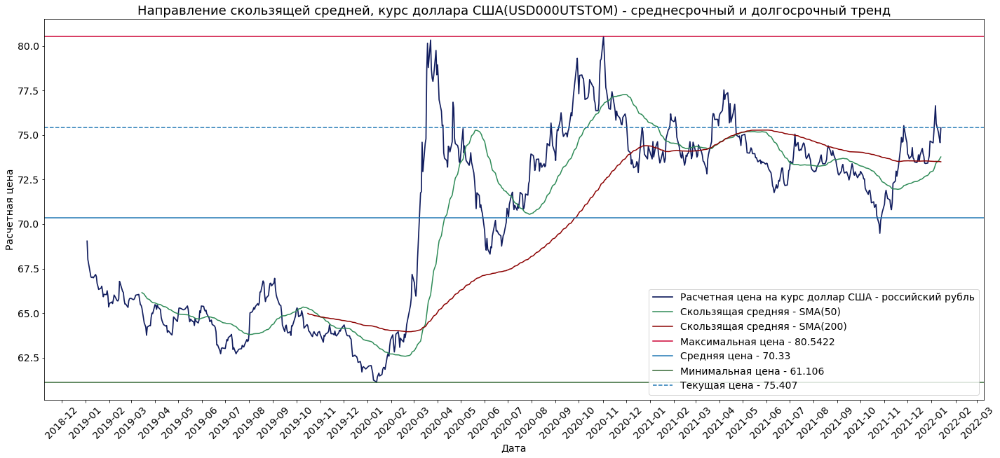

In [151]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(si_df['moment'], si_df['si_price'], label='Расчетная цена на курс доллар США - российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(si_df['moment'], si_df['si_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(si_df['moment'], si_df['si_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(si_df['si_price']), label='Максимальная цена - '+str(np.nanmax(si_df['si_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(si_df['si_price']), label='Средняя цена - '+str(round(np.mean(si_df['si_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(si_df['si_price']), label='Минимальная цена - '+str(np.nanmin(si_df['si_price'])), linestyle='-', color='#336633')
plt.axhline(y=si_df['si_price'].iat[-1], label='Текущая цена - '+str(si_df['si_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс доллара США(USD000UTSTOM) - среднесрочный и долгосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/Si.png')

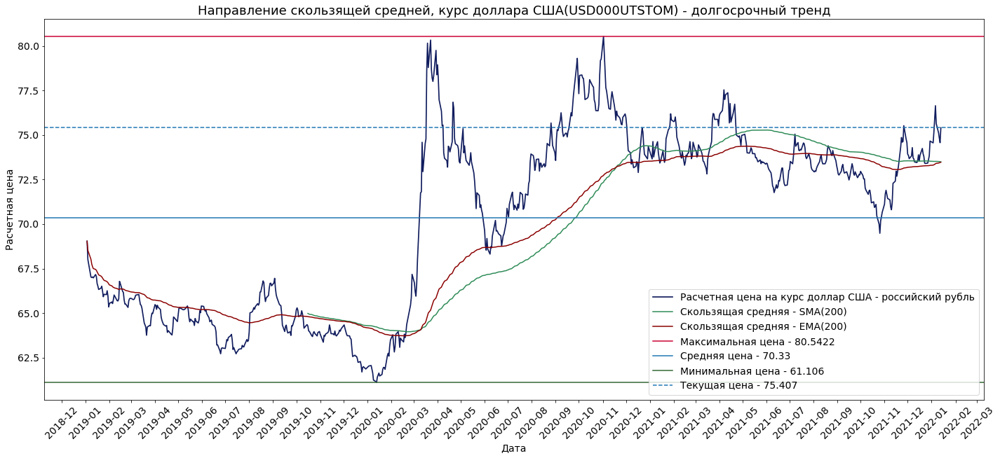

In [152]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(si_df['moment'], si_df['si_price'], label='Расчетная цена на курс доллар США - российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(si_df['moment'], si_df['si_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(si_df['moment'], si_df['si_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(si_df['si_price']), label='Максимальная цена - '+str(np.nanmax(si_df['si_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(si_df['si_price']), label='Средняя цена - '+str(round(np.mean(si_df['si_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(si_df['si_price']), label='Минимальная цена - '+str(np.nanmin(si_df['si_price'])), linestyle='-', color='#336633')
plt.axhline(y=si_df['si_price'].iat[-1], label='Текущая цена - '+str(si_df['si_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс доллара США(USD000UTSTOM) - долгосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

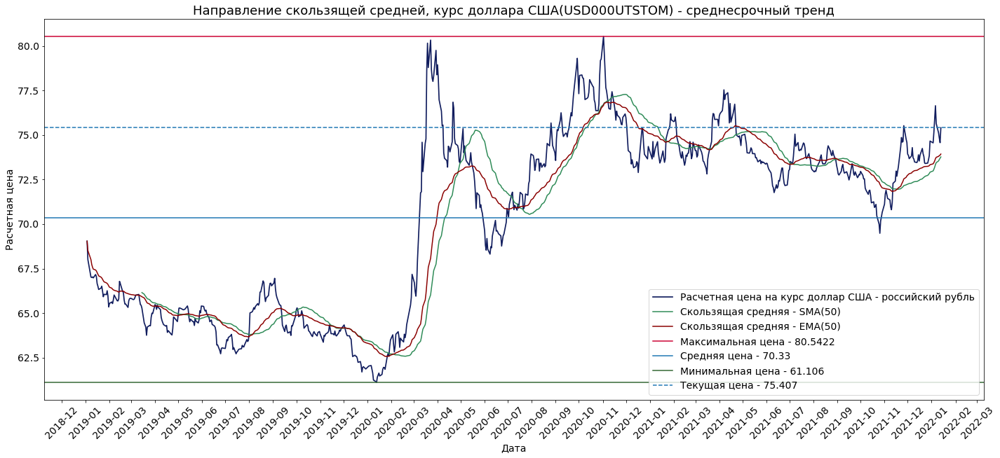

In [153]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(si_df['moment'], si_df['si_price'], label='Расчетная цена на курс доллар США - российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(si_df['moment'], si_df['si_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(si_df['moment'], si_df['si_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(si_df['si_price']), label='Максимальная цена - '+str(np.nanmax(si_df['si_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(si_df['si_price']), label='Средняя цена - '+str(round(np.mean(si_df['si_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(si_df['si_price']), label='Минимальная цена - '+str(np.nanmin(si_df['si_price'])), linestyle='-', color='#336633')
plt.axhline(y=si_df['si_price'].iat[-1], label='Текущая цена - '+str(si_df['si_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс доллара США(USD000UTSTOM) - среднесрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

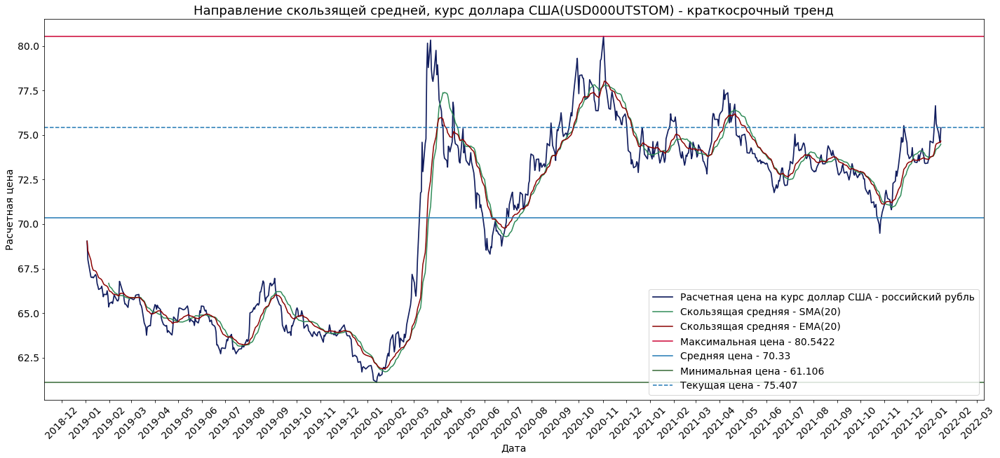

In [154]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(si_df['moment'], si_df['si_price'], label='Расчетная цена на курс доллар США - российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(si_df['moment'], si_df['si_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(si_df['moment'], si_df['si_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(si_df['si_price']), label='Максимальная цена - '+str(np.nanmax(si_df['si_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(si_df['si_price']), label='Средняя цена - '+str(round(np.mean(si_df['si_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(si_df['si_price']), label='Минимальная цена - '+str(np.nanmin(si_df['si_price'])), linestyle='-', color='#336633')
plt.axhline(y=si_df['si_price'].iat[-1], label='Текущая цена - '+str(si_df['si_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс доллара США(USD000UTSTOM) - краткосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [155]:
long_position_si_ind = round(si_df['long_position_si_ind'].iat[-1])
long_position_si_ent = round(si_df['long_position_si_ent'].iat[-1])

long_position_si = pd.DataFrame({'Количество договоров (контрактов)': [long_position_si_ind, long_position_si_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [156]:
short_position_si_ind = round(si_df['short_position_si_ind'].iat[-1])
short_position_si_ent = round(si_df['short_position_si_ent'].iat[-1])

short_position_si = pd.DataFrame({'Количество договоров (контрактов)': [short_position_si_ind, short_position_si_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

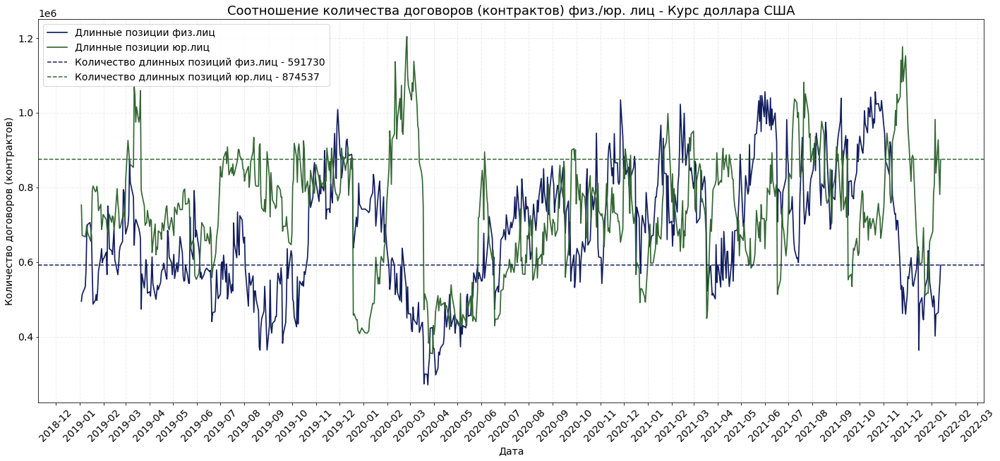

In [157]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(si_df['moment'], si_df['long_position_si_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(si_df['moment'], si_df['long_position_si_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=si_df['long_position_si_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(si_df['long_position_si_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=si_df['long_position_si_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(si_df['long_position_si_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - Курс доллара США', fontsize=18)
plt.legend()
plt.show()

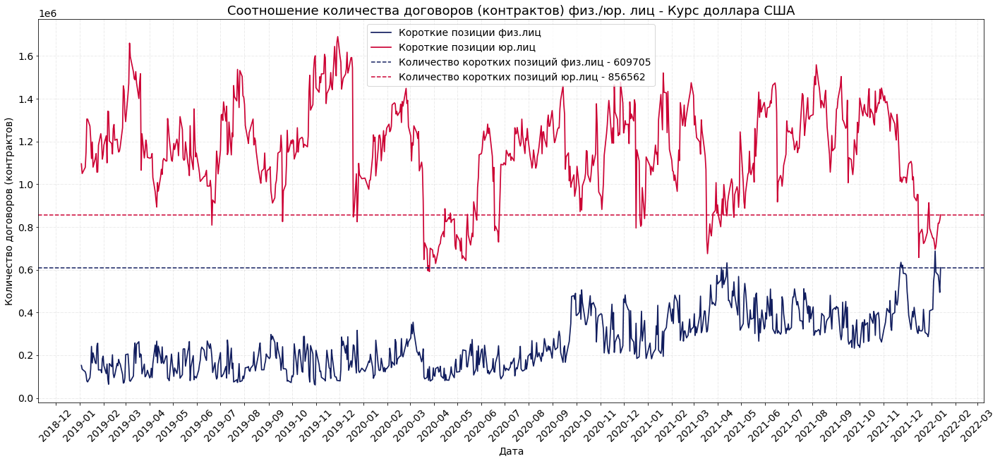

In [158]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(si_df['moment'], si_df['short_position_si_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(si_df['moment'], si_df['short_position_si_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=si_df['short_position_si_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(si_df['short_position_si_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=si_df['short_position_si_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(si_df['short_position_si_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - Курс доллара США', fontsize=18)
plt.legend()
plt.show()

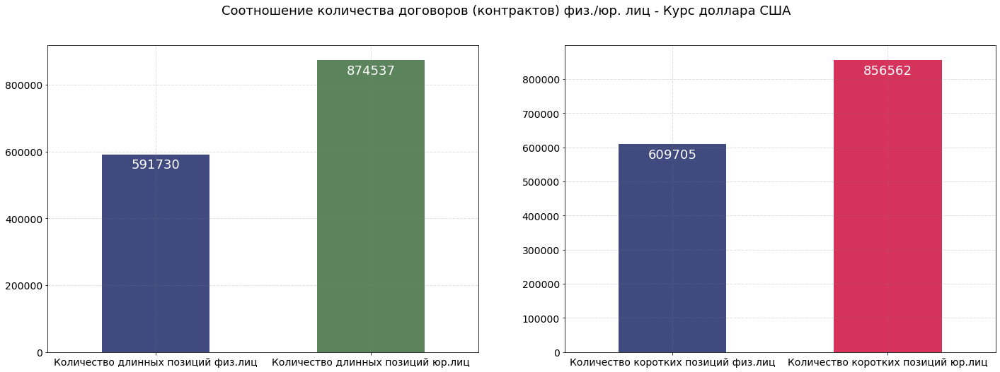

In [159]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_si['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_si['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - Курс доллара США', fontsize=18)
plt.show()

## <a id='402'>Курс евро-российский рубль на валютной бирже - EUR_RUB__TOM</a>  
- <a href='#0'>Table of contents</a>  

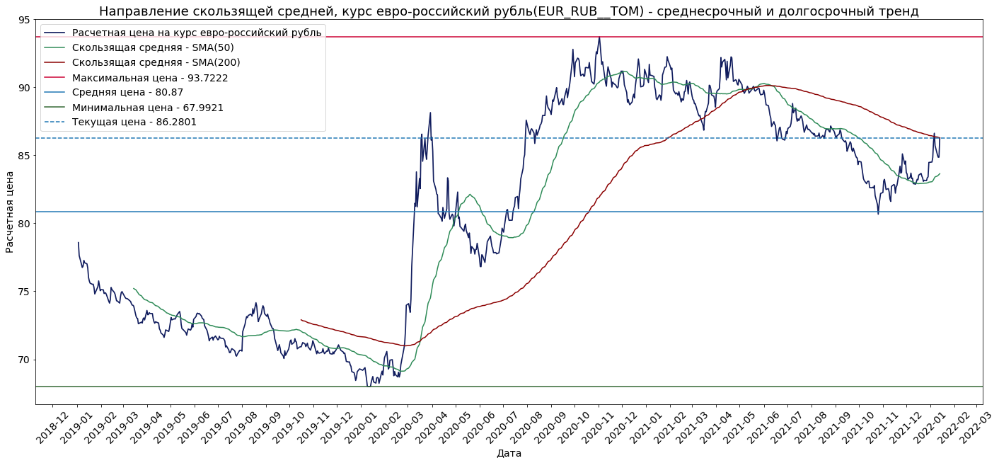

In [160]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(eu_df['moment'], eu_df['eu_price'], label='Расчетная цена на курс евро-российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(eu_df['moment'], eu_df['eu_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(eu_df['moment'], eu_df['eu_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(eu_df['eu_price']), label='Максимальная цена - '+str(np.nanmax(eu_df['eu_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(eu_df['eu_price']), label='Средняя цена - '+str(round(np.mean(eu_df['eu_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(eu_df['eu_price']), label='Минимальная цена - '+str(np.nanmin(eu_df['eu_price'])), linestyle='-', color='#336633')
plt.axhline(y=eu_df['eu_price'].iat[-1], label='Текущая цена - '+str(eu_df['eu_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс евро-российский рубль(EUR_RUB__TOM) - среднесрочный и долгосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/Eu.png')

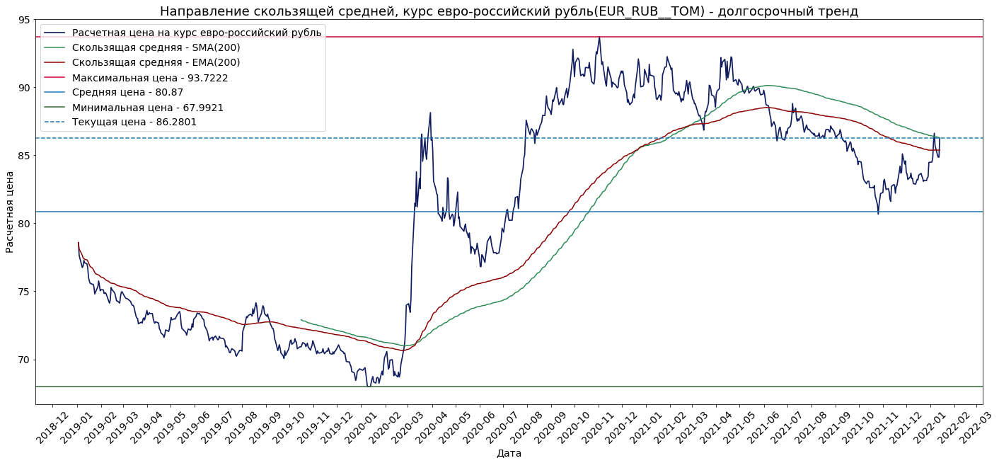

In [161]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(eu_df['moment'], eu_df['eu_price'], label='Расчетная цена на курс евро-российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(eu_df['moment'], eu_df['eu_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(eu_df['moment'], eu_df['eu_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(eu_df['eu_price']), label='Максимальная цена - '+str(np.nanmax(eu_df['eu_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(eu_df['eu_price']), label='Средняя цена - '+str(round(np.mean(eu_df['eu_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(eu_df['eu_price']), label='Минимальная цена - '+str(np.nanmin(eu_df['eu_price'])), linestyle='-', color='#336633')
plt.axhline(y=eu_df['eu_price'].iat[-1], label='Текущая цена - '+str(eu_df['eu_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс евро-российский рубль(EUR_RUB__TOM) - долгосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

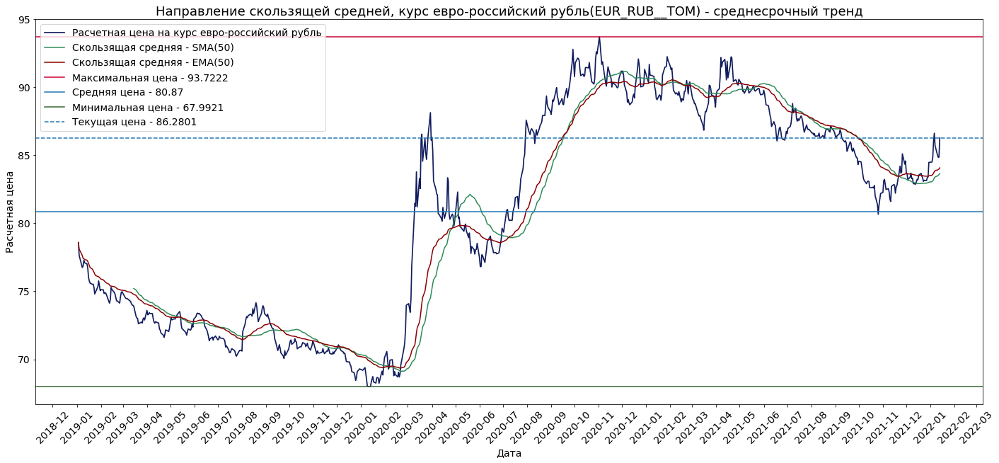

In [162]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(eu_df['moment'], eu_df['eu_price'], label='Расчетная цена на курс евро-российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(eu_df['moment'], eu_df['eu_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(eu_df['moment'], eu_df['eu_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(eu_df['eu_price']), label='Максимальная цена - '+str(np.nanmax(eu_df['eu_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(eu_df['eu_price']), label='Средняя цена - '+str(round(np.mean(eu_df['eu_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(eu_df['eu_price']), label='Минимальная цена - '+str(np.nanmin(eu_df['eu_price'])), linestyle='-', color='#336633')
plt.axhline(y=eu_df['eu_price'].iat[-1], label='Текущая цена - '+str(eu_df['eu_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс евро-российский рубль(EUR_RUB__TOM) - среднесрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

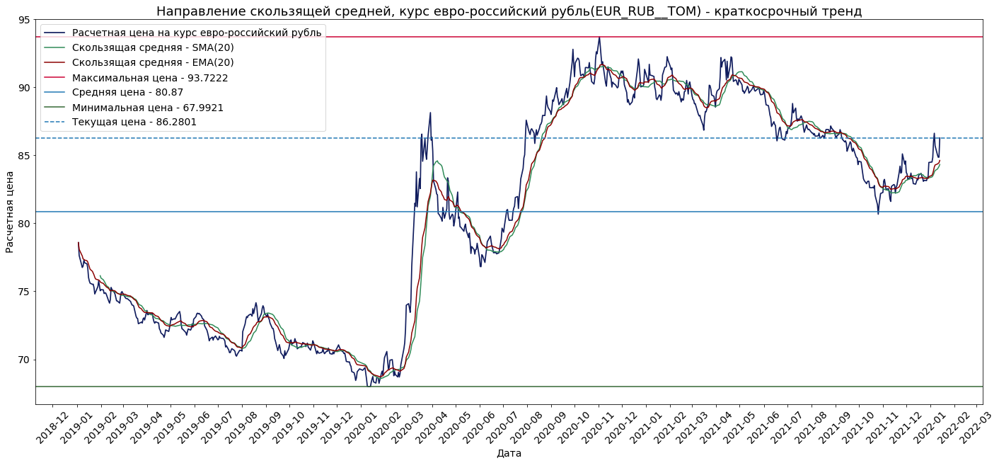

In [163]:
fig, ax = plt.subplots(figsize=(24, 10))
ax.plot(eu_df['moment'], eu_df['eu_price'], label='Расчетная цена на курс евро-российский рубль', color='#111d5e', linewidth=1.7)
plt.plot(eu_df['moment'], eu_df['eu_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(eu_df['moment'], eu_df['eu_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(eu_df['eu_price']), label='Максимальная цена - '+str(np.nanmax(eu_df['eu_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(eu_df['eu_price']), label='Средняя цена - '+str(round(np.mean(eu_df['eu_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(eu_df['eu_price']), label='Минимальная цена - '+str(np.nanmin(eu_df['eu_price'])), linestyle='-', color='#336633')
plt.axhline(y=eu_df['eu_price'].iat[-1], label='Текущая цена - '+str(eu_df['eu_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней, курс евро-российский рубль(EUR_RUB__TOM) - краткосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [164]:
long_position_eu_ind = round(eu_df['long_position_eu_ind'].iat[-1])
long_position_eu_ent = round(eu_df['long_position_eu_ent'].iat[-1])

long_position_eu = pd.DataFrame({'Количество договоров (контрактов)': [long_position_eu_ind, long_position_eu_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [165]:
short_position_eu_ind = round(eu_df['short_position_eu_ind'].iat[-1])
short_position_eu_ent = round(eu_df['short_position_eu_ent'].iat[-1])

short_position_eu = pd.DataFrame({'Количество договоров (контрактов)': [short_position_eu_ind, short_position_eu_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

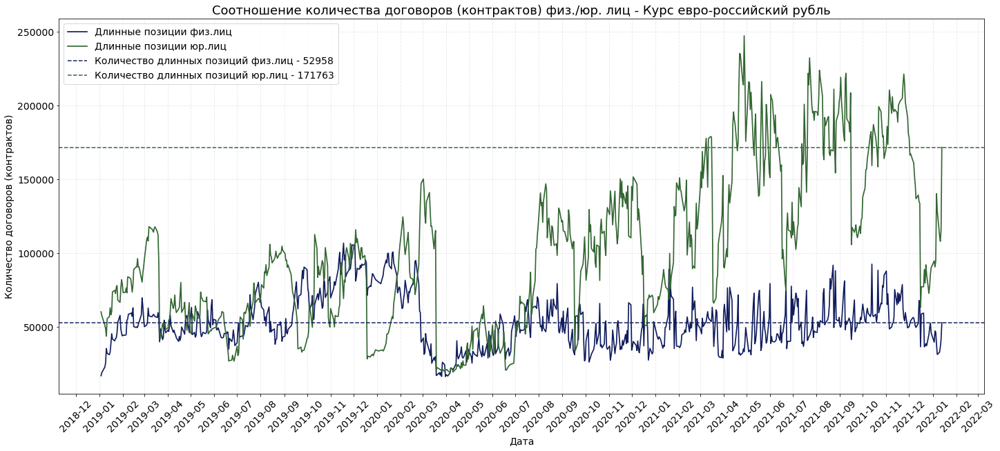

In [166]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(eu_df['moment'], eu_df['long_position_eu_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(eu_df['moment'], eu_df['long_position_eu_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=eu_df['long_position_eu_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(eu_df['long_position_eu_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=eu_df['long_position_eu_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(eu_df['long_position_eu_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - Курс евро-российский рубль', fontsize=18)
plt.legend()
plt.show()

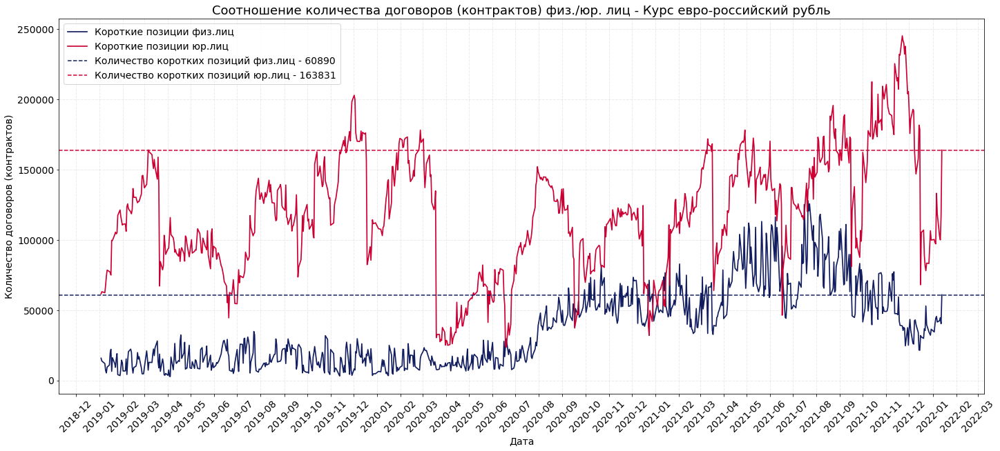

In [167]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(eu_df['moment'], eu_df['short_position_eu_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(eu_df['moment'], eu_df['short_position_eu_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=eu_df['short_position_eu_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(eu_df['short_position_eu_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=eu_df['short_position_eu_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(eu_df['short_position_eu_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - Курс евро-российский рубль', fontsize=18)
plt.legend()
plt.show()

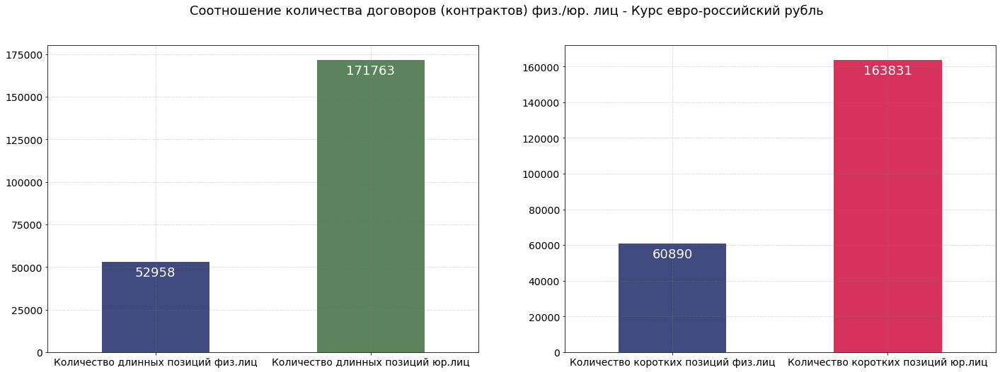

In [168]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_eu['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_eu['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - Курс евро-российский рубль', fontsize=18)
plt.show()

## <a id='403'>Публичное акционерное общество "Сбербанк России", акция обыкновенная (SBER)</a>  
- <a href='#0'>Table of contents</a>  

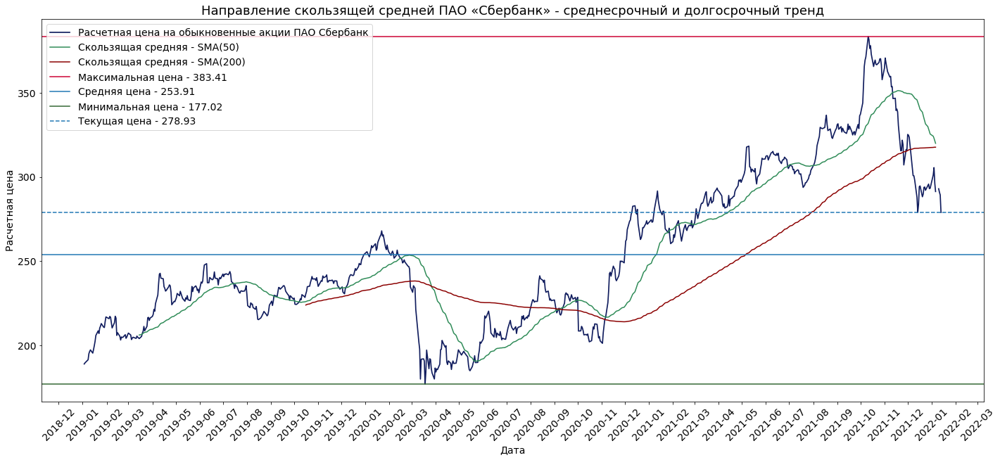

In [169]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(sber_df['moment'], sber_df['sber_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО Сбербанк', linewidth=1.7)
plt.plot(sber_df['moment'], sber_df['sber_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(sber_df['moment'], sber_df['sber_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(sber_df['sber_price']), label='Максимальная цена - '+str(np.nanmax(sber_df['sber_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(sber_df['sber_price']), label='Средняя цена - '+str(round(np.mean(sber_df['sber_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(sber_df['sber_price']), label='Минимальная цена - '+str(np.nanmin(sber_df['sber_price'])), linestyle='-', color='#336633')
plt.axhline(y=sber_df['sber_price'].iat[-1], label='Текущая цена - '+str(sber_df['sber_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Сбербанк» - среднесрочный и долгосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/SBRF.png')

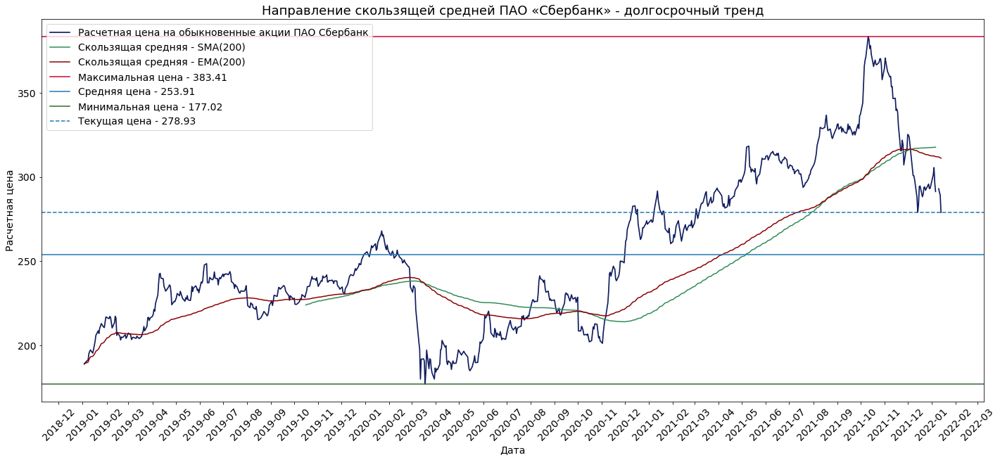

In [170]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(sber_df['moment'], sber_df['sber_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО Сбербанк', linewidth=1.7)
plt.plot(sber_df['moment'], sber_df['sber_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(sber_df['moment'], sber_df['sber_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(sber_df['sber_price']), label='Максимальная цена - '+str(np.nanmax(sber_df['sber_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(sber_df['sber_price']), label='Средняя цена - '+str(round(np.mean(sber_df['sber_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(sber_df['sber_price']), label='Минимальная цена - '+str(np.nanmin(sber_df['sber_price'])), linestyle='-', color='#336633')
plt.axhline(y=sber_df['sber_price'].iat[-1], label='Текущая цена - '+str(sber_df['sber_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Сбербанк» - долгосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

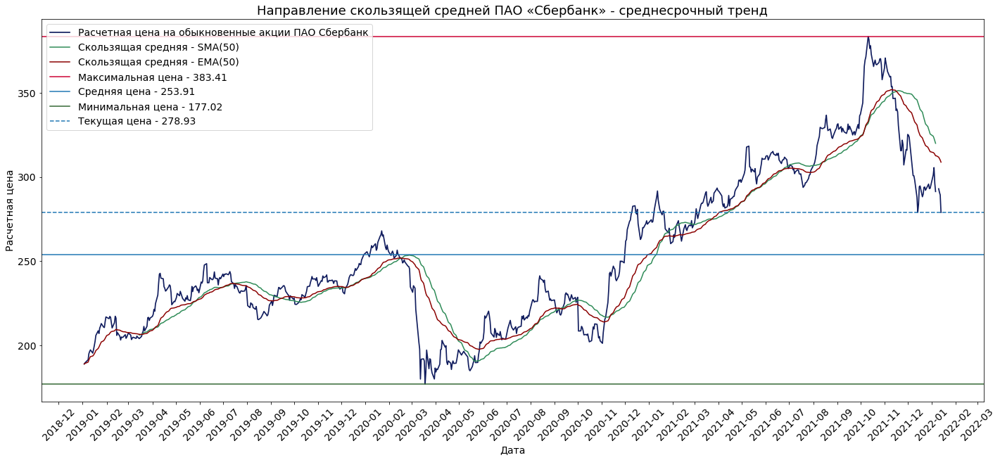

In [171]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(sber_df['moment'], sber_df['sber_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО Сбербанк', linewidth=1.7)
plt.plot(sber_df['moment'], sber_df['sber_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(sber_df['moment'], sber_df['sber_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(sber_df['sber_price']), label='Максимальная цена - '+str(np.nanmax(sber_df['sber_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(sber_df['sber_price']), label='Средняя цена - '+str(round(np.mean(sber_df['sber_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(sber_df['sber_price']), label='Минимальная цена - '+str(np.nanmin(sber_df['sber_price'])), linestyle='-', color='#336633')
plt.axhline(y=sber_df['sber_price'].iat[-1], label='Текущая цена - '+str(sber_df['sber_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Сбербанк» - среднесрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

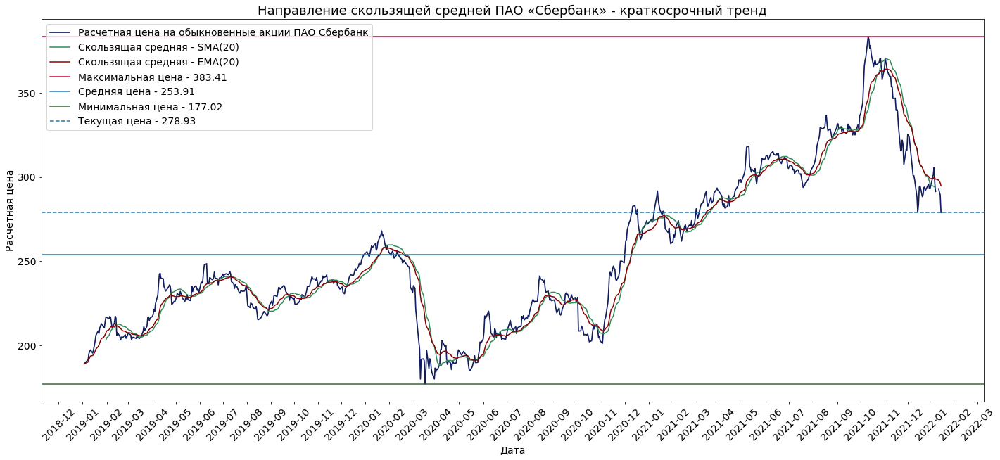

In [172]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(sber_df['moment'], sber_df['sber_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО Сбербанк', linewidth=1.7)
plt.plot(sber_df['moment'], sber_df['sber_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(sber_df['moment'], sber_df['sber_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(sber_df['sber_price']), label='Максимальная цена - '+str(np.nanmax(sber_df['sber_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(sber_df['sber_price']), label='Средняя цена - '+str(round(np.mean(sber_df['sber_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(sber_df['sber_price']), label='Минимальная цена - '+str(np.nanmin(sber_df['sber_price'])), linestyle='-', color='#336633')
plt.axhline(y=sber_df['sber_price'].iat[-1], label='Текущая цена - '+str(sber_df['sber_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Сбербанк» - краткосрочный тренд', fontsize=18)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [173]:
long_position_sbrf_ind = round(sber_df['long_position_sbrf_ind'].iat[-1])
long_position_sbrf_ent = round(sber_df['long_position_sbrf_ent'].iat[-1])

long_position_sbrf = pd.DataFrame({'Количество договоров (контрактов)': [long_position_sbrf_ind, long_position_sbrf_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [174]:
short_position_sbrf_ind = round(sber_df['short_position_sbrf_ind'].iat[-1])
short_position_sbrf_ent = round(sber_df['short_position_sbrf_ent'].iat[-1])

short_position_sbrf = pd.DataFrame({'Количество договоров (контрактов)': [short_position_sbrf_ind, short_position_sbrf_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

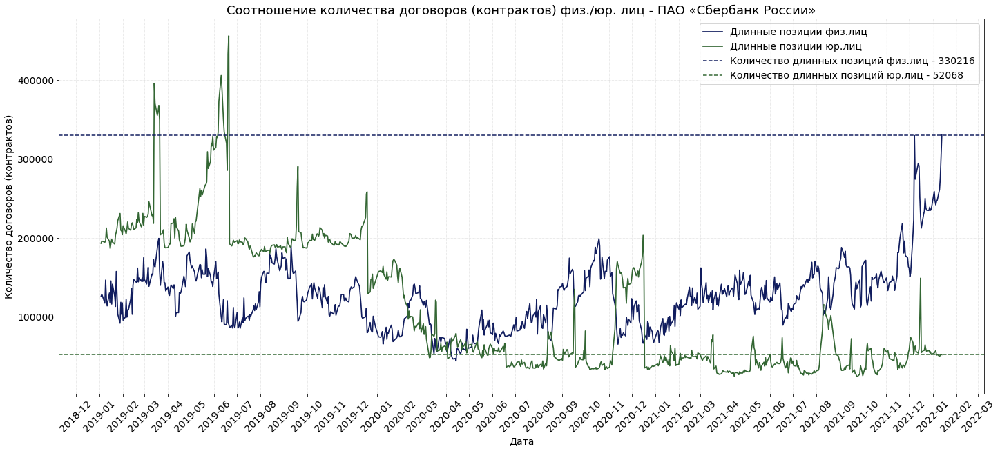

In [175]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(sber_df['moment'], sber_df['long_position_sbrf_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(sber_df['moment'], sber_df['long_position_sbrf_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=sber_df['long_position_sbrf_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(sber_df['long_position_sbrf_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=sber_df['long_position_sbrf_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(sber_df['long_position_sbrf_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Сбербанк России»', fontsize=18)
plt.legend()
plt.show()

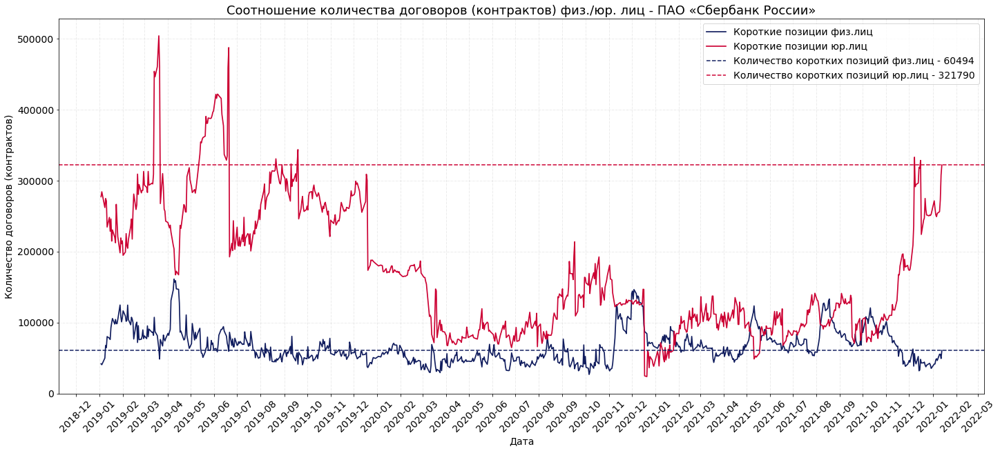

In [176]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(sber_df['moment'], sber_df['short_position_sbrf_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(sber_df['moment'], sber_df['short_position_sbrf_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=sber_df['short_position_sbrf_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(sber_df['short_position_sbrf_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=sber_df['short_position_sbrf_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(sber_df['short_position_sbrf_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Сбербанк России»', fontsize=18)
plt.legend()
plt.show()

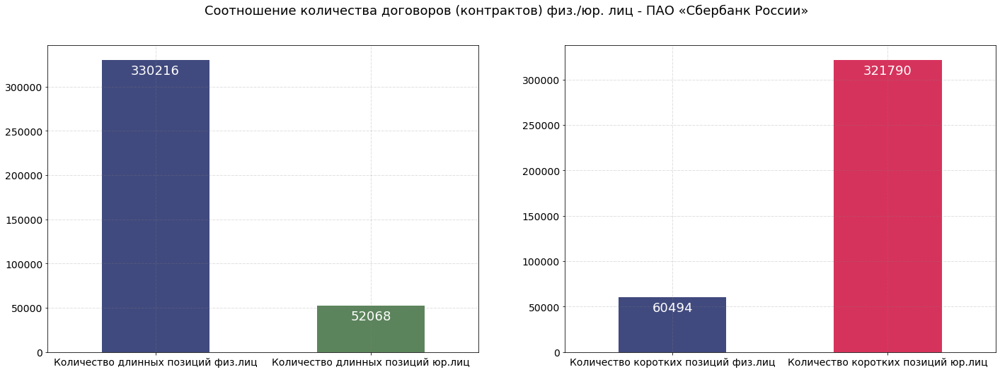

In [177]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_sbrf['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_sbrf['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Сбербанк России»', fontsize=18)
plt.show()

## <a id='404'>Банк ВТБ (публичное акционерное общество), акция обыкновенная (VTBR)</a>  
- <a href='#0'>Table of contents</a>  

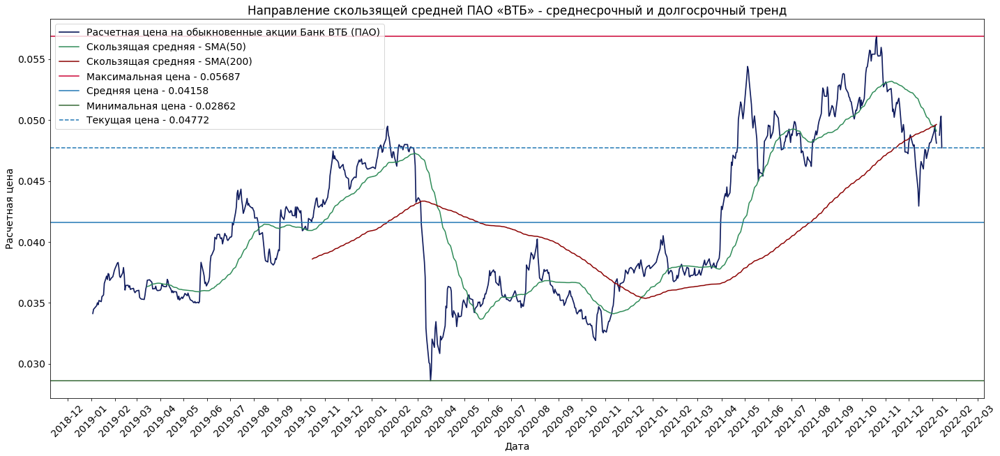

In [178]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции Банк ВТБ (ПАО)', linewidth=1.7)
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(vtbr_df['vtbr_price']), label='Максимальная цена - '+str(np.nanmax(vtbr_df['vtbr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(vtbr_df['vtbr_price']), label='Средняя цена - '+str(round(np.mean(vtbr_df['vtbr_price']), 5)), linestyle='-')
plt.axhline(y=np.nanmin(vtbr_df['vtbr_price']), label='Минимальная цена - '+str(np.nanmin(vtbr_df['vtbr_price'])), linestyle='-', color='#336633')
plt.axhline(y=vtbr_df['vtbr_price'].iat[-1], label='Текущая цена - '+str(vtbr_df['vtbr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ВТБ» - среднесрочный и долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/VTBR.png')

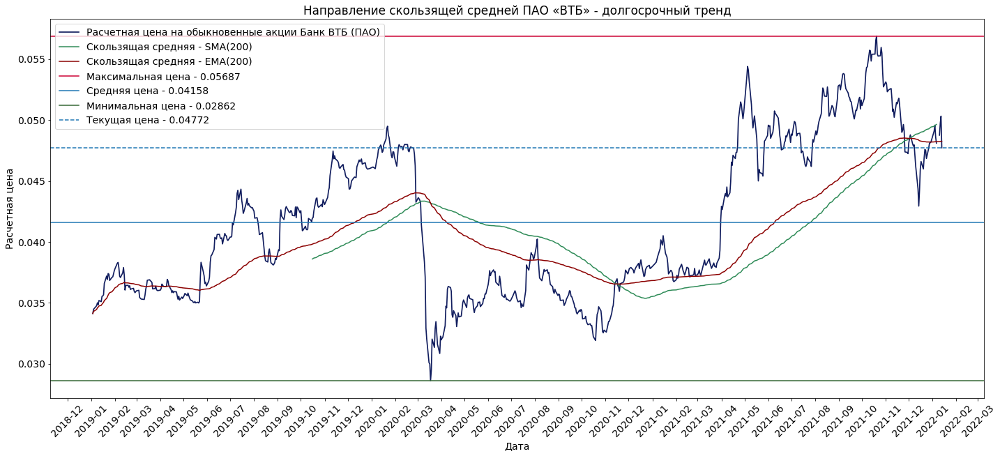

In [179]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции Банк ВТБ (ПАО)', linewidth=1.7)
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(vtbr_df['vtbr_price']), label='Максимальная цена - '+str(np.nanmax(vtbr_df['vtbr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(vtbr_df['vtbr_price']), label='Средняя цена - '+str(round(np.mean(vtbr_df['vtbr_price']), 5)), linestyle='-')
plt.axhline(y=np.nanmin(vtbr_df['vtbr_price']), label='Минимальная цена - '+str(np.nanmin(vtbr_df['vtbr_price'])), linestyle='-', color='#336633')
plt.axhline(y=vtbr_df['vtbr_price'].iat[-1], label='Текущая цена - '+str(vtbr_df['vtbr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ВТБ» - долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

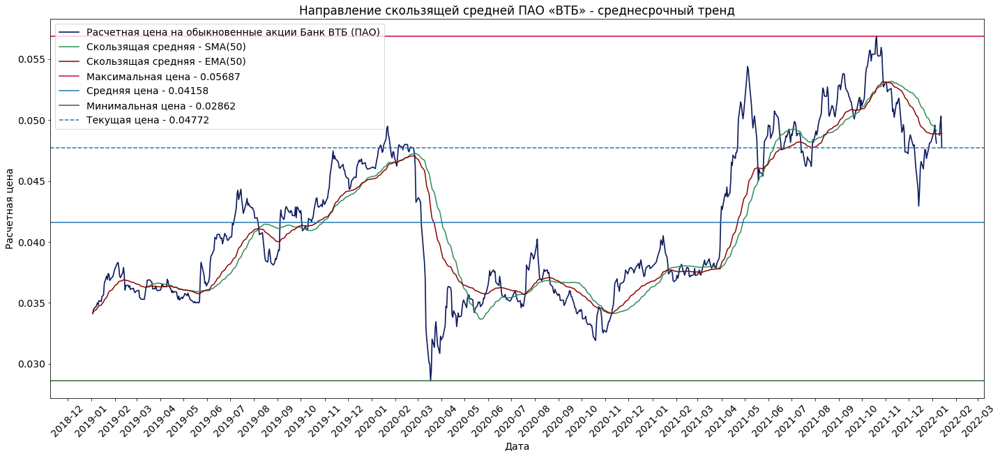

In [180]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции Банк ВТБ (ПАО)', linewidth=1.7)
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(vtbr_df['vtbr_price']), label='Максимальная цена - '+str(np.nanmax(vtbr_df['vtbr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(vtbr_df['vtbr_price']), label='Средняя цена - '+str(round(np.mean(vtbr_df['vtbr_price']), 5)), linestyle='-')
plt.axhline(y=np.nanmin(vtbr_df['vtbr_price']), label='Минимальная цена - '+str(np.nanmin(vtbr_df['vtbr_price'])), linestyle='-', color='#336633')
plt.axhline(y=vtbr_df['vtbr_price'].iat[-1], label='Текущая цена - '+str(vtbr_df['vtbr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ВТБ» - среднесрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

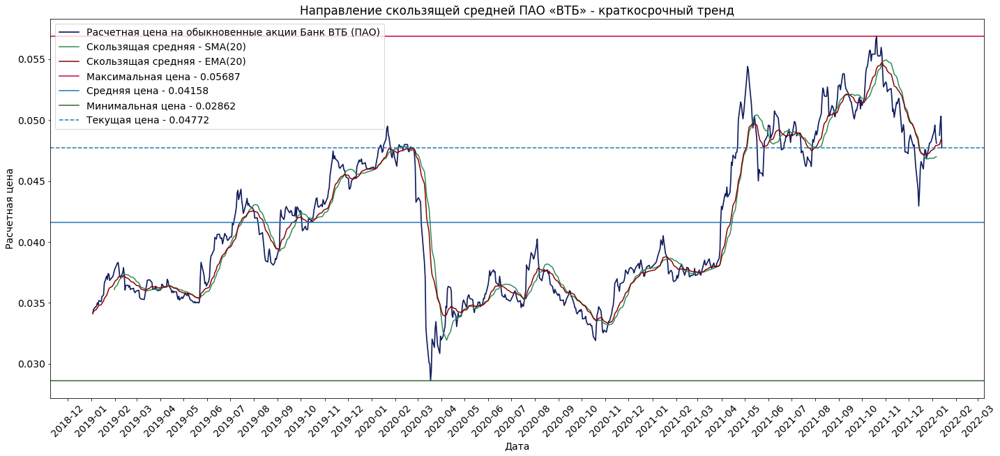

In [181]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции Банк ВТБ (ПАО)', linewidth=1.7)
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(vtbr_df['moment'], vtbr_df['vtbr_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(vtbr_df['vtbr_price']), label='Максимальная цена - '+str(np.nanmax(vtbr_df['vtbr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(vtbr_df['vtbr_price']), label='Средняя цена - '+str(round(np.mean(vtbr_df['vtbr_price']), 5)), linestyle='-')
plt.axhline(y=np.nanmin(vtbr_df['vtbr_price']), label='Минимальная цена - '+str(np.nanmin(vtbr_df['vtbr_price'])), linestyle='-', color='#336633')
plt.axhline(y=vtbr_df['vtbr_price'].iat[-1], label='Текущая цена - '+str(vtbr_df['vtbr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ВТБ» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [182]:
long_position_vtbr_ind = round(vtbr_df['long_position_vtbr_ind'].iat[-1])
long_position_vtbr_ent = round(vtbr_df['long_position_vtbr_ent'].iat[-1])

long_position_vtbr = pd.DataFrame({'Количество договоров (контрактов)': [long_position_vtbr_ind, long_position_vtbr_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [183]:
short_position_vtbr_ind = round(vtbr_df['short_position_vtbr_ind'].iat[-1])
short_position_vtbr_ent = round(vtbr_df['short_position_vtbr_ent'].iat[-1])

short_position_vtbr = pd.DataFrame({'Количество договоров (контрактов)': [short_position_vtbr_ind, short_position_vtbr_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

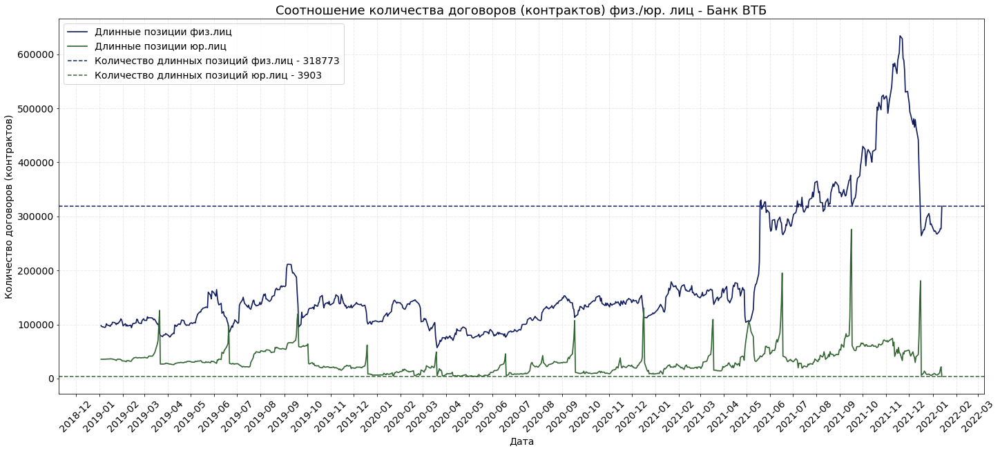

In [184]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], vtbr_df['long_position_vtbr_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(vtbr_df['moment'], vtbr_df['long_position_vtbr_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=vtbr_df['long_position_vtbr_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(vtbr_df['long_position_vtbr_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=vtbr_df['long_position_vtbr_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(vtbr_df['long_position_vtbr_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - Банк ВТБ', fontsize=18)
plt.legend()
plt.show()

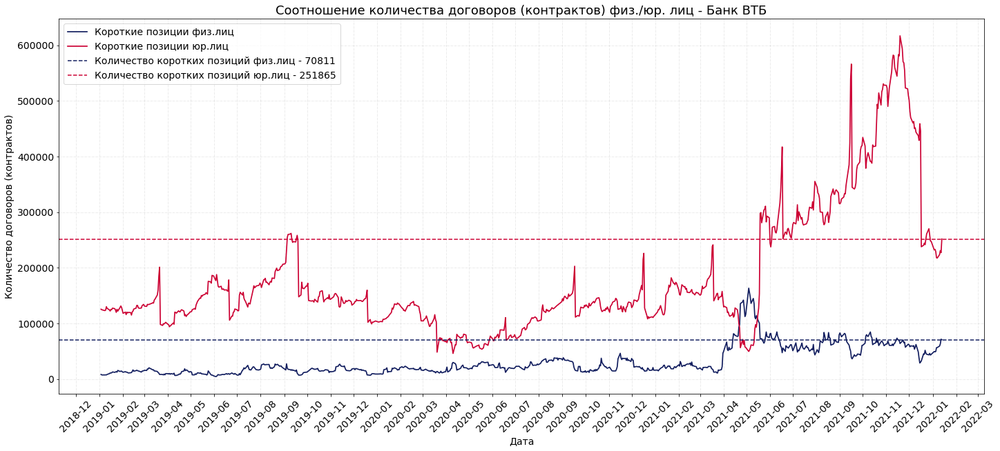

In [185]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], vtbr_df['short_position_vtbr_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(vtbr_df['moment'], vtbr_df['short_position_vtbr_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=vtbr_df['short_position_vtbr_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(vtbr_df['short_position_vtbr_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=vtbr_df['short_position_vtbr_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(vtbr_df['short_position_vtbr_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - Банк ВТБ', fontsize=18)
plt.legend()
plt.show()

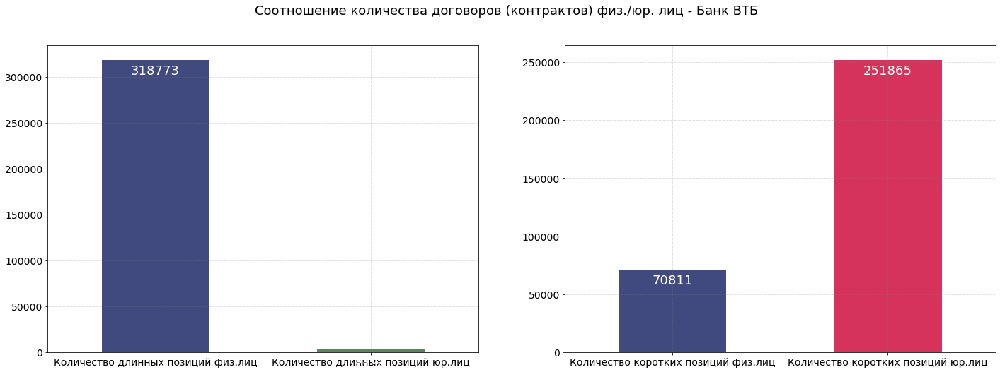

In [186]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_vtbr['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_vtbr['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - Банк ВТБ', fontsize=18)
plt.show()

## <a id='405'>Публичное акционерное общество "Газпром", акция обыкновенная (GAZP)</a>  
- <a href='#0'>Table of contents</a>  

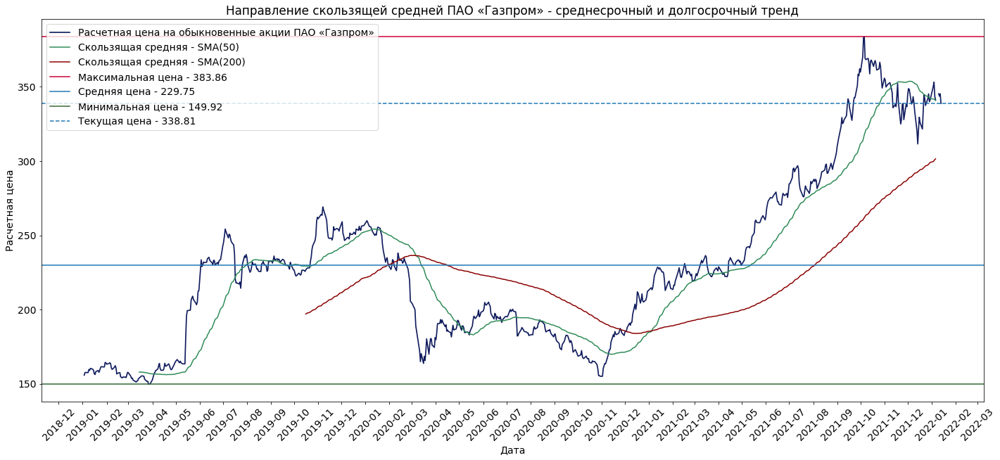

In [187]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gazr_df['moment'], gazr_df['gazr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Газпром»', linewidth=1.7)
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(gazr_df['gazr_price']), label='Максимальная цена - '+str(np.nanmax(gazr_df['gazr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gazr_df['gazr_price']), label='Средняя цена - '+str(round(np.mean(gazr_df['gazr_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(gazr_df['gazr_price']), label='Минимальная цена - '+str(np.nanmin(gazr_df['gazr_price'])), linestyle='-', color='#336633')
plt.axhline(y=gazr_df['gazr_price'].iat[-1], label='Текущая цена - '+str(gazr_df['gazr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Газпром» - среднесрочный и долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/GAZP.png')

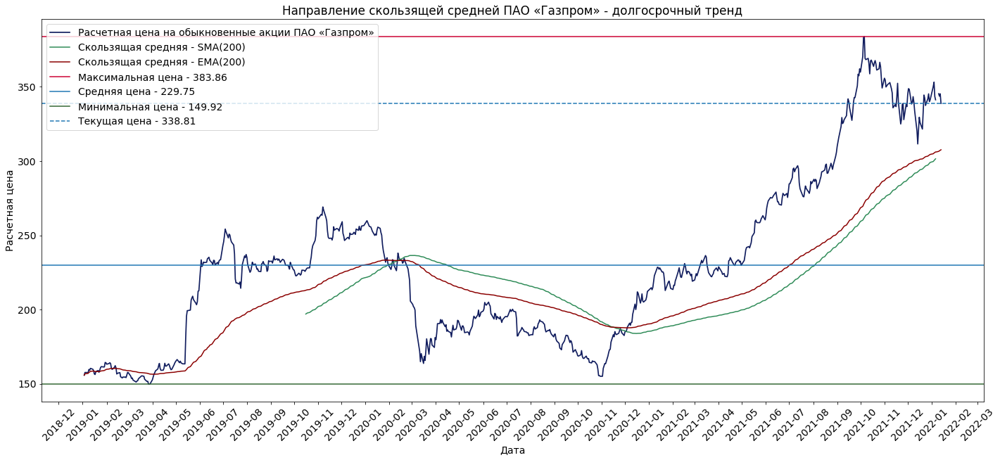

In [188]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gazr_df['moment'], gazr_df['gazr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Газпром»', linewidth=1.7)
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(gazr_df['gazr_price']), label='Максимальная цена - '+str(np.nanmax(gazr_df['gazr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gazr_df['gazr_price']), label='Средняя цена - '+str(round(np.mean(gazr_df['gazr_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(gazr_df['gazr_price']), label='Минимальная цена - '+str(np.nanmin(gazr_df['gazr_price'])), linestyle='-', color='#336633')
plt.axhline(y=gazr_df['gazr_price'].iat[-1], label='Текущая цена - '+str(gazr_df['gazr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Газпром» - долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

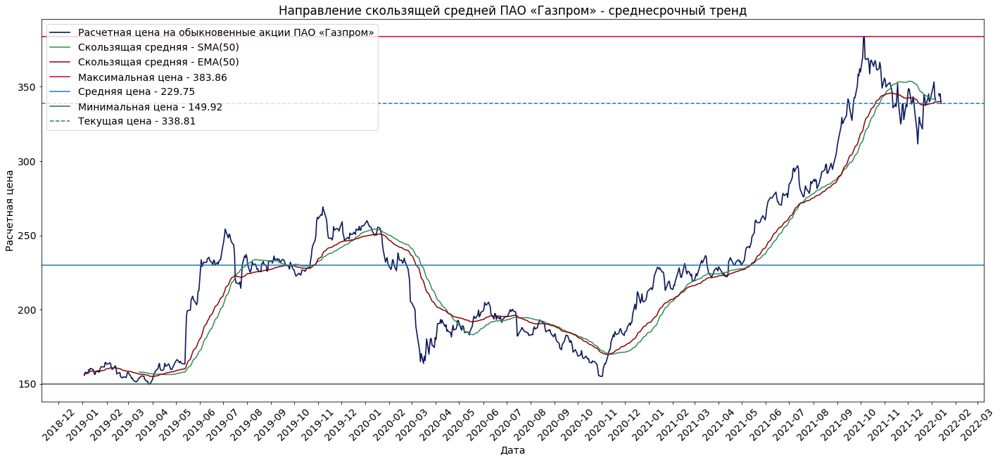

In [189]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gazr_df['moment'], gazr_df['gazr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Газпром»', linewidth=1.7)
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(gazr_df['gazr_price']), label='Максимальная цена - '+str(np.nanmax(gazr_df['gazr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gazr_df['gazr_price']), label='Средняя цена - '+str(round(np.mean(gazr_df['gazr_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(gazr_df['gazr_price']), label='Минимальная цена - '+str(np.nanmin(gazr_df['gazr_price'])), linestyle='-', color='#336633')
plt.axhline(y=gazr_df['gazr_price'].iat[-1], label='Текущая цена - '+str(gazr_df['gazr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Газпром» - среднесрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

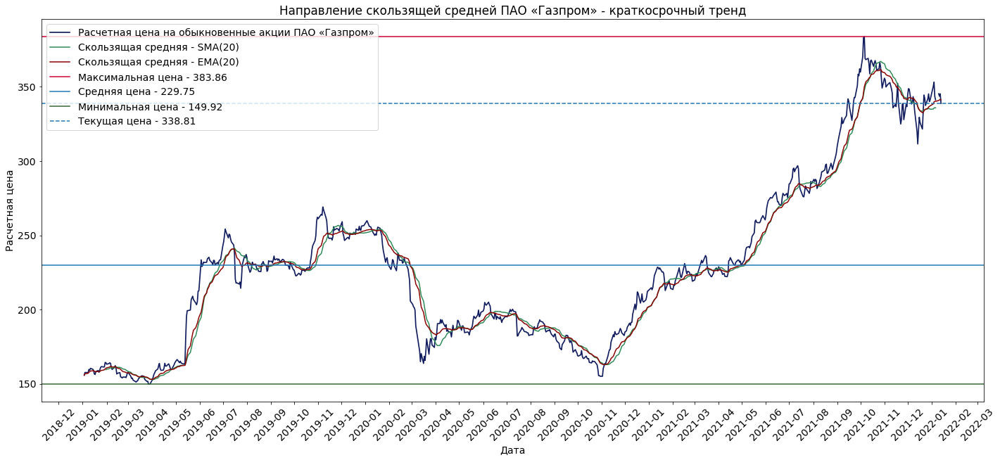

In [190]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gazr_df['moment'], gazr_df['gazr_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Газпром»', linewidth=1.7)
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(gazr_df['moment'], gazr_df['gazr_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(gazr_df['gazr_price']), label='Максимальная цена - '+str(np.nanmax(gazr_df['gazr_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gazr_df['gazr_price']), label='Средняя цена - '+str(round(np.mean(gazr_df['gazr_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(gazr_df['gazr_price']), label='Минимальная цена - '+str(np.nanmin(gazr_df['gazr_price'])), linestyle='-', color='#336633')
plt.axhline(y=gazr_df['gazr_price'].iat[-1], label='Текущая цена - '+str(gazr_df['gazr_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Газпром» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [191]:
long_position_gazr_ind = round(gazr_df['long_position_gazr_ind'].iat[-1])
long_position_gazr_ent = round(gazr_df['long_position_gazr_ent'].iat[-1])

long_position_gazr = pd.DataFrame({'Количество договоров (контрактов)': [long_position_gazr_ind, long_position_gazr_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [192]:
short_position_gazr_ind = round(gazr_df['short_position_gazr_ind'].iat[-1])
short_position_gazr_ent = round(gazr_df['short_position_gazr_ent'].iat[-1])

short_position_gazr = pd.DataFrame({'Количество договоров (контрактов)': [short_position_gazr_ind, short_position_gazr_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

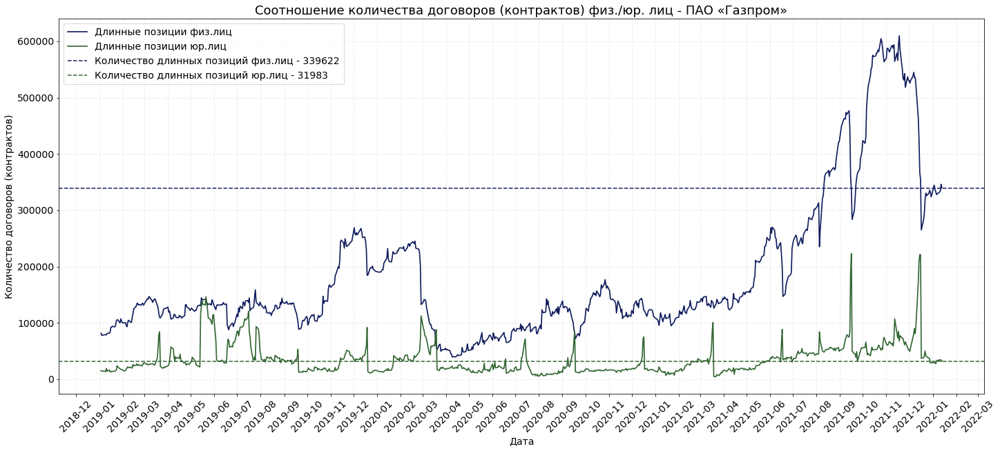

In [193]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gazr_df['moment'], gazr_df['long_position_gazr_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(gazr_df['moment'], gazr_df['long_position_gazr_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=gazr_df['long_position_gazr_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(gazr_df['long_position_gazr_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=gazr_df['long_position_gazr_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(gazr_df['long_position_gazr_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Газпром»', fontsize=18)
plt.legend()
plt.show()

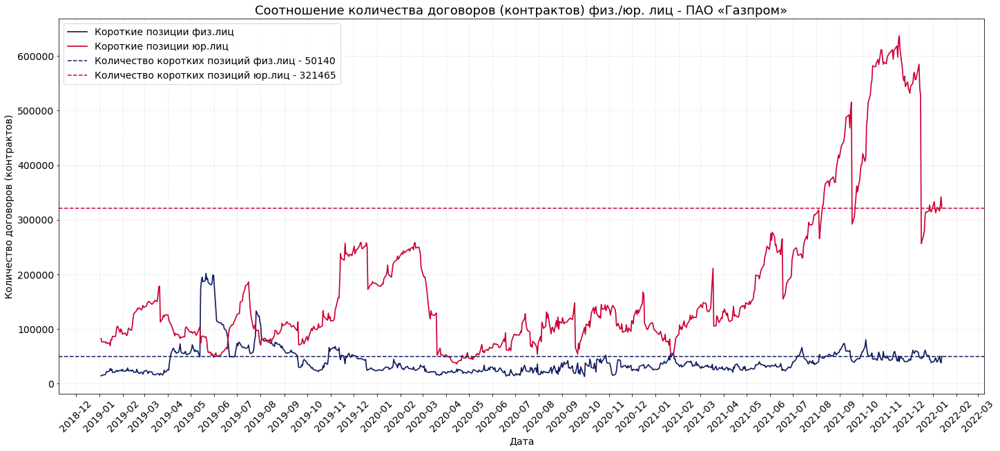

In [194]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gazr_df['moment'], gazr_df['short_position_gazr_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(gazr_df['moment'], gazr_df['short_position_gazr_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=gazr_df['short_position_gazr_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(gazr_df['short_position_gazr_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=gazr_df['short_position_gazr_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(gazr_df['short_position_gazr_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Газпром»', fontsize=18)
plt.legend()
plt.show()

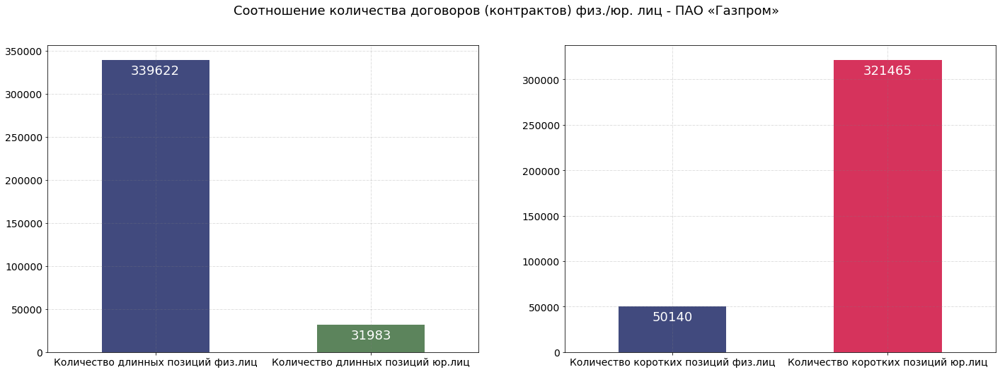

In [195]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_gazr['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_gazr['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Газпром»', fontsize=18)
plt.show()

## <a id='406'>Публичное акционерное общество "Нефтяная компания "ЛУКОЙЛ", акция обыкновенная (LKOH)</a>  
- <a href='#0'>Table of contents</a>  

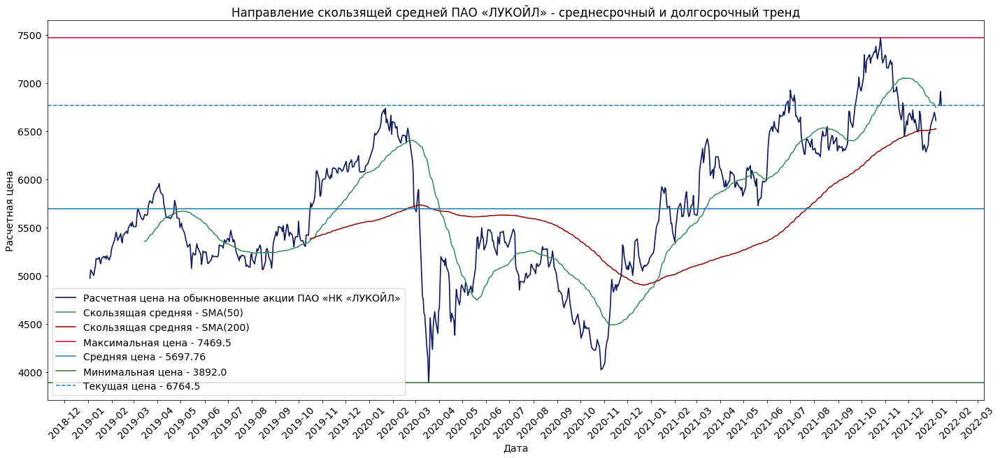

In [196]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «ЛУКОЙЛ»', linewidth=1.7)
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(lkoh_df['lkoh_price']), label='Максимальная цена - '+str(np.nanmax(lkoh_df['lkoh_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(lkoh_df['lkoh_price']), label='Средняя цена - '+str(round(np.mean(lkoh_df['lkoh_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(lkoh_df['lkoh_price']), label='Минимальная цена - '+str(np.nanmin(lkoh_df['lkoh_price'])), linestyle='-', color='#336633')
plt.axhline(y=lkoh_df['lkoh_price'].iat[-1], label='Текущая цена - '+str(lkoh_df['lkoh_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ЛУКОЙЛ» - среднесрочный и долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/LKOH.png')

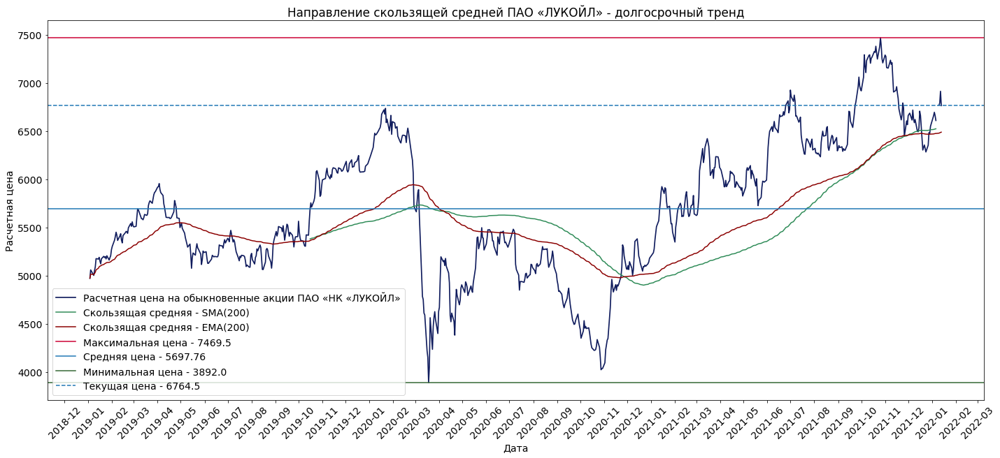

In [197]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «ЛУКОЙЛ»', linewidth=1.7)
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(lkoh_df['lkoh_price']), label='Максимальная цена - '+str(np.nanmax(lkoh_df['lkoh_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(lkoh_df['lkoh_price']), label='Средняя цена - '+str(round(np.mean(lkoh_df['lkoh_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(lkoh_df['lkoh_price']), label='Минимальная цена - '+str(np.nanmin(lkoh_df['lkoh_price'])), linestyle='-', color='#336633')
plt.axhline(y=lkoh_df['lkoh_price'].iat[-1], label='Текущая цена - '+str(lkoh_df['lkoh_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ЛУКОЙЛ» - долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

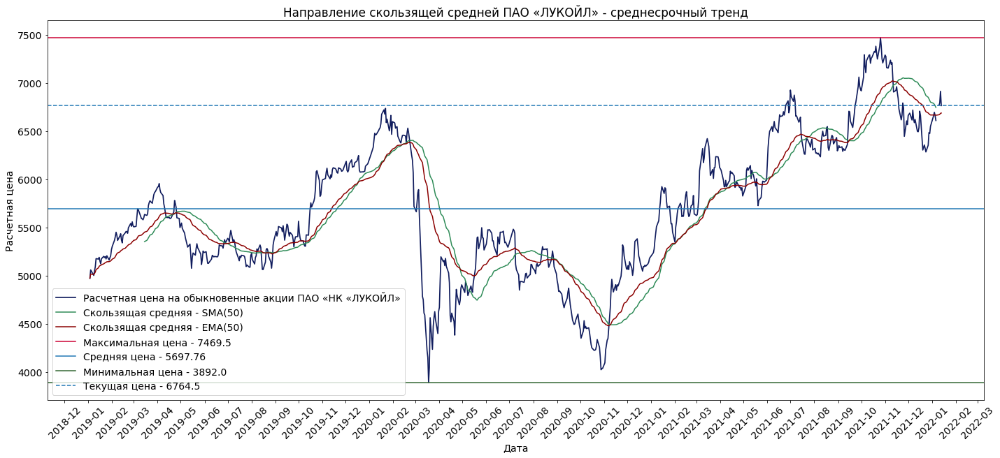

In [198]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «ЛУКОЙЛ»', linewidth=1.7)
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(lkoh_df['lkoh_price']), label='Максимальная цена - '+str(np.nanmax(lkoh_df['lkoh_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(lkoh_df['lkoh_price']), label='Средняя цена - '+str(round(np.mean(lkoh_df['lkoh_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(lkoh_df['lkoh_price']), label='Минимальная цена - '+str(np.nanmin(lkoh_df['lkoh_price'])), linestyle='-', color='#336633')
plt.axhline(y=lkoh_df['lkoh_price'].iat[-1], label='Текущая цена - '+str(lkoh_df['lkoh_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ЛУКОЙЛ» - среднесрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

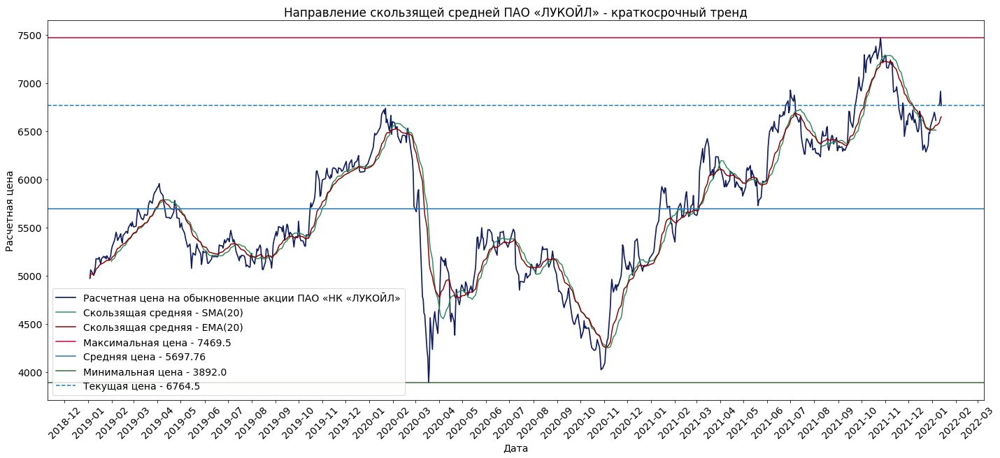

In [199]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «ЛУКОЙЛ»', linewidth=1.7)
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(lkoh_df['moment'], lkoh_df['lkoh_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(lkoh_df['lkoh_price']), label='Максимальная цена - '+str(np.nanmax(lkoh_df['lkoh_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(lkoh_df['lkoh_price']), label='Средняя цена - '+str(round(np.mean(lkoh_df['lkoh_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(lkoh_df['lkoh_price']), label='Минимальная цена - '+str(np.nanmin(lkoh_df['lkoh_price'])), linestyle='-', color='#336633')
plt.axhline(y=lkoh_df['lkoh_price'].iat[-1], label='Текущая цена - '+str(lkoh_df['lkoh_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «ЛУКОЙЛ» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [200]:
long_position_lkoh_ind = round(lkoh_df['long_position_lkoh_ind'].iat[-1])
long_position_lkoh_ent = round(lkoh_df['long_position_lkoh_ent'].iat[-1])

long_position_lkoh = pd.DataFrame({'Количество договоров (контрактов)': [long_position_lkoh_ind, long_position_lkoh_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [201]:
short_position_lkoh_ind = round(lkoh_df['short_position_lkoh_ind'].iat[-1])
short_position_lkoh_ent = round(lkoh_df['short_position_lkoh_ent'].iat[-1])

short_position_lkoh = pd.DataFrame({'Количество договоров (контрактов)': [short_position_lkoh_ind, short_position_lkoh_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

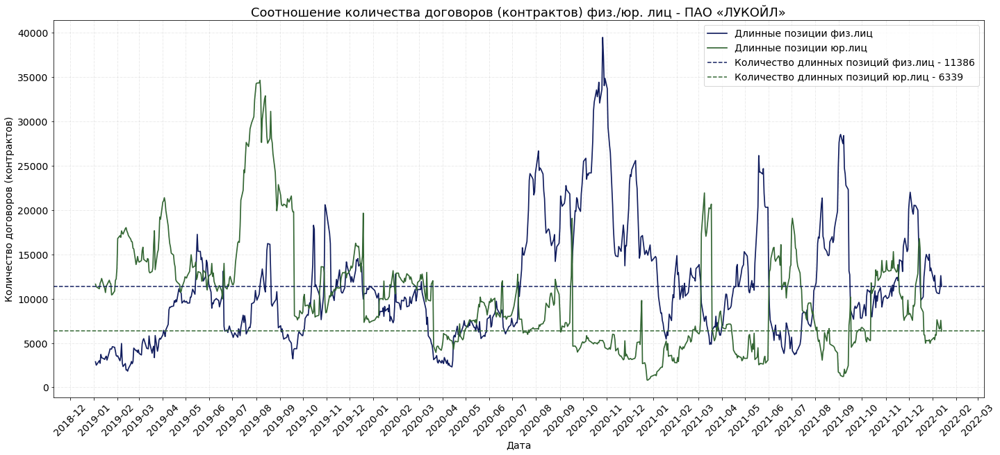

In [202]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(lkoh_df['moment'], lkoh_df['long_position_lkoh_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(lkoh_df['moment'], lkoh_df['long_position_lkoh_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=lkoh_df['long_position_lkoh_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(lkoh_df['long_position_lkoh_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=lkoh_df['long_position_lkoh_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(lkoh_df['long_position_lkoh_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «ЛУКОЙЛ»', fontsize=18)
plt.legend()
plt.show()

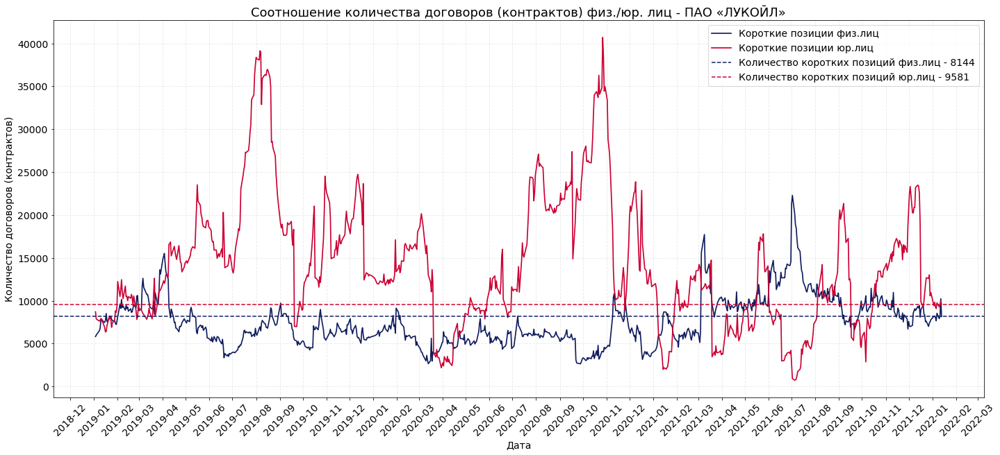

In [203]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(lkoh_df['moment'], lkoh_df['short_position_lkoh_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(lkoh_df['moment'], lkoh_df['short_position_lkoh_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=lkoh_df['short_position_lkoh_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(lkoh_df['short_position_lkoh_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=lkoh_df['short_position_lkoh_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(lkoh_df['short_position_lkoh_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «ЛУКОЙЛ»', fontsize=18)
plt.legend()
plt.show()

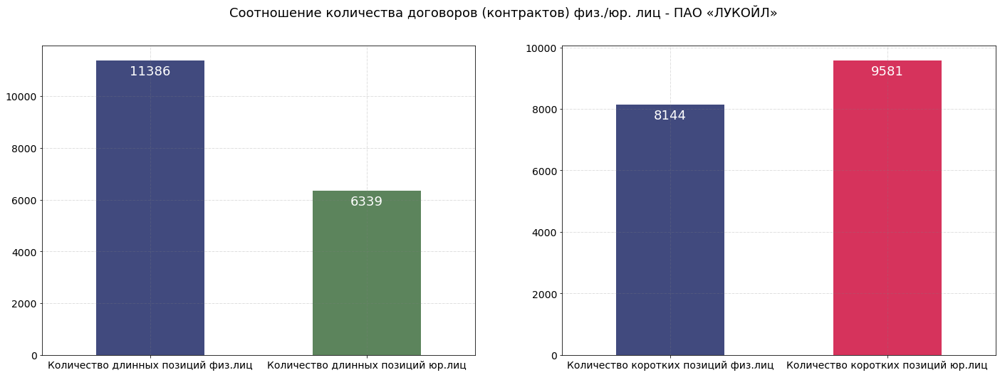

In [204]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_lkoh['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_lkoh['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «ЛУКОЙЛ»', fontsize=18)
plt.show()

## <a id='407'>Публичное акционерное общество "Нефтяная компания "Роснефть", акция обыкновенная (ROSN)</a>  
- <a href='#0'>Table of contents</a>  

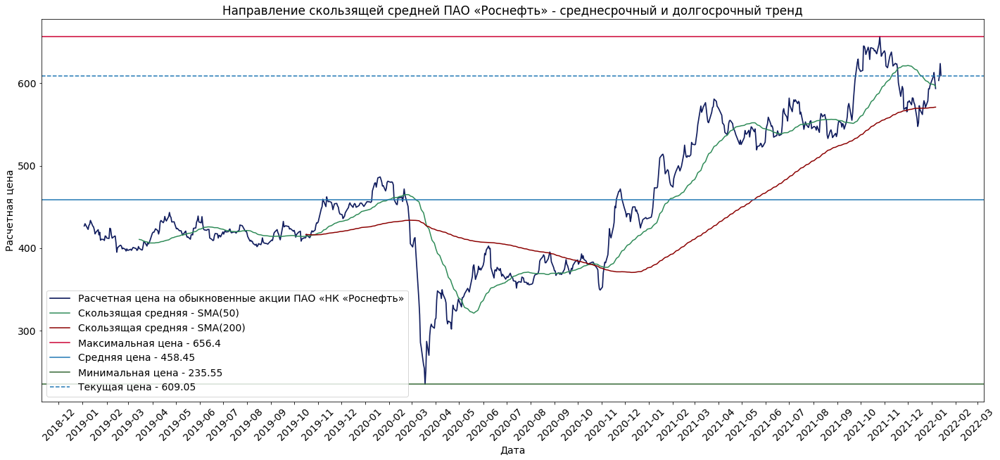

In [205]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(rosn_df['moment'], rosn_df['rosn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «Роснефть»', linewidth=1.7)
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(rosn_df['rosn_price']), label='Максимальная цена - '+str(np.nanmax(rosn_df['rosn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(rosn_df['rosn_price']), label='Средняя цена - '+str(round(np.mean(rosn_df['rosn_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(rosn_df['rosn_price']), label='Минимальная цена - '+str(np.nanmin(rosn_df['rosn_price'])), linestyle='-', color='#336633')
plt.axhline(y=rosn_df['rosn_price'].iat[-1], label='Текущая цена - '+str(rosn_df['rosn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Роснефть» - среднесрочный и долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/ROSN.png')

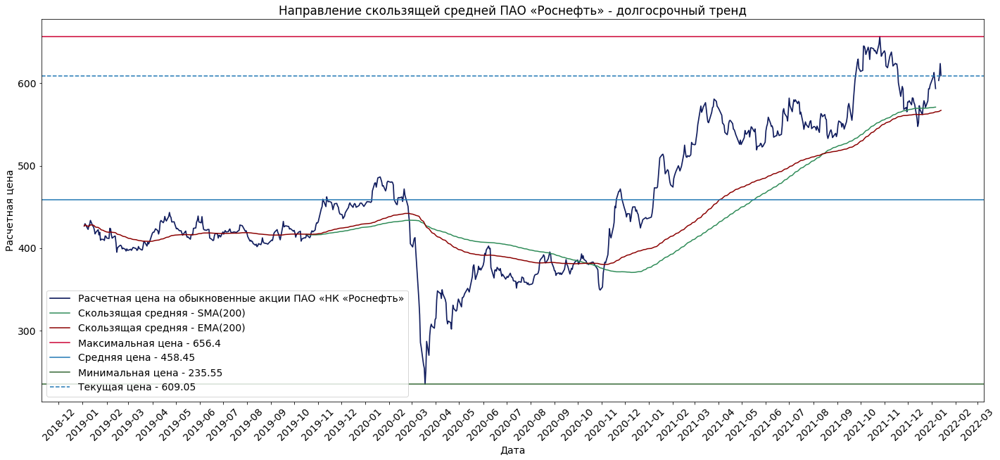

In [206]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(rosn_df['moment'], rosn_df['rosn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «Роснефть»', linewidth=1.7)
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(rosn_df['rosn_price']), label='Максимальная цена - '+str(np.nanmax(rosn_df['rosn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(rosn_df['rosn_price']), label='Средняя цена - '+str(round(np.mean(rosn_df['rosn_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(rosn_df['rosn_price']), label='Минимальная цена - '+str(np.nanmin(rosn_df['rosn_price'])), linestyle='-', color='#336633')
plt.axhline(y=rosn_df['rosn_price'].iat[-1], label='Текущая цена - '+str(rosn_df['rosn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Роснефть» - долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

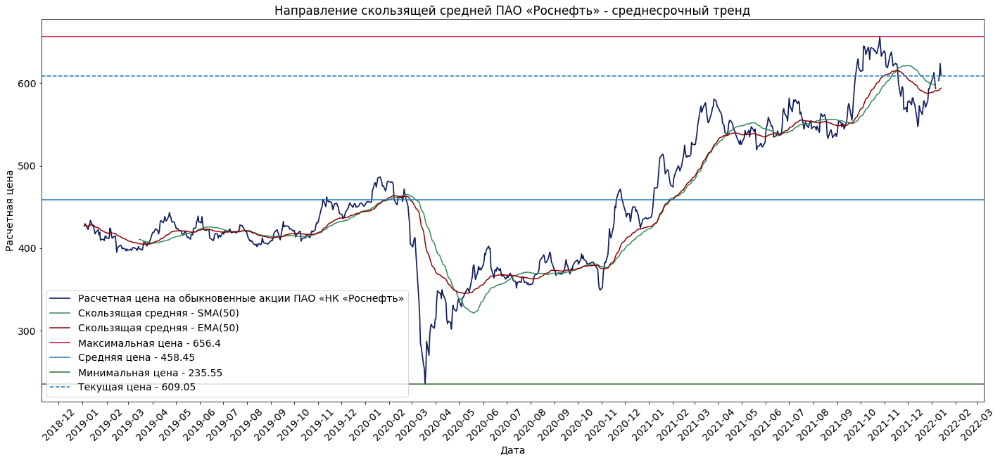

In [207]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(rosn_df['moment'], rosn_df['rosn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «Роснефть»', linewidth=1.7)
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(rosn_df['rosn_price']), label='Максимальная цена - '+str(np.nanmax(rosn_df['rosn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(rosn_df['rosn_price']), label='Средняя цена - '+str(round(np.mean(rosn_df['rosn_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(rosn_df['rosn_price']), label='Минимальная цена - '+str(np.nanmin(rosn_df['rosn_price'])), linestyle='-', color='#336633')
plt.axhline(y=rosn_df['rosn_price'].iat[-1], label='Текущая цена - '+str(rosn_df['rosn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Роснефть» - среднесрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

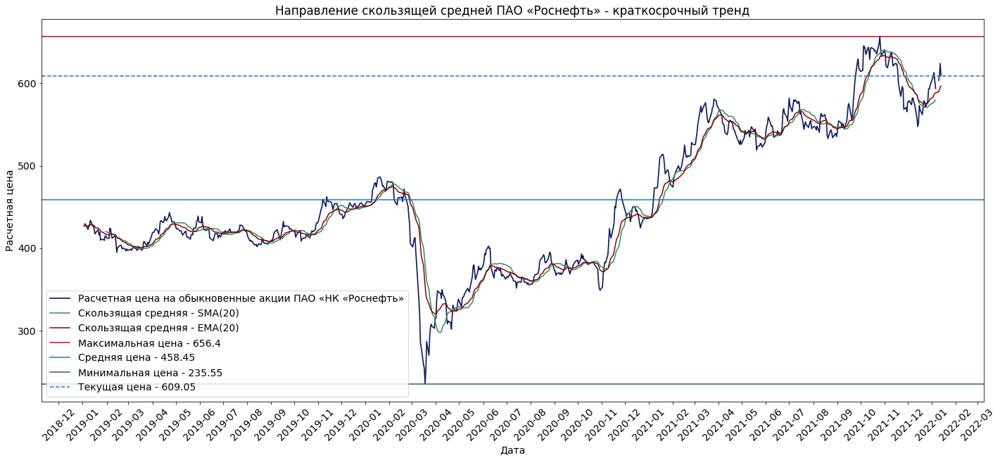

In [208]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(rosn_df['moment'], rosn_df['rosn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «Роснефть»', linewidth=1.7)
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(rosn_df['rosn_price']), label='Максимальная цена - '+str(np.nanmax(rosn_df['rosn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(rosn_df['rosn_price']), label='Средняя цена - '+str(round(np.mean(rosn_df['rosn_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(rosn_df['rosn_price']), label='Минимальная цена - '+str(np.nanmin(rosn_df['rosn_price'])), linestyle='-', color='#336633')
plt.axhline(y=rosn_df['rosn_price'].iat[-1], label='Текущая цена - '+str(rosn_df['rosn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Роснефть» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

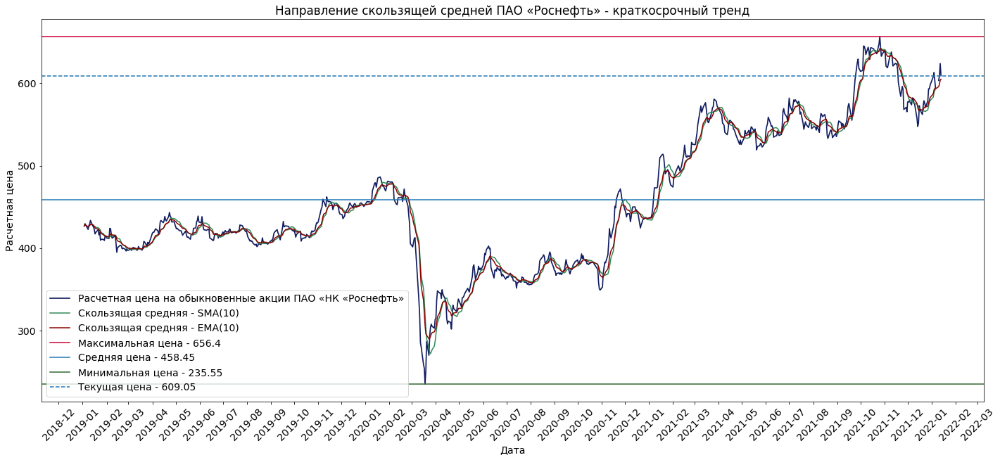

In [209]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(rosn_df['moment'], rosn_df['rosn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «НК «Роснефть»', linewidth=1.7)
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].rolling(window=10).mean(), color='#2E8B57', label='Скользящая средняя - SMA(10)', linestyle='-')
plt.plot(rosn_df['moment'], rosn_df['rosn_price'].ewm(span=10).mean(), color='#8B0000', label='Скользящая средняя - EMA(10)', linestyle='-')
plt.axhline(y=np.nanmax(rosn_df['rosn_price']), label='Максимальная цена - '+str(np.nanmax(rosn_df['rosn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(rosn_df['rosn_price']), label='Средняя цена - '+str(round(np.mean(rosn_df['rosn_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(rosn_df['rosn_price']), label='Минимальная цена - '+str(np.nanmin(rosn_df['rosn_price'])), linestyle='-', color='#336633')
plt.axhline(y=rosn_df['rosn_price'].iat[-1], label='Текущая цена - '+str(rosn_df['rosn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Роснефть» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [210]:
long_position_rosn_ind = round(rosn_df['long_position_rosn_ind'].iat[-1])
long_position_rosn_ent = round(rosn_df['long_position_rosn_ent'].iat[-1])

long_position_rosn = pd.DataFrame({'Количество договоров (контрактов)': [long_position_rosn_ind, long_position_rosn_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [211]:
short_position_rosn_ind = round(rosn_df['short_position_rosn_ind'].iat[-1])
short_position_rosn_ent = round(rosn_df['short_position_rosn_ent'].iat[-1])

short_position_rosn = pd.DataFrame({'Количество договоров (контрактов)': [short_position_rosn_ind, short_position_rosn_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

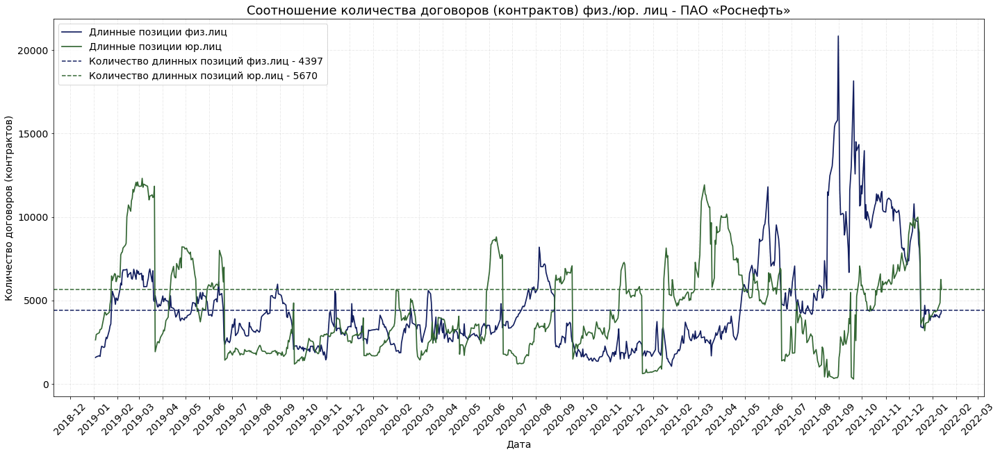

In [212]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(rosn_df['moment'], rosn_df['long_position_rosn_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(rosn_df['moment'], rosn_df['long_position_rosn_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=rosn_df['long_position_rosn_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(rosn_df['long_position_rosn_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=rosn_df['long_position_rosn_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(rosn_df['long_position_rosn_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45) 
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Роснефть»', fontsize=18)
plt.legend()
plt.show()

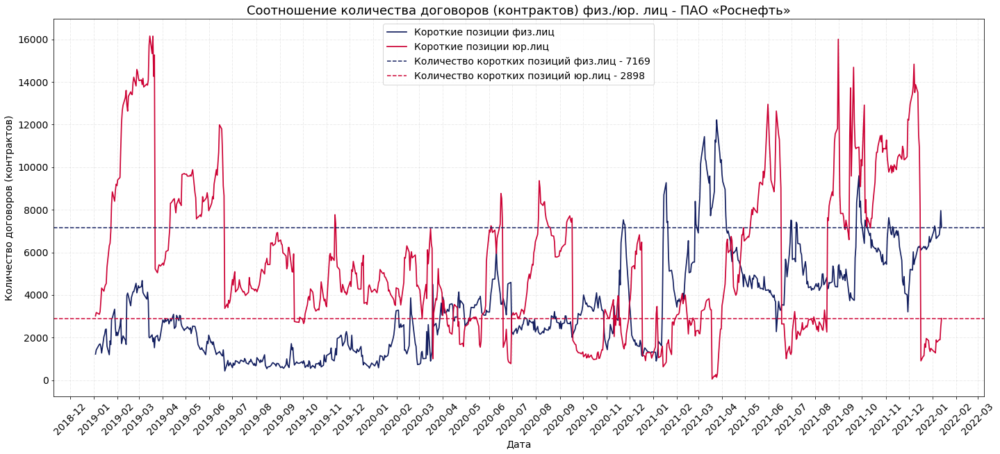

In [213]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(rosn_df['moment'], rosn_df['short_position_rosn_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(rosn_df['moment'], rosn_df['short_position_rosn_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=rosn_df['short_position_rosn_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(rosn_df['short_position_rosn_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=rosn_df['short_position_rosn_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(rosn_df['short_position_rosn_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45) 
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Роснефть»', fontsize=18)
plt.legend()
plt.show()

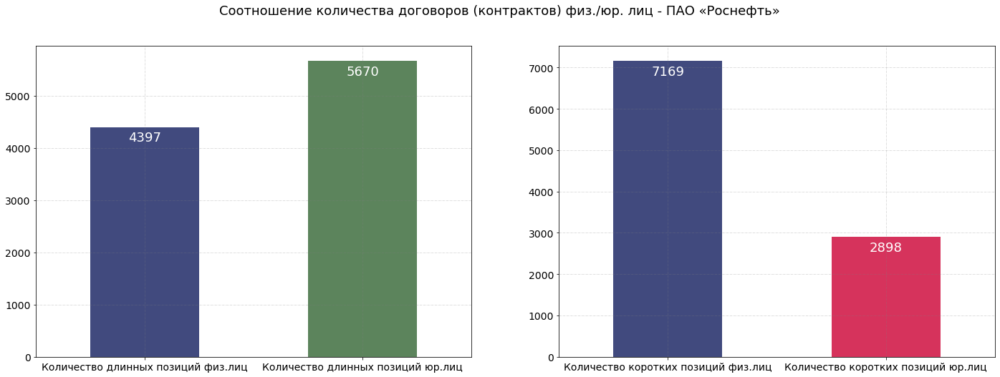

In [214]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_rosn['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_rosn['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Роснефть»', fontsize=18)
plt.show()

## <a id='408'>Публичное акционерное общество "Магнит", акция обыкновенная (MGNT)</a>  
- <a href='#0'>Table of contents</a>  

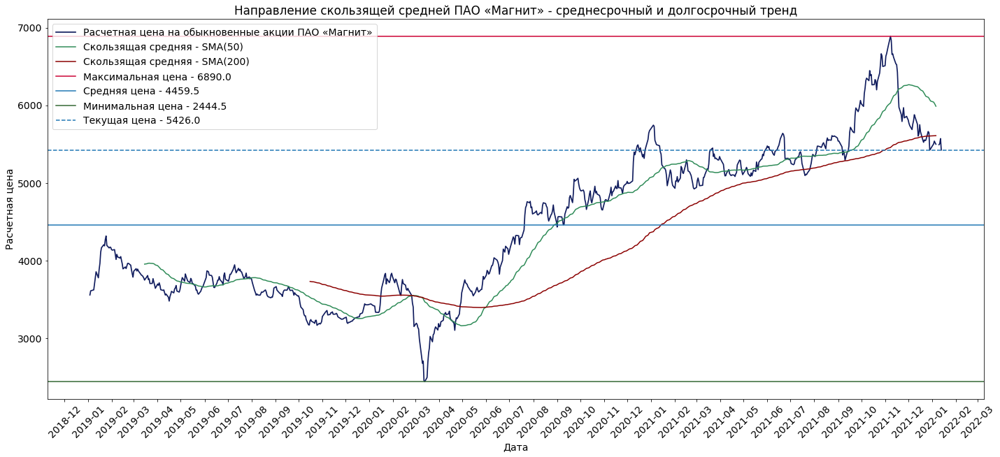

In [215]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Магнит»', linewidth=1.7)
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(mgnt_df['mgnt_price']), label='Максимальная цена - '+str(np.nanmax(mgnt_df['mgnt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(mgnt_df['mgnt_price']), label='Средняя цена - '+str(round(np.mean(mgnt_df['mgnt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(mgnt_df['mgnt_price']), label='Минимальная цена - '+str(np.nanmin(mgnt_df['mgnt_price'])), linestyle='-', color='#336633')
plt.axhline(y=mgnt_df['mgnt_price'].iat[-1], label='Текущая цена - '+str(mgnt_df['mgnt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Магнит» - среднесрочный и долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/MGNT.png')

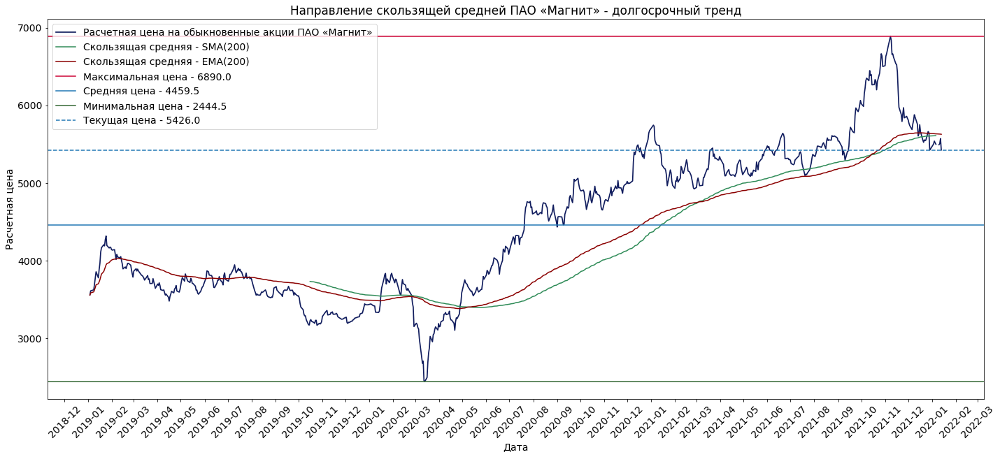

In [216]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Магнит»', linewidth=1.7)
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(mgnt_df['mgnt_price']), label='Максимальная цена - '+str(np.nanmax(mgnt_df['mgnt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(mgnt_df['mgnt_price']), label='Средняя цена - '+str(round(np.mean(mgnt_df['mgnt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(mgnt_df['mgnt_price']), label='Минимальная цена - '+str(np.nanmin(mgnt_df['mgnt_price'])), linestyle='-', color='#336633')
plt.axhline(y=mgnt_df['mgnt_price'].iat[-1], label='Текущая цена - '+str(mgnt_df['mgnt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Магнит» - долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

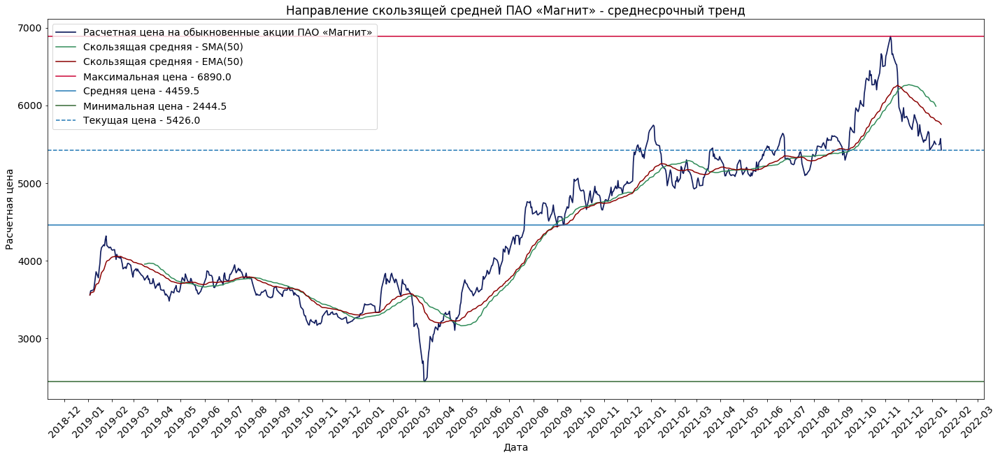

In [217]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Магнит»', linewidth=1.7)
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(mgnt_df['mgnt_price']), label='Максимальная цена - '+str(np.nanmax(mgnt_df['mgnt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(mgnt_df['mgnt_price']), label='Средняя цена - '+str(round(np.mean(mgnt_df['mgnt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(mgnt_df['mgnt_price']), label='Минимальная цена - '+str(np.nanmin(mgnt_df['mgnt_price'])), linestyle='-', color='#336633')
plt.axhline(y=mgnt_df['mgnt_price'].iat[-1], label='Текущая цена - '+str(mgnt_df['mgnt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Магнит» - среднесрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

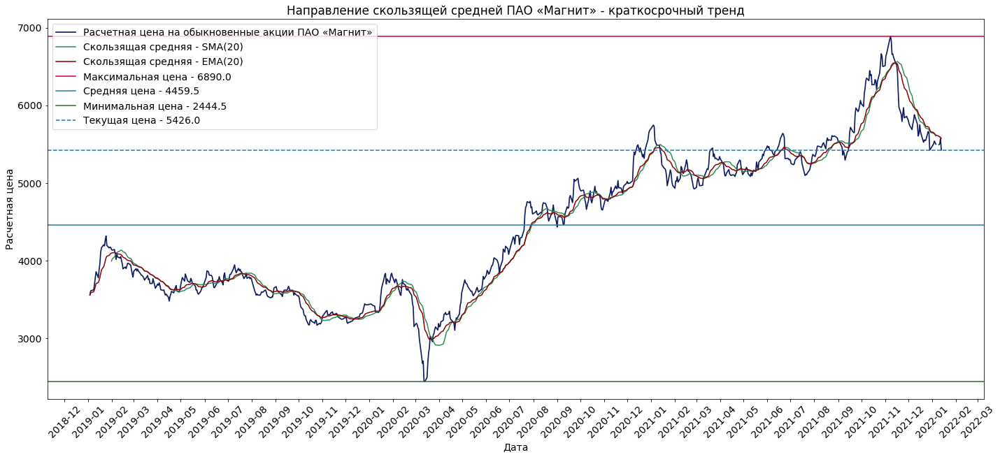

In [218]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Магнит»', linewidth=1.7)
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(mgnt_df['moment'], mgnt_df['mgnt_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(mgnt_df['mgnt_price']), label='Максимальная цена - '+str(np.nanmax(mgnt_df['mgnt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(mgnt_df['mgnt_price']), label='Средняя цена - '+str(round(np.mean(mgnt_df['mgnt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(mgnt_df['mgnt_price']), label='Минимальная цена - '+str(np.nanmin(mgnt_df['mgnt_price'])), linestyle='-', color='#336633')
plt.axhline(y=mgnt_df['mgnt_price'].iat[-1], label='Текущая цена - '+str(mgnt_df['mgnt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Магнит» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [219]:
long_position_mgnt_ind = round(mgnt_df['long_position_mgnt_ind'].iat[-1])
long_position_mgnt_ent = round(mgnt_df['long_position_mgnt_ent'].iat[-1])

long_position_mgnt = pd.DataFrame({'Количество договоров (контрактов)': [long_position_mgnt_ind, long_position_mgnt_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [220]:
short_position_mgnt_ind = round(mgnt_df['short_position_mgnt_ind'].iat[-1])
short_position_mgnt_ent = round(mgnt_df['short_position_mgnt_ent'].iat[-1])

short_position_mgnt = pd.DataFrame({'Количество договоров (контрактов)': [short_position_mgnt_ind, short_position_mgnt_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

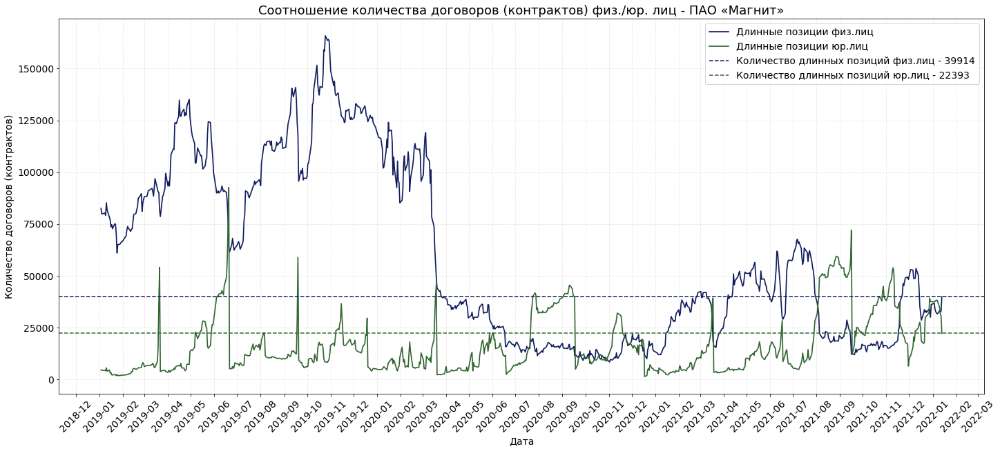

In [221]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], mgnt_df['long_position_mgnt_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(vtbr_df['moment'], mgnt_df['long_position_mgnt_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=mgnt_df['long_position_mgnt_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(mgnt_df['long_position_mgnt_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=mgnt_df['long_position_mgnt_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(mgnt_df['long_position_mgnt_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Магнит»', fontsize=18)
plt.legend()
plt.show()

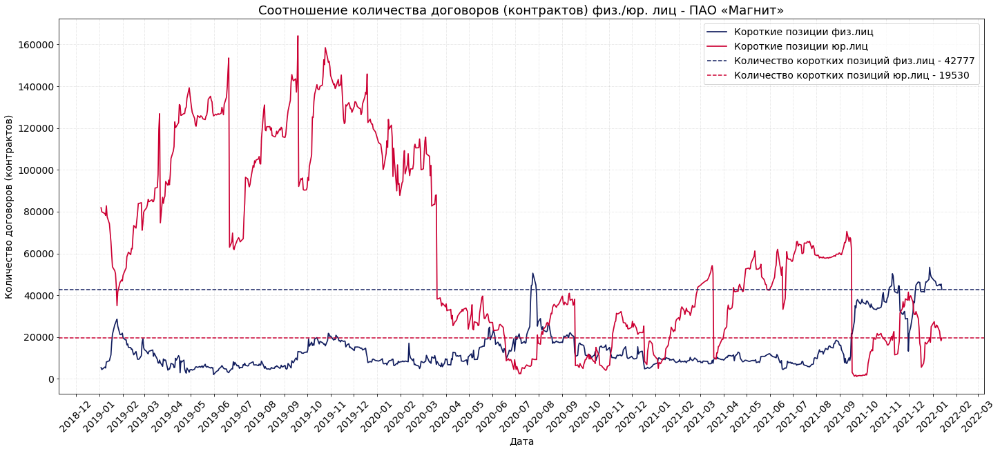

In [222]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(vtbr_df['moment'], mgnt_df['short_position_mgnt_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(vtbr_df['moment'], mgnt_df['short_position_mgnt_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=mgnt_df['short_position_mgnt_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(mgnt_df['short_position_mgnt_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=mgnt_df['short_position_mgnt_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(mgnt_df['short_position_mgnt_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Магнит»', fontsize=18)
plt.legend()
plt.show()

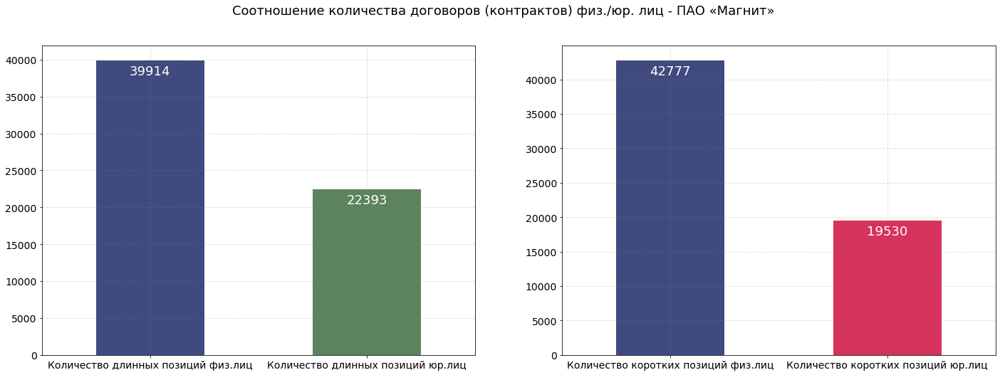

In [223]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_mgnt['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_mgnt['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Магнит»', fontsize=18)
plt.show()

## <a id='409'>Публичное акционерное общество "Аэрофлот – российские авиалинии", акция обыкновенная (AFLT)</a>  
- <a href='#0'>Table of contents</a>  

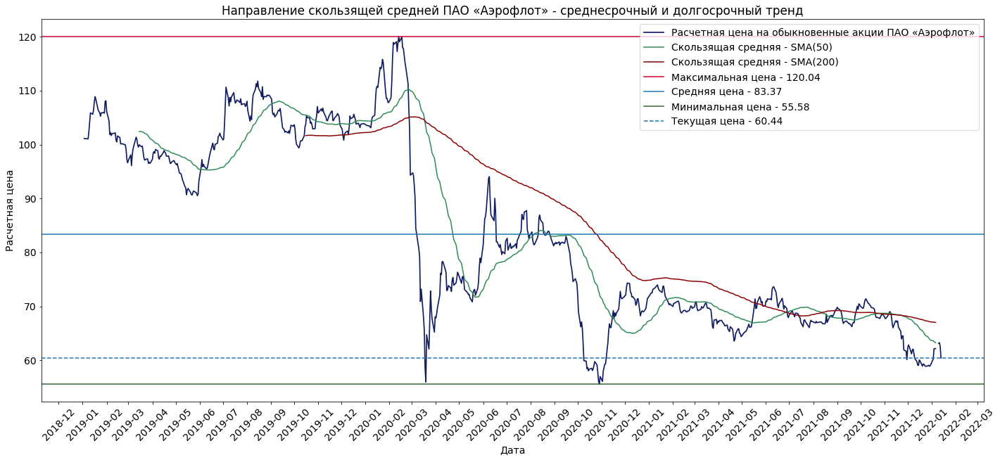

In [224]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(aflt_df['moment'], aflt_df['aflt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Аэрофлот»', linewidth=1.7)
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(aflt_df['aflt_price']), label='Максимальная цена - '+str(np.nanmax(aflt_df['aflt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(aflt_df['aflt_price']), label='Средняя цена - '+str(round(np.mean(aflt_df['aflt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(aflt_df['aflt_price']), label='Минимальная цена - '+str(np.nanmin(aflt_df['aflt_price'])), linestyle='-', color='#336633')
plt.axhline(y=aflt_df['aflt_price'].iat[-1], label='Текущая цена - '+str(aflt_df['aflt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Аэрофлот» - среднесрочный и долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/AFLT.png')

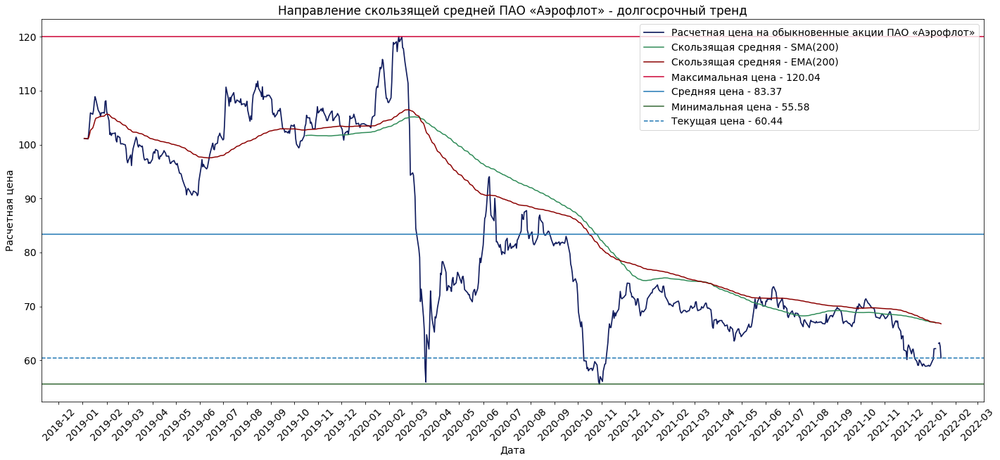

In [225]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(aflt_df['moment'], aflt_df['aflt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Аэрофлот»', linewidth=1.7)
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(aflt_df['aflt_price']), label='Максимальная цена - '+str(np.nanmax(aflt_df['aflt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(aflt_df['aflt_price']), label='Средняя цена - '+str(round(np.mean(aflt_df['aflt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(aflt_df['aflt_price']), label='Минимальная цена - '+str(np.nanmin(aflt_df['aflt_price'])), linestyle='-', color='#336633')
plt.axhline(y=aflt_df['aflt_price'].iat[-1], label='Текущая цена - '+str(aflt_df['aflt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Аэрофлот» - долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

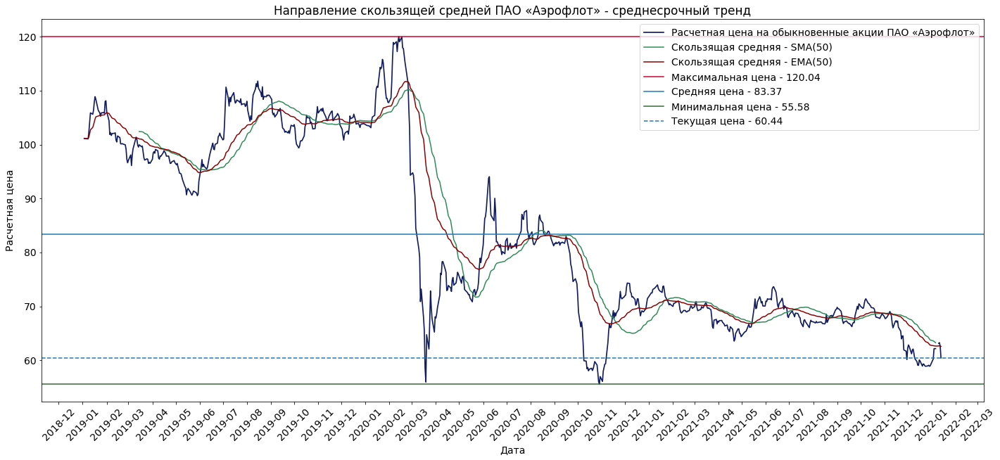

In [226]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(aflt_df['moment'], aflt_df['aflt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Аэрофлот»', linewidth=1.7)
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(aflt_df['aflt_price']), label='Максимальная цена - '+str(np.nanmax(aflt_df['aflt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(aflt_df['aflt_price']), label='Средняя цена - '+str(round(np.mean(aflt_df['aflt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(aflt_df['aflt_price']), label='Минимальная цена - '+str(np.nanmin(aflt_df['aflt_price'])), linestyle='-', color='#336633')
plt.axhline(y=aflt_df['aflt_price'].iat[-1], label='Текущая цена - '+str(aflt_df['aflt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Аэрофлот» - среднесрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

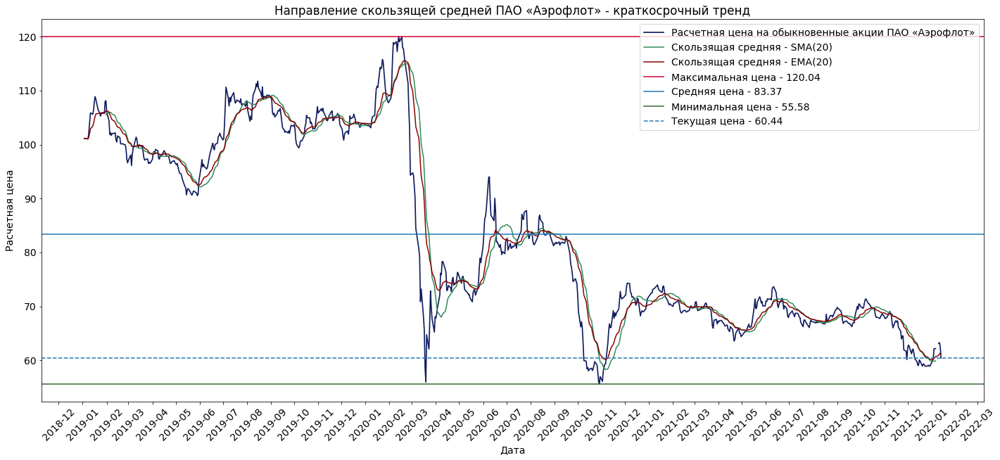

In [227]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(aflt_df['moment'], aflt_df['aflt_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «Аэрофлот»', linewidth=1.7)
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(aflt_df['moment'], aflt_df['aflt_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(aflt_df['aflt_price']), label='Максимальная цена - '+str(np.nanmax(aflt_df['aflt_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(aflt_df['aflt_price']), label='Средняя цена - '+str(round(np.mean(aflt_df['aflt_price']), 2)), linestyle='-')
plt.axhline(y=np.nanmin(aflt_df['aflt_price']), label='Минимальная цена - '+str(np.nanmin(aflt_df['aflt_price'])), linestyle='-', color='#336633')
plt.axhline(y=aflt_df['aflt_price'].iat[-1], label='Текущая цена - '+str(aflt_df['aflt_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Аэрофлот» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [228]:
long_position_aflt_ind = round(aflt_df['long_position_aflt_ind'].iat[-1])
long_position_aflt_ent = round(aflt_df['long_position_aflt_ent'].iat[-1])

long_position_aflt = pd.DataFrame({'Количество договоров (контрактов)': [long_position_aflt_ind, long_position_aflt_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [229]:
short_position_aflt_ind = round(aflt_df['short_position_aflt_ind'].iat[-1])
short_position_aflt_ent = round(aflt_df['short_position_aflt_ent'].iat[-1])

short_position_aflt = pd.DataFrame({'Количество договоров (контрактов)': [short_position_aflt_ind, short_position_aflt_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

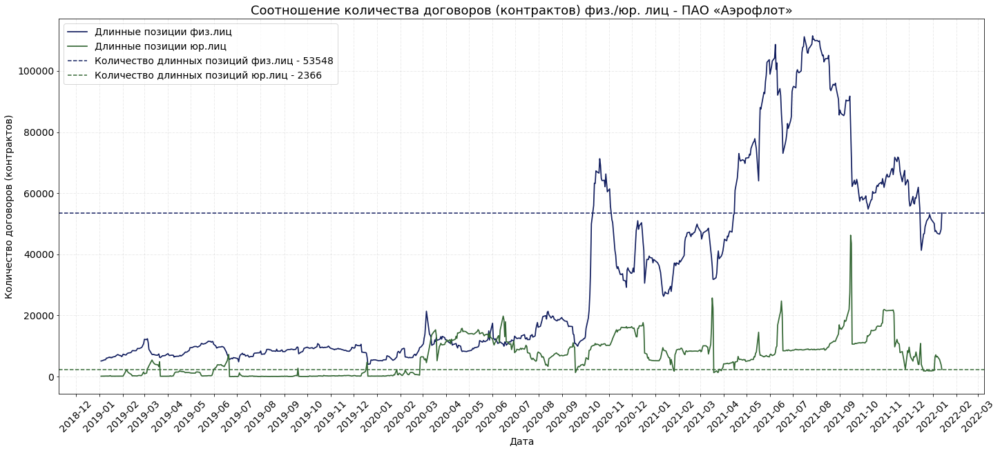

In [230]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(aflt_df['moment'], aflt_df['long_position_aflt_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(aflt_df['moment'], aflt_df['long_position_aflt_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=aflt_df['long_position_aflt_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(aflt_df['long_position_aflt_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=aflt_df['long_position_aflt_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(aflt_df['long_position_aflt_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Аэрофлот»', fontsize=18)
plt.legend()
plt.show()

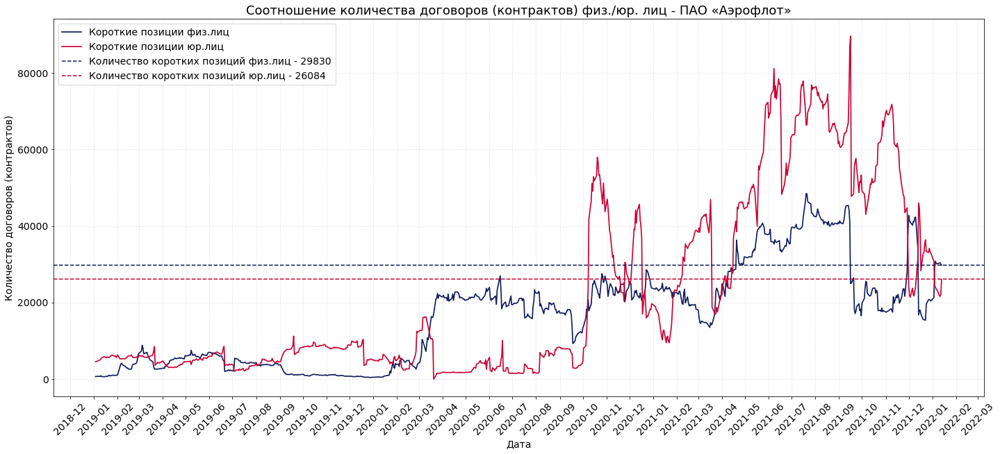

In [231]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(aflt_df['moment'], aflt_df['short_position_aflt_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(aflt_df['moment'], aflt_df['short_position_aflt_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=aflt_df['short_position_aflt_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(aflt_df['short_position_aflt_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=aflt_df['short_position_aflt_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(aflt_df['short_position_aflt_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Аэрофлот»', fontsize=18)
plt.legend()
plt.show()

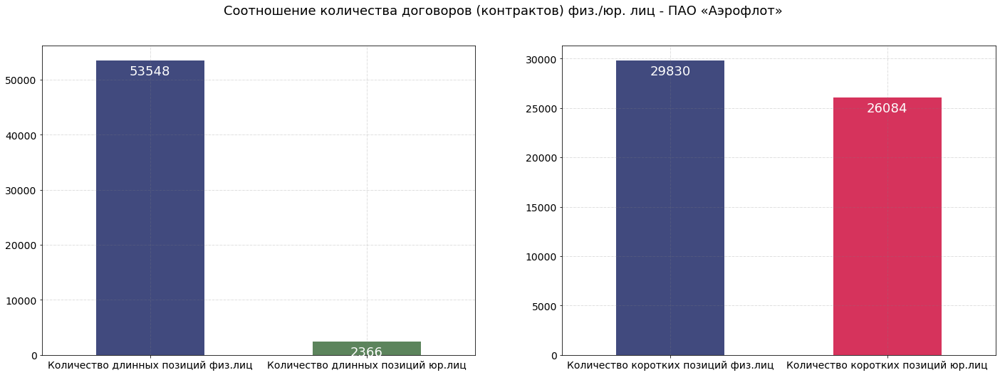

In [232]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_aflt['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_aflt['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «Аэрофлот»', fontsize=18)
plt.show()

## <a id='410'>Публичное акционерное общество "Горно-металлургическая компания "Норильский никель", акция обыкновенная (GMKN)</a>  
- <a href='#0'>Table of contents</a>  

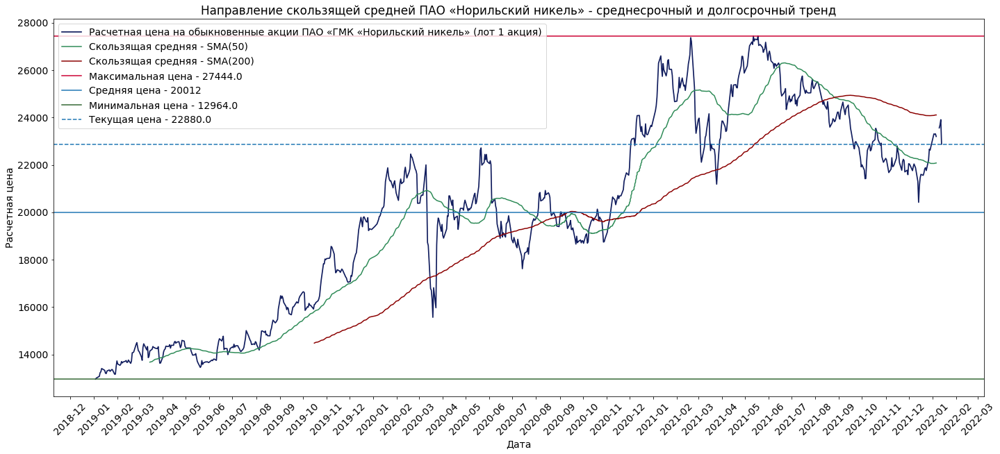

In [233]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «ГМК «Норильский никель» (лот 1 акция)', linewidth=1.7)
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].rolling(window=200).mean(), color='#8B0000', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(gmkn_df['gmkn_price']), label='Максимальная цена - '+str(np.nanmax(gmkn_df['gmkn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gmkn_df['gmkn_price']), label='Средняя цена - '+str(round(np.mean(gmkn_df['gmkn_price']))), linestyle='-')
plt.axhline(y=np.nanmin(gmkn_df['gmkn_price']), label='Минимальная цена - '+str(np.nanmin(gmkn_df['gmkn_price'])), linestyle='-', color='#336633')
plt.axhline(y=gmkn_df['gmkn_price'].iat[-1], label='Текущая цена - '+str(gmkn_df['gmkn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Норильский никель» - среднесрочный и долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

fig.savefig('./graphs/GMKN.png')

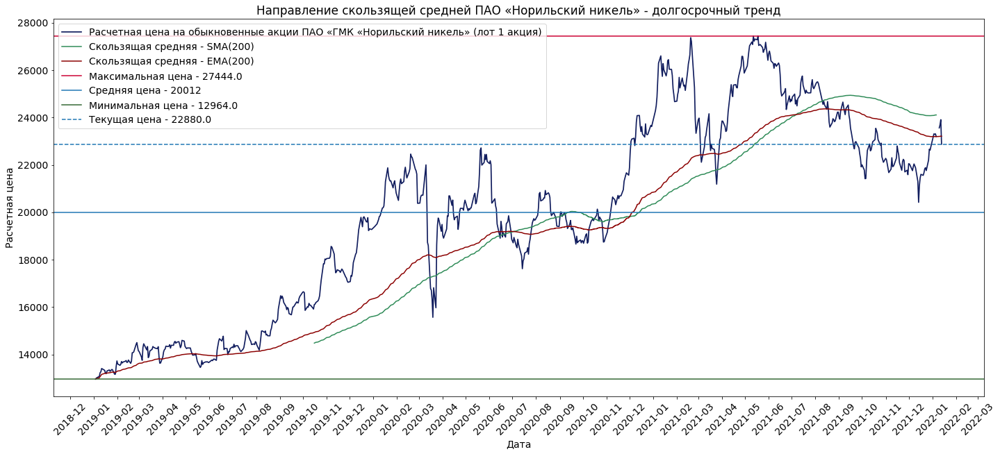

In [234]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «ГМК «Норильский никель» (лот 1 акция)', linewidth=1.7)
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].rolling(window=200).mean(), color='#2E8B57', label='Скользящая средняя - SMA(200)', linestyle='-')
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].ewm(span=200).mean(), color='#8B0000', label='Скользящая средняя - EMA(200)', linestyle='-')
plt.axhline(y=np.nanmax(gmkn_df['gmkn_price']), label='Максимальная цена - '+str(np.nanmax(gmkn_df['gmkn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gmkn_df['gmkn_price']), label='Средняя цена - '+str(round(np.mean(gmkn_df['gmkn_price']))), linestyle='-')
plt.axhline(y=np.nanmin(gmkn_df['gmkn_price']), label='Минимальная цена - '+str(np.nanmin(gmkn_df['gmkn_price'])), linestyle='-', color='#336633')
plt.axhline(y=gmkn_df['gmkn_price'].iat[-1], label='Текущая цена - '+str(gmkn_df['gmkn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Норильский никель» - долгосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

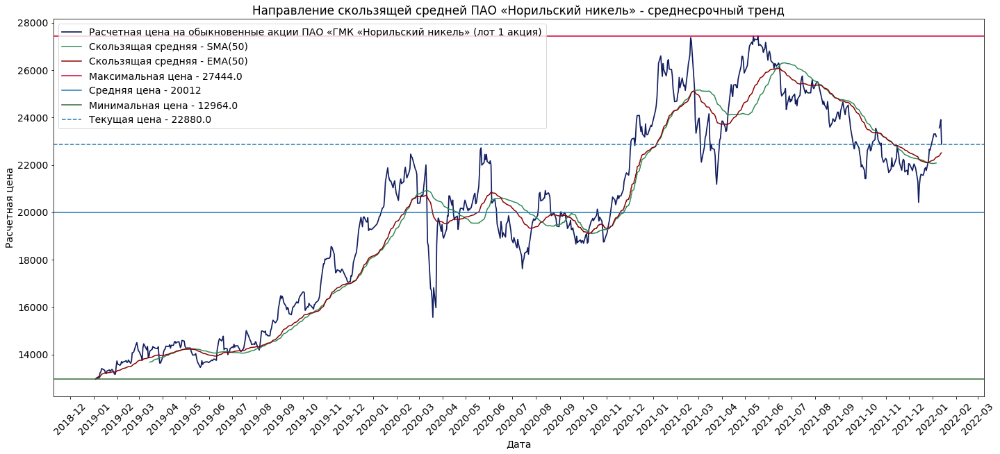

In [235]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «ГМК «Норильский никель» (лот 1 акция)', linewidth=1.7)
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].rolling(window=50).mean(), color='#2E8B57', label='Скользящая средняя - SMA(50)', linestyle='-')
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].ewm(span=50).mean(), color='#8B0000', label='Скользящая средняя - EMA(50)', linestyle='-')
plt.axhline(y=np.nanmax(gmkn_df['gmkn_price']), label='Максимальная цена - '+str(np.nanmax(gmkn_df['gmkn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gmkn_df['gmkn_price']), label='Средняя цена - '+str(round(np.mean(gmkn_df['gmkn_price']))), linestyle='-')
plt.axhline(y=np.nanmin(gmkn_df['gmkn_price']), label='Минимальная цена - '+str(np.nanmin(gmkn_df['gmkn_price'])), linestyle='-', color='#336633')
plt.axhline(y=gmkn_df['gmkn_price'].iat[-1], label='Текущая цена - '+str(gmkn_df['gmkn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Норильский никель» - среднесрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

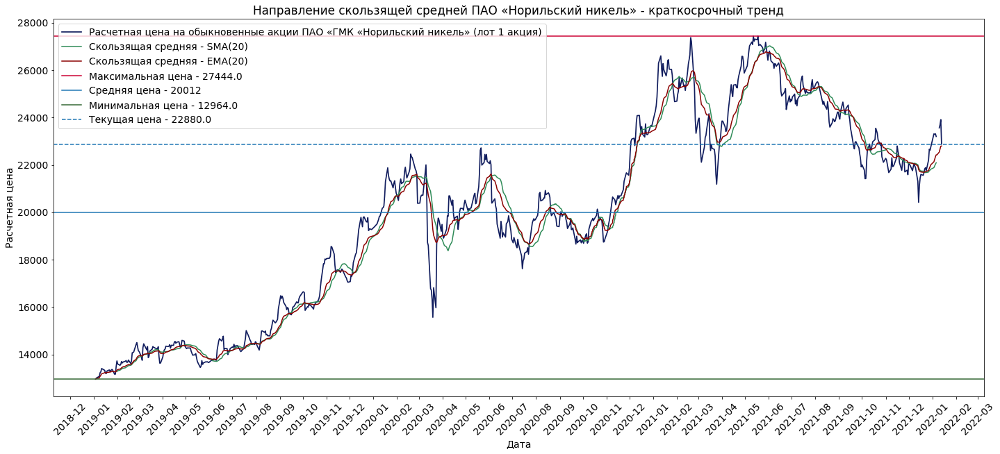

In [236]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'], color='#111d5e', label='Расчетная цена на обыкновенные акции ПАО «ГМК «Норильский никель» (лот 1 акция)', linewidth=1.7)
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].rolling(window=20).mean(), color='#2E8B57', label='Скользящая средняя - SMA(20)', linestyle='-')
plt.plot(gmkn_df['moment'], gmkn_df['gmkn_price'].ewm(span=20).mean(), color='#8B0000', label='Скользящая средняя - EMA(20)', linestyle='-')
plt.axhline(y=np.nanmax(gmkn_df['gmkn_price']), label='Максимальная цена - '+str(np.nanmax(gmkn_df['gmkn_price'])), linestyle='-', color='#CC0033')
plt.axhline(y=np.mean(gmkn_df['gmkn_price']), label='Средняя цена - '+str(round(np.mean(gmkn_df['gmkn_price']))), linestyle='-')
plt.axhline(y=np.nanmin(gmkn_df['gmkn_price']), label='Минимальная цена - '+str(np.nanmin(gmkn_df['gmkn_price'])), linestyle='-', color='#336633')
plt.axhline(y=gmkn_df['gmkn_price'].iat[-1], label='Текущая цена - '+str(gmkn_df['gmkn_price'].iat[-1]), linestyle='--')
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Направление скользящей средней ПАО «Норильский никель» - краткосрочный тренд')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [237]:
long_position_gmkn_ind = round(gmkn_df['long_position_gmkn_ind'].iat[-1])
long_position_gmkn_ent = round(gmkn_df['long_position_gmkn_ent'].iat[-1])

long_position_gmkn = pd.DataFrame({'Количество договоров (контрактов)': [long_position_gmkn_ind, long_position_gmkn_ent]},
                                 index=['Количество длинных позиций физ.лиц', 'Количество длинных позиций юр.лиц'])

In [238]:
short_position_gmkn_ind = round(gmkn_df['short_position_gmkn_ind'].iat[-1])
short_position_gmkn_ent = round(gmkn_df['short_position_gmkn_ent'].iat[-1])

short_position_gmkn = pd.DataFrame({'Количество договоров (контрактов)': [short_position_gmkn_ind, short_position_gmkn_ent]},
                                 index=['Количество коротких позиций физ.лиц', 'Количество коротких позиций юр.лиц'])

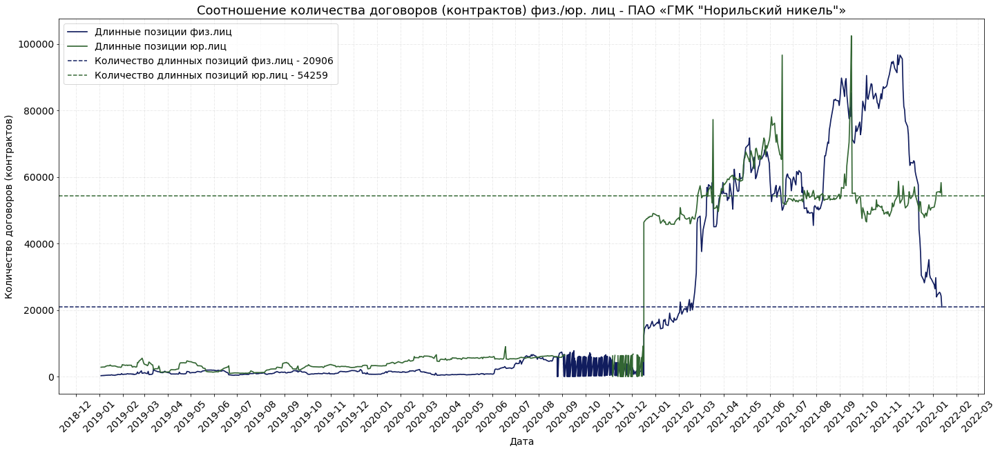

In [239]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gmkn_df['moment'], gmkn_df['long_position_gmkn_ind'], color='#111d5e', label='Длинные позиции физ.лиц', linewidth=1.7)
plt.plot(gmkn_df['moment'], gmkn_df['long_position_gmkn_ent'], color='#336633', label='Длинные позиции юр.лиц', linewidth=1.7)
plt.axhline(y=gmkn_df['long_position_gmkn_ind'].iat[-1], label='Количество длинных позиций физ.лиц - '+str(round(gmkn_df['long_position_gmkn_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=gmkn_df['long_position_gmkn_ent'].iat[-1], label='Количество длинных позиций юр.лиц - '+str(round(gmkn_df['long_position_gmkn_ent'].iat[-1])), linestyle='--', color='#336633')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «ГМК "Норильский никель"»', fontsize=18)
plt.legend()
plt.show()

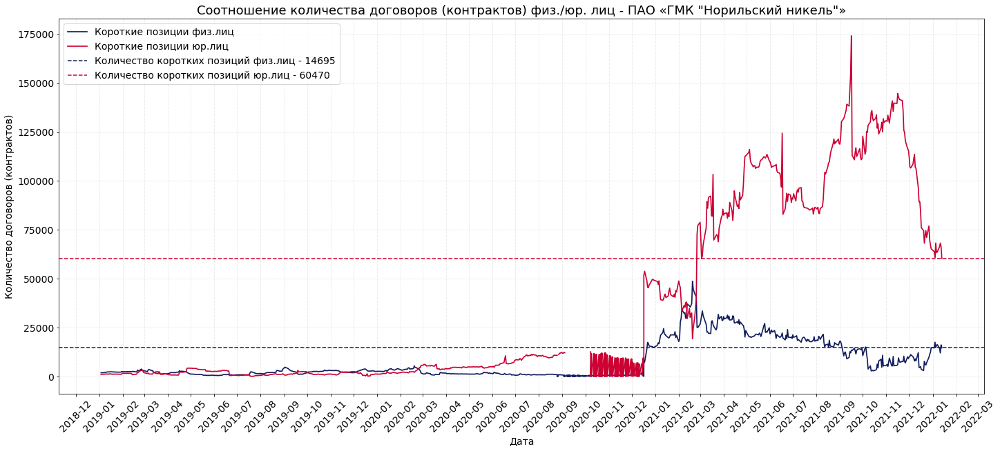

In [240]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gmkn_df['moment'], gmkn_df['short_position_gmkn_ind'], color='#111d5e', label='Короткие позиции физ.лиц', linewidth=1.7)
plt.plot(gmkn_df['moment'], gmkn_df['short_position_gmkn_ent'], color='#CC0033', label='Короткие позиции юр.лиц', linewidth=1.7)
plt.axhline(y=gmkn_df['short_position_gmkn_ind'].iat[-1], label='Количество коротких позиций физ.лиц - '+str(round(gmkn_df['short_position_gmkn_ind'].iat[-1])), linestyle='--', color='#111d5e')
plt.axhline(y=gmkn_df['short_position_gmkn_ent'].iat[-1], label='Количество коротких позиций юр.лиц - '+str(round(gmkn_df['short_position_gmkn_ent'].iat[-1])), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
plt.ylabel('Количество договоров (контрактов)')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «ГМК "Норильский никель"»', fontsize=18)
plt.legend()
plt.show()

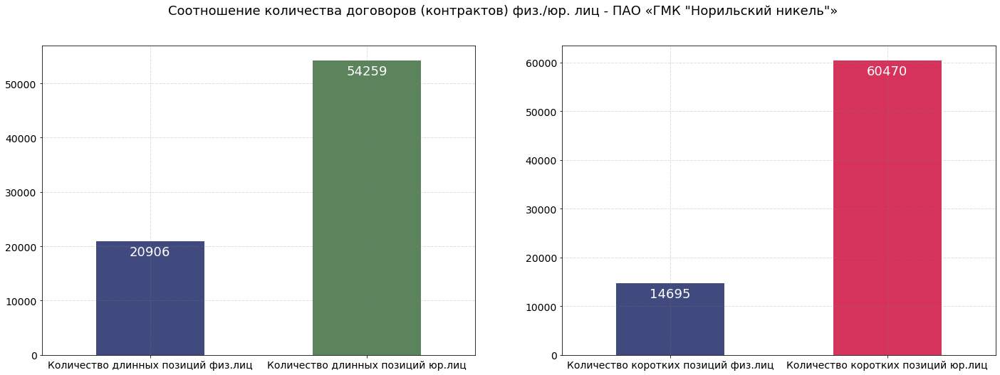

In [241]:
f, ax=plt.subplots(1, 2, figsize=(24, 8)) 
    
long_position_gmkn['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[0], color=['#111d5e', '#336633'], alpha=0.8)
ax[0].set_xlabel('')
ax[0].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[0].patches:
    ax[0].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points')   
    
short_position_gmkn['Количество договоров (контрактов)'].plot.bar(rot=0, ax=ax[1], color=['#111d5e', '#CC0033'], alpha=0.8)
ax[1].set_xlabel('')    
ax[1].grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.5)
for bar in ax[1].patches:
    ax[1].annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='center', xytext=(0, -15), color='white', fontsize=18, textcoords='offset points') 
      
plt.suptitle('Соотношение количества договоров (контрактов) физ./юр. лиц - ПАО «ГМК "Норильский никель"»', fontsize=18)
plt.show()

# <a id='5'>Создание датасета</a>  

In [242]:
# Курс доллара США на валютной бирже - USD000UTSTOM - si_df
# Курс евро-российский рубль на валютной бирже - EUR_RUB__TOM - eu_df      
# Публичное акционерное общество "Сбербанк России", акция обыкновенная (SBER) - sber_df    
# Банк ВТБ (публичное акционерное общество), акция обыкновенная (VTBR) - vtbr_df  
# Публичное акционерное общество "Газпром", акция обыкновенная (GAZP) - gazr_df    
# Публичное акционерное общество "Горно-металлургическая компания "Норильский никель", акция обыкновенная (GMKN) - gmkn_df     
# Публичное акционерное общество "Аэрофлот – российские авиалинии", акция обыкновенная (AFLT) - aflt_df    
# Публичное акционерное общество "Магнит", акция обыкновенная (MGNT) - mgnt_df    
# Публичное акционерное общество "Нефтяная компания "ЛУКОЙЛ", акция обыкновенная (LKOH) - lkoh_df   
# Публичное акционерное общество "Нефтяная компания "Роснефть", акция обыкновенная (ROSN) - rosn_df   
# Фьючерсный контракт на Индекс РТС - rts_df    
# Фьючерсный контракт на Индекс МосБиржи - mix_df     
# Фьючерсный контракт на инвестиционные паи SPDR S&P 500 ETF Trust - spyf_df   
# Фьючерсный контракт на нефть Brent  - brent_df  
# Фьючерсный контракт на золото - gold_df    
# Фьючерсный контракт на серебро - silv_df    
# Фьючерсный контракт на природный газ  - ng_df   

## <a id='502'>Объединение таблиц</a>  
- <a href='#0'>Table of contents</a> 

In [243]:
# Объединение таблиц на основе ключа - 'moment'
train_df = pd.merge(si_df, eu_df, on='moment', how='left')
train_df = pd.merge(train_df, sber_df, on='moment', how='left')
train_df = pd.merge(train_df, vtbr_df, on='moment', how='left')
train_df = pd.merge(train_df, gazr_df, on='moment', how='left')
train_df = pd.merge(train_df, gmkn_df, on='moment', how='left')
# train_df = pd.merge(train_df, aflt_df, on='moment', how='left')
# train_df = pd.merge(train_df, mgnt_df, on='moment', how='left')
train_df = pd.merge(train_df, lkoh_df, on='moment', how='left')
train_df = pd.merge(train_df, rosn_df, on='moment', how='left')

## <a id='503'>Пропуски в данных</a>  
- <a href='#0'>Table of contents</a> 

In [244]:
train_df.isnull().sum()

moment                        0
long_position_si_ind          0
short_position_si_ind         0
clients_in_long_si_ind        0
clients_in_short_si_ind       0
long_position_si_ent          0
short_position_si_ent         0
clients_in_long_si_ent        0
clients_in_short_si_ent       0
si_volrur                     0
si_price                      0
si_h                          0
si_l                          0
si_r                          0
long_position_eu_ind          0
short_position_eu_ind         0
clients_in_long_eu_ind        0
clients_in_short_eu_ind       0
long_position_eu_ent          0
short_position_eu_ent         0
clients_in_long_eu_ent        0
clients_in_short_eu_ent       0
eu_volrur                     0
eu_price                      0
eu_h                          0
eu_l                          0
eu_r                          0
long_position_sbrf_ind        0
short_position_sbrf_ind       0
clients_in_long_sbrf_ind      0
clients_in_short_sbrf_ind     0
long_pos

## <a id='504'>Корреляционная зависимость - Курс доллара США</a>  
- <a href='#0'>Table of contents</a> 

In [245]:
si_correlation = train_df.corr()
si_corr_with_target = si_correlation['si_price'].sort_values(ascending = False)
si_corr_with_target

si_price                     1.00000
eu_price                     0.95613
clients_in_short_si_ind      0.69823
short_position_eu_ind        0.62966
short_position_si_ind        0.60037
gmkn_price                   0.59957
clients_in_short_eu_ind      0.57775
si_volrur                    0.54845
clients_in_short_si_ent      0.52372
short_position_rosn_ind      0.52053
long_position_gmkn_ent       0.50262
clients_in_long_lkoh_ind     0.48085
long_position_lkoh_ind       0.47009
clients_in_long_gazr_ind     0.44050
long_position_eu_ent         0.41159
clients_in_long_sbrf_ind     0.39914
short_position_gmkn_ent      0.39741
sber_value                   0.39718
clients_in_short_vtbr_ind    0.39356
short_position_vtbr_ind      0.38152
clients_in_short_rosn_ind    0.38054
sber_volume                  0.36504
clients_in_short_vtbr_ent    0.35229
clients_in_long_vtbr_ind     0.35004
lkoh_volume                  0.34426
gmkn_volume                  0.33687
rosn_volume                  0.33183
l

## <a id='505'>Парная корреляция USD & EUR_RUB</a>  
- <a href='#0'>Table of contents</a> 

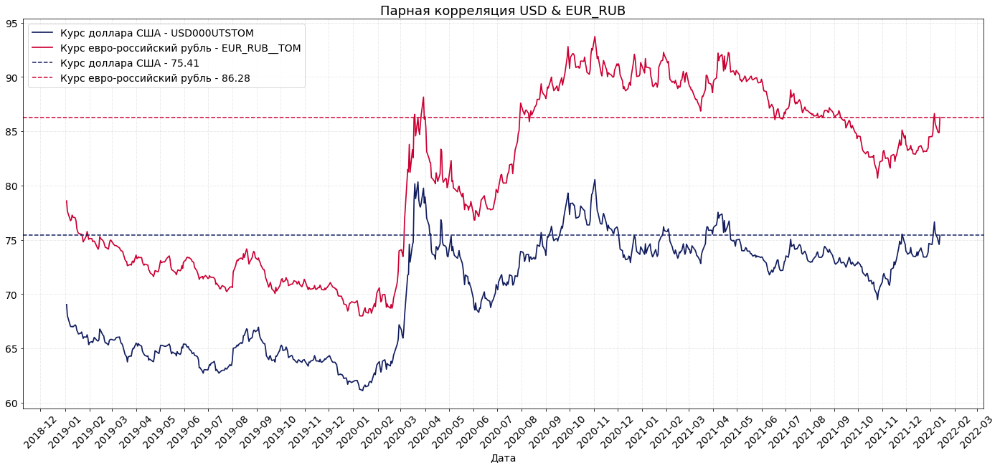

In [246]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(train_df['moment'], train_df['si_price'], color='#111d5e', label='Курс доллара США - USD000UTSTOM', linewidth=1.7)
plt.plot(train_df['moment'], train_df['eu_price'], color='#CC0033', label='Курс евро-российский рубль - EUR_RUB__TOM', linewidth=1.7)
plt.axhline(y=train_df['si_price'].iat[-1], label='Курс доллара США - '+str(round(train_df['si_price'].iat[-1], 2)), linestyle='--', color='#111d5e')
plt.axhline(y=train_df['eu_price'].iat[-1], label='Курс евро-российский рубль - '+str(round(train_df['eu_price'].iat[-1], 2)), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Парная корреляция USD & EUR_RUB', fontsize=18)
plt.legend()
plt.show()

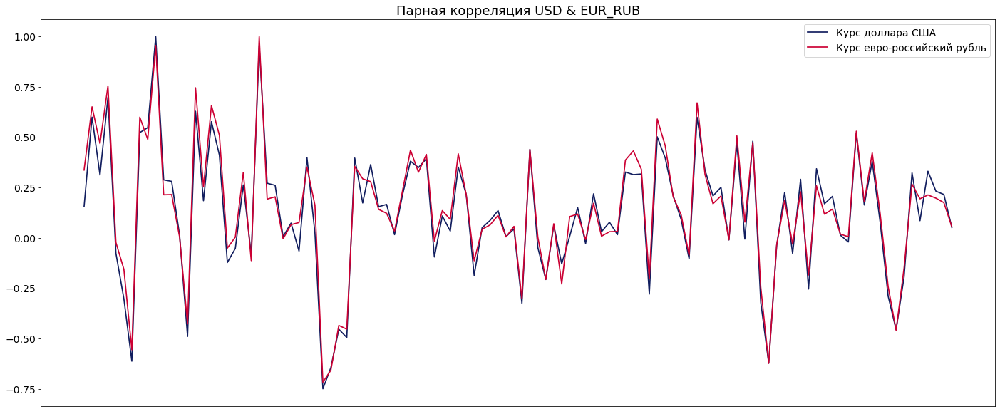

In [247]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(si_correlation['si_price'], color='#111d5e', label='Курс доллара США', linewidth=1.7)
plt.plot(si_correlation['eu_price'], color='#CC0033', label='Курс евро-российский рубль', linewidth=1.7)
plt.xticks([])
plt.title('Парная корреляция USD & EUR_RUB', fontsize=18)
plt.legend()
plt.show()

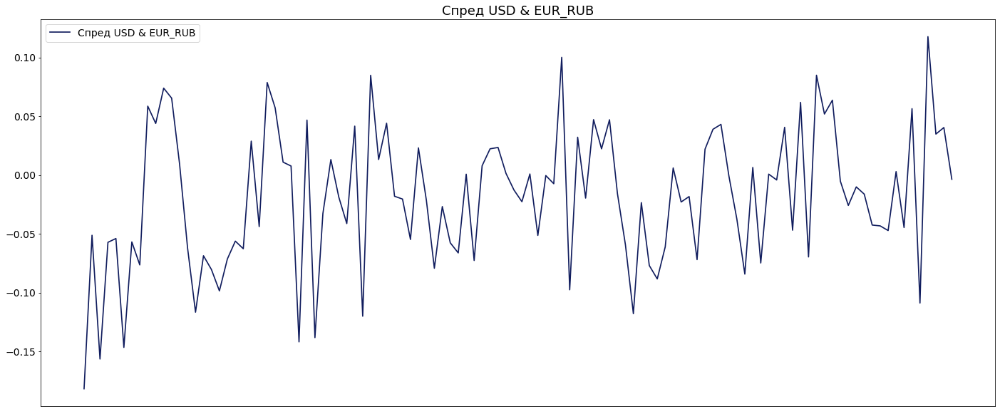

In [248]:
fig, ax = plt.subplots(figsize=(24, 10))
si_eu_spread = si_correlation['si_price'] - si_correlation['eu_price']
plt.plot(si_eu_spread, color='#111d5e', label='Спред USD & EUR_RUB', linewidth=1.7) # spread_sr.cumsum()
plt.xticks([])
plt.title('Спред USD & EUR_RUB', fontsize=18)
plt.legend()
plt.show()

In [249]:
si_eu_adf = adfuller(si_eu_spread)

In [250]:
print(f'ADF Test Statistic: {si_eu_adf[0]}')
print(f'P-Value: {si_eu_adf[1]}')
print(f'Number of lags used: {si_eu_adf[2]}')
print(f'Number of observations: {si_eu_adf[3]}')
print('Critical Values:')
for k, v in si_eu_adf[4].items():
    print(f'{k}: {v}')

ADF Test Statistic: -1.7393723810148036
P-Value: 0.4109492546925648
Number of lags used: 13
Number of observations: 96
Critical Values:
1%: -3.5003788874873405
5%: -2.8921519665075235
10%: -2.5830997960069446


In [251]:
si_eu_coint = coint(si_correlation['si_price'], si_correlation['eu_price'])

In [252]:
print(f'T-statistic of unit-root test on residuals {si_eu_coint[0]}')
print(f'P-Value: {si_eu_coint[1]}')
print(f'Critical Values: {si_eu_coint[2]}')

T-statistic of unit-root test on residuals -1.6124462024097126
P-Value: 0.7156080522659988
Critical Values: [-3.99973805 -3.39276024 -3.08358903]


## <a id='506'>Корреляционная зависимость - ПАО «Сбербанк»</a>  
- <a href='#0'>Table of contents</a> 

In [253]:
sber_correlation = train_df.corr()
sber_corr_with_target = si_correlation['sber_price'].sort_values(ascending = False)
sber_corr_with_target

sber_price                   1.00000
rosn_price                   0.93608
short_position_gmkn_ent      0.89312
long_position_gmkn_ind       0.89124
clients_in_long_gmkn_ind     0.85746
gazr_price                   0.84523
vtbr_price                   0.83570
long_position_gmkn_ent       0.83046
long_position_vtbr_ind       0.82638
lkoh_price                   0.80465
long_position_gazr_ind       0.79738
short_position_gazr_ent      0.78189
short_position_vtbr_ent      0.77190
clients_in_long_si_ind       0.76621
clients_in_long_gazr_ind     0.76027
clients_in_long_rosn_ind     0.72412
short_position_vtbr_ind      0.71031
clients_in_long_vtbr_ind     0.69958
clients_in_short_vtbr_ind    0.68831
long_position_eu_ent         0.68791
gmkn_price                   0.66269
clients_in_long_eu_ind       0.64804
short_position_eu_ind        0.61094
long_position_rosn_ind       0.60817
short_position_gmkn_ind      0.60347
short_position_si_ind        0.55770
short_position_rosn_ind      0.55172
s

## <a id='507'>Парная корреляция SBER & ROSN</a>  
- <a href='#0'>Table of contents</a> 

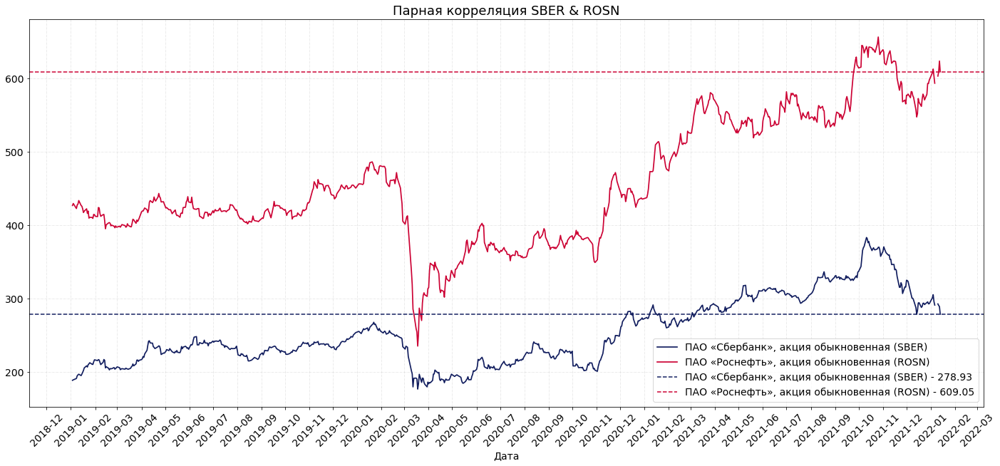

In [254]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(train_df['moment'], train_df['sber_price'], color='#111d5e', label='ПАО «Сбербанк», акция обыкновенная (SBER)', linewidth=1.7)
plt.plot(train_df['moment'], train_df['rosn_price'], color='#CC0033', label='ПАО «Роснефть», акция обыкновенная (ROSN)', linewidth=1.7)
plt.axhline(y=train_df['sber_price'].iat[-1], label='ПАО «Сбербанк», акция обыкновенная (SBER) - '+str(round(train_df['sber_price'].iat[-1], 2)), linestyle='--', color='#111d5e')
plt.axhline(y=train_df['rosn_price'].iat[-1], label='ПАО «Роснефть», акция обыкновенная (ROSN) - '+str(round(train_df['rosn_price'].iat[-1], 2)), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Парная корреляция SBER & ROSN', fontsize=18)
plt.legend()
plt.show()

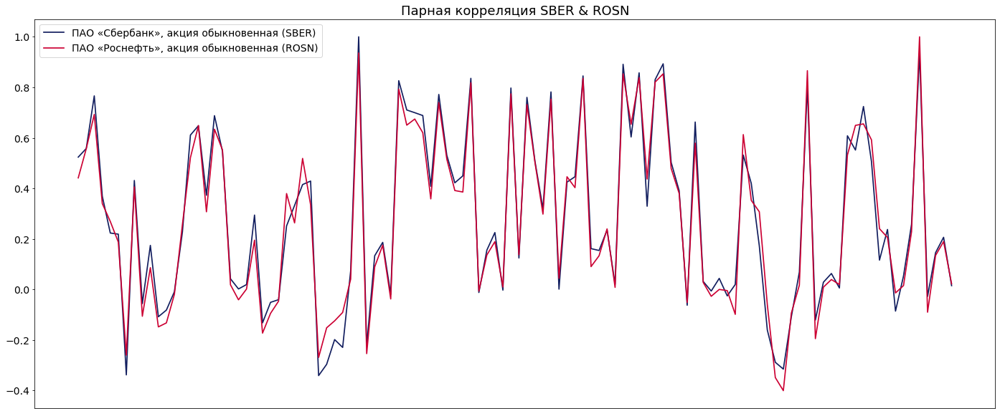

In [255]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(sber_correlation['sber_price'], color='#111d5e', label='ПАО «Сбербанк», акция обыкновенная (SBER)', linewidth=1.7)
plt.plot(sber_correlation['rosn_price'], color='#CC0033', label='ПАО «Роснефть», акция обыкновенная (ROSN)', linewidth=1.7)
plt.xticks([])
plt.title('Парная корреляция SBER & ROSN', fontsize=18)
plt.legend()
plt.show()

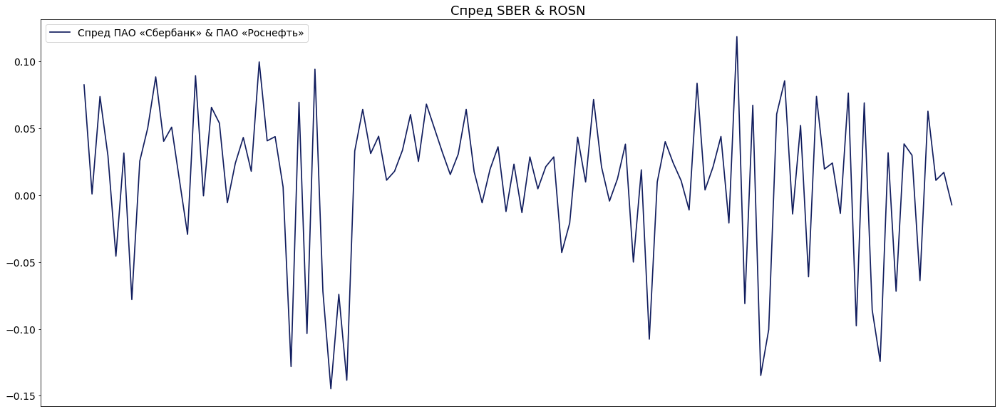

In [256]:
fig, ax = plt.subplots(figsize=(24, 10))
sber_rosn_spread = sber_correlation['sber_price'] - sber_correlation['rosn_price']
plt.plot(sber_rosn_spread, color='#111d5e', label='Спред ПАО «Сбербанк» & ПАО «Роснефть»', linewidth=1.7) # spread_sr.cumsum()
plt.xticks([])
plt.title('Спред SBER & ROSN', fontsize=18)
plt.legend()
plt.show()

In [257]:
sber_rosn_adf = adfuller(sber_rosn_spread)

In [258]:
print(f'ADF Test Statistic: {sber_rosn_adf[0]}')
print(f'P-Value: {sber_rosn_adf[1]}')
print(f'Number of lags used: {sber_rosn_adf[2]}')
print(f'Number of observations: {sber_rosn_adf[3]}')
print('Critical Values:')
for k, v in sber_rosn_adf[4].items():
    print(f'{k}: {v}')

ADF Test Statistic: -3.583854504022342
P-Value: 0.006077303666994582
Number of lags used: 6
Number of observations: 103
Critical Values:
1%: -3.4954932834550623
5%: -2.8900369024285117
10%: -2.5819706975209726


In [259]:
sber_rosn_coint = coint(sber_correlation['sber_price'], sber_correlation['rosn_price'])

In [260]:
print(f'T-statistic of unit-root test on residuals {sber_rosn_coint[0]}')
print(f'P-Value: {sber_rosn_coint[1]}')
print(f'Critical Values: {sber_rosn_coint[2]}')

T-statistic of unit-root test on residuals -3.6535716208865927
P-Value: 0.020999936624013203
Critical Values: [-3.99973805 -3.39276024 -3.08358903]


## <a id='508'>Корреляционная зависимость - ПАО «Газпром»</a>  
- <a href='#0'>Table of contents</a> 

In [261]:
gazr_correlation = train_df.corr()
gazr_corr_with_target = gazr_correlation['gazr_price'].sort_values(ascending = False)
gazr_corr_with_target

gazr_price                   1.00000
vtbr_price                   0.88733
long_position_gazr_ind       0.85288
sber_price                   0.84523
long_position_vtbr_ind       0.84057
rosn_price                   0.83551
short_position_gazr_ent      0.83395
lkoh_price                   0.83251
short_position_vtbr_ent      0.80567
clients_in_long_gmkn_ind     0.79966
short_position_gmkn_ent      0.77411
long_position_gmkn_ind       0.77277
clients_in_long_rosn_ind     0.75209
clients_in_long_gazr_ind     0.74611
clients_in_long_vtbr_ind     0.72633
long_position_gmkn_ent       0.66528
long_position_rosn_ind       0.61703
clients_in_short_vtbr_ind    0.60504
short_position_vtbr_ind      0.57605
clients_in_short_gazr_ind    0.56855
clients_in_long_eu_ind       0.55185
gazr_value                   0.54274
clients_in_long_gmkn_ent     0.51233
clients_in_long_si_ind       0.51214
short_position_eu_ent        0.50273
clients_in_long_vtbr_ent     0.49631
clients_in_long_sbrf_ind     0.48683
g

## <a id='509'>Парная корреляция GAZP & VTBR</a>  
- <a href='#0'>Table of contents</a> 

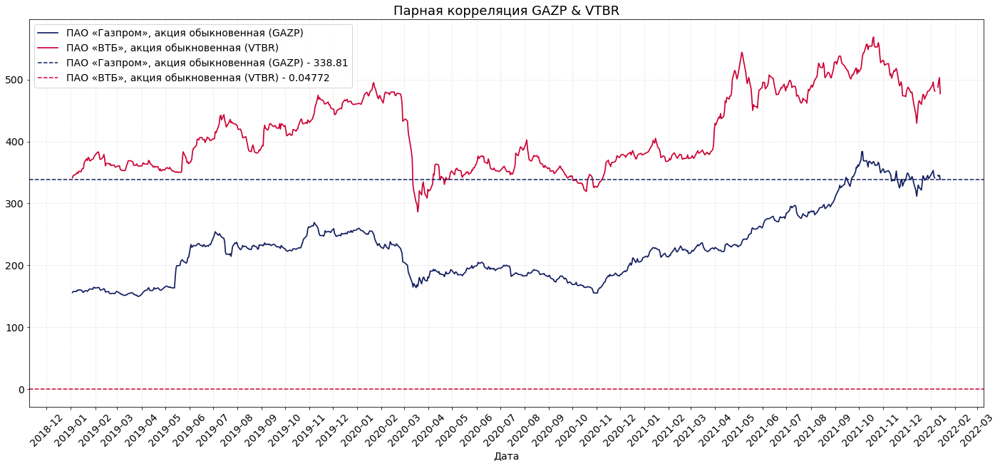

In [262]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(train_df['moment'], train_df['gazr_price'], color='#111d5e', label='ПАО «Газпром», акция обыкновенная (GAZP)', linewidth=1.7)
plt.plot(train_df['moment'], train_df['vtbr_price']*10000, color='#CC0033', label='ПАО «ВТБ», акция обыкновенная (VTBR)', linewidth=1.7)
plt.axhline(y=train_df['gazr_price'].iat[-1], label='ПАО «Газпром», акция обыкновенная (GAZP) - '+str(round(train_df['gazr_price'].iat[-1], 2)), linestyle='--', color='#111d5e')
plt.axhline(y=train_df['vtbr_price'].iat[-1], label='ПАО «ВТБ», акция обыкновенная (VTBR) - '+str(train_df['vtbr_price'].iat[-1]), linestyle='--', color='#CC0033')
ax.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.3) 
plt.xlabel('Дата')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.title('Парная корреляция GAZP & VTBR', fontsize=18)
plt.legend()
plt.show()

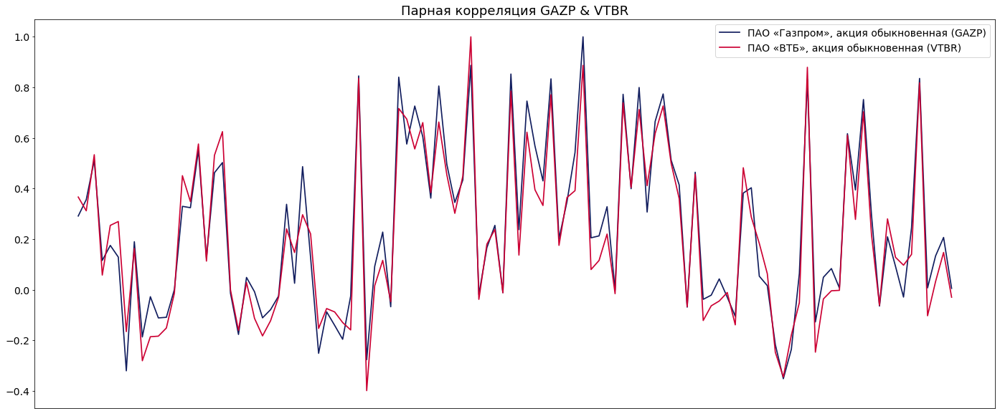

In [263]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(gazr_correlation['gazr_price'], color='#111d5e', label='ПАО «Газпром», акция обыкновенная (GAZP)', linewidth=1.7)
plt.plot(gazr_correlation['vtbr_price'], color='#CC0033', label='ПАО «ВТБ», акция обыкновенная (VTBR)', linewidth=1.7)
plt.xticks([])
plt.title('Парная корреляция GAZP & VTBR', fontsize=18)
plt.legend()
plt.show()

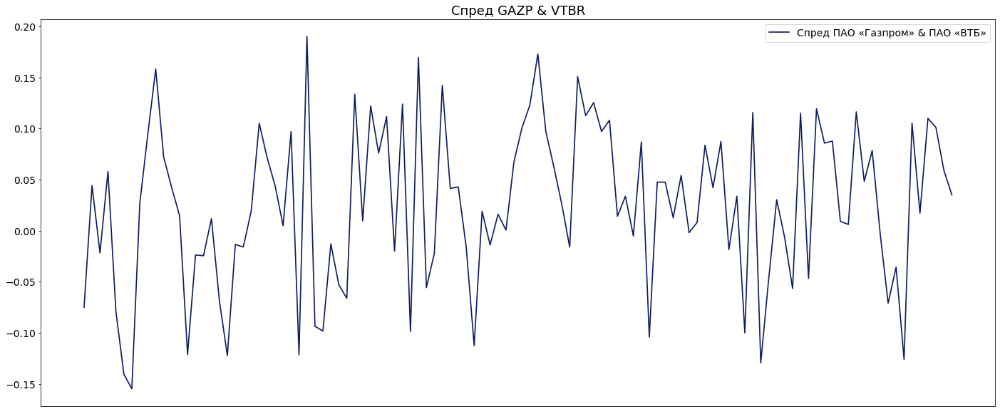

In [264]:
fig, ax = plt.subplots(figsize=(24, 10))
gazr_vtbr_spread = gazr_correlation['gazr_price'] - gazr_correlation['vtbr_price']
plt.plot(gazr_vtbr_spread, color='#111d5e', label='Спред ПАО «Газпром» & ПАО «ВТБ»', linewidth=1.7) # gazr_vtbr_spread.cumsum()
plt.xticks([])
plt.title('Спред GAZP & VTBR', fontsize=18)
plt.legend()
plt.show()

In [265]:
gazr_vtbr_adf = adfuller(gazr_vtbr_spread)

In [266]:
print(f'ADF Test Statistic: {gazr_vtbr_adf[0]}')
print(f'P-Value: {gazr_vtbr_adf[1]}')
print(f'Number of lags used: {gazr_vtbr_adf[2]}')
print(f'Number of observations: {gazr_vtbr_adf[3]}')
print('Critical Values:')
for k, v in gazr_vtbr_adf[4].items():
    print(f'{k}: {v}')

ADF Test Statistic: -5.120803971281831
P-Value: 1.2729666643519822e-05
Number of lags used: 1
Number of observations: 108
Critical Values:
1%: -3.4924012594942333
5%: -2.8886968193364835
10%: -2.5812552709190673


In [267]:
gazr_vtbr_coint = coint(gazr_correlation['gazr_price'], gazr_correlation['vtbr_price'])

In [268]:
print(f'T-statistic of unit-root test on residuals {gazr_vtbr_coint[0]}')
print(f'P-Value: {gazr_vtbr_coint[1]}')
print(f'Critical Values: {gazr_vtbr_coint[2]}')

T-statistic of unit-root test on residuals -5.09537546307899
P-Value: 0.00010952872175820753
Critical Values: [-3.99973805 -3.39276024 -3.08358903]


## <a id='510'>Конструирование признаков</a>  
- <a href='#0'>Table of contents</a> 

In [269]:
# def feature_engineering(df):
#     # Дата
#     df['month'] = df['moment'].apply(lambda t: t.month)
#     df['year'] = df['moment'].apply(lambda t: t.year)

In [270]:
# feature_engineering(train_df)

In [271]:
X = train_df.drop(['si_price', 'moment',  'vtbr_volume'], axis=1)
y = train_df['si_price'] 

In [272]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

# <a id='6'>Выбор модели и обучение</a>  

## <a id='601'>Первичный выбор модели</a>  
- <a href='#0'>Table of contents</a> 

In [273]:
models = []

models.append(('CatBoostRegressor', CatBoostRegressor(silent=True)))
models.append(('LGBMRegressor', LGBMRegressor()))
models.append(('XGBRegressor', XGBRegressor()))

In [274]:
results = []

for name, model in models:
    start_time = time.time()
    
    model.fit(X_train, y_train)
    
    train_predictions  = model.predict(X_train)
    test_predictions = model.predict(X_test)
    
    R2 = r2_score(y_test, test_predictions)
    MAE = mean_absolute_error(y_test, test_predictions)
    MSE = mean_squared_error(y_test, test_predictions)
    EV = explained_variance_score(y_test, test_predictions)
    
    lr_time = (time.time() - start_time)
    results.append((name, R2, EV, MAE, MSE, lr_time))
    
best_models = pd.DataFrame(results, columns = ['model','R2', 'EV', 'MAE', 'MSE', 'time'])
best_models.sort_values('R2', ascending=False)

,model,R2,EV,MAE,MSE,time
0,CatBoostRegressor,0.99342,0.99345,0.29682,0.16029,7.76865
1,LGBMRegressor,0.99031,0.99031,0.30674,0.23627,0.14500
2,XGBRegressor,0.98814,0.98817,0.35850,0.28899,0.35409


## <a id='602'>Обучение модели</a>  
- <a href='#0'>Table of contents</a> 

In [275]:
results_lgb = []

# params = {
#     'objective': 'rmse',
#     'boosting_type': 'gbdt',
#     'max_depth': 3,
#     'learning_rate': 0.1,
#     'n_jobs': -1,
#     'verbose': -1
# }

# params = {
#     'objective': 'rmse',
#     'boosting_type': 'goss',
#     'max_depth': -1,
#     'learning_rate': 0.031,
#     'max_bin': 342,
#     'n_jobs': -1,
#     'verbose': -1
# }

params = {
    'objective': 'rmse',
    'boosting_type': 'dart',
    'max_depth': 7,
    'learning_rate': 0.2,
    'max_bin': 225,
    'n_jobs': -1,
    'verbose': -1
}

folds = KFold(n_splits=5, random_state=23, shuffle=True)

for fold, (train_index, test_index) in enumerate(folds.split(X, y)):
    print(f'Training fold {fold + 1}')
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    start_time = time.time()
    model_lgb = LGBMRegressor(**params, num_iterations=22500) 
    
    model_lgb.fit(X_train, y_train, 
              eval_set = [(X_train, y_train), (X_test, y_test)], 
              verbose=250, early_stopping_rounds=250) # feval=feval_rmspe

    train_predictions_lgb = model_lgb.predict(X_train)
    test_predictions_lgb = model_lgb.predict(X_test)

    train_score_r2 = r2_score(y_train, train_predictions_lgb)
    test_score_r2 = r2_score(y_test, test_predictions_lgb)
    train_score_mae = mean_absolute_error(y_train, train_predictions_lgb)
    test_score_mae = mean_absolute_error(y_test, test_predictions_lgb)
    train_score_mse = mean_squared_error(y_train, train_predictions_lgb)
    test_score_mse = mean_squared_error(y_test, test_predictions_lgb)
    test_rmspe_score = rmspe(y_test, test_predictions_lgb)

    lr_time = (time.time() - start_time)
    results_lgb.append((fold, train_score_r2, train_score_mae, train_score_mse, test_score_r2, test_score_mae, test_score_mse, test_rmspe_score, lr_time))

Training fold 1
[250]	training's rmse: 0.860954	valid_1's rmse: 0.860767
[500]	training's rmse: 0.183455	valid_1's rmse: 0.376172
[750]	training's rmse: 0.302163	valid_1's rmse: 0.429366
[1000]	training's rmse: 0.227324	valid_1's rmse: 0.400526
[1250]	training's rmse: 0.235506	valid_1's rmse: 0.407552
[1500]	training's rmse: 0.305572	valid_1's rmse: 0.439111
[1750]	training's rmse: 0.105079	valid_1's rmse: 0.379034
[2000]	training's rmse: 0.144319	valid_1's rmse: 0.38397
[2250]	training's rmse: 0.0836671	valid_1's rmse: 0.379958
[2500]	training's rmse: 0.121771	valid_1's rmse: 0.382413
[2750]	training's rmse: 0.156371	valid_1's rmse: 0.387745
[3000]	training's rmse: 0.0825784	valid_1's rmse: 0.381477
[3250]	training's rmse: 0.0406211	valid_1's rmse: 0.384398
[3500]	training's rmse: 0.103949	valid_1's rmse: 0.38382
[3750]	training's rmse: 0.0797531	valid_1's rmse: 0.384234
[4000]	training's rmse: 0.0957163	valid_1's rmse: 0.385527
[4250]	training's rmse: 0.0761337	valid_1's rmse: 0.3853

[12250]	training's rmse: 0.0128659	valid_1's rmse: 0.376142
[12500]	training's rmse: 0.0286423	valid_1's rmse: 0.375933
[12750]	training's rmse: 0.0261867	valid_1's rmse: 0.376102
[13000]	training's rmse: 0.0247656	valid_1's rmse: 0.37599
[13250]	training's rmse: 0.0184378	valid_1's rmse: 0.376257
[13500]	training's rmse: 0.0234065	valid_1's rmse: 0.375959
[13750]	training's rmse: 0.0156345	valid_1's rmse: 0.376054
[14000]	training's rmse: 0.00667361	valid_1's rmse: 0.376462
[14250]	training's rmse: 0.0460617	valid_1's rmse: 0.375784
[14500]	training's rmse: 0.0135097	valid_1's rmse: 0.375983
[14750]	training's rmse: 0.0216733	valid_1's rmse: 0.375729
[15000]	training's rmse: 0.0243378	valid_1's rmse: 0.375864
[15250]	training's rmse: 0.0249999	valid_1's rmse: 0.375931
[15500]	training's rmse: 0.0101008	valid_1's rmse: 0.376477
[15750]	training's rmse: 0.0217661	valid_1's rmse: 0.376086
[16000]	training's rmse: 0.0284557	valid_1's rmse: 0.376047
[16250]	training's rmse: 0.00656949	vali

[1750]	training's rmse: 0.104746	valid_1's rmse: 0.385989
[2000]	training's rmse: 0.143838	valid_1's rmse: 0.39692
[2250]	training's rmse: 0.0834156	valid_1's rmse: 0.378664
[2500]	training's rmse: 0.121372	valid_1's rmse: 0.387988
[2750]	training's rmse: 0.155875	valid_1's rmse: 0.399587
[3000]	training's rmse: 0.0823348	valid_1's rmse: 0.376293
[3250]	training's rmse: 0.040542	valid_1's rmse: 0.370784
[3500]	training's rmse: 0.103606	valid_1's rmse: 0.381372
[3750]	training's rmse: 0.0794957	valid_1's rmse: 0.375664
[4000]	training's rmse: 0.0953929	valid_1's rmse: 0.378984
[4250]	training's rmse: 0.075903	valid_1's rmse: 0.374854
[4500]	training's rmse: 0.082898	valid_1's rmse: 0.376111
[4750]	training's rmse: 0.0566128	valid_1's rmse: 0.371426
[5000]	training's rmse: 0.0538516	valid_1's rmse: 0.371447
[5250]	training's rmse: 0.0433077	valid_1's rmse: 0.369755
[5500]	training's rmse: 0.0596469	valid_1's rmse: 0.371362
[5750]	training's rmse: 0.072808	valid_1's rmse: 0.373202
[6000]	

[14000]	training's rmse: 0.00669193	valid_1's rmse: 0.490453
[14250]	training's rmse: 0.0461422	valid_1's rmse: 0.493354
[14500]	training's rmse: 0.0135347	valid_1's rmse: 0.490535
[14750]	training's rmse: 0.0217125	valid_1's rmse: 0.491074
[15000]	training's rmse: 0.0243828	valid_1's rmse: 0.4912
[15250]	training's rmse: 0.0250437	valid_1's rmse: 0.491032
[15500]	training's rmse: 0.0101201	valid_1's rmse: 0.490155
[15750]	training's rmse: 0.0218037	valid_1's rmse: 0.49094
[16000]	training's rmse: 0.0285047	valid_1's rmse: 0.491355
[16250]	training's rmse: 0.00657937	valid_1's rmse: 0.490193
[16500]	training's rmse: 0.00957641	valid_1's rmse: 0.490194
[16750]	training's rmse: 0.00703799	valid_1's rmse: 0.49019
[17000]	training's rmse: 0.022095	valid_1's rmse: 0.490775
[17250]	training's rmse: 0.00624785	valid_1's rmse: 0.489905
[17500]	training's rmse: 0.0131118	valid_1's rmse: 0.490207
[17750]	training's rmse: 0.0107762	valid_1's rmse: 0.49008
[18000]	training's rmse: 0.00840695	valid

In [276]:
best_models = pd.DataFrame((results_lgb))
best_models.columns = ['Fold', 'train_score_r2', 'train_score_mae', 'train_score_mse', 'test_score_r2', 'test_score_mae', 'test_score_mse', 'test_rmspe_score', 'time']
best_models.sort_values('Fold', ascending=True)

,Fold,train_score_r2,train_score_mae,train_score_mse,test_score_r2,test_score_mae,test_score_mse,test_rmspe_score,time
0,0,1.00000,0.00643,0.00004,0.99435,0.23809,0.15330,0.00547,68.64173
1,1,1.00000,0.00641,0.00004,0.99452,0.23707,0.14152,0.00516,69.28173
2,2,1.00000,0.00643,0.00004,0.99584,0.22320,0.09895,0.00441,69.00688
3,3,1.00000,0.00641,0.00004,0.99500,0.23637,0.13352,0.00508,68.61552
4,4,1.00000,0.00643,0.00004,0.99100,0.26553,0.23949,0.00685,58.04575


In [277]:
print(f'Train mean score: {round(np.mean(best_models.train_score_mse), 4)}, std: {round(np.std(best_models.train_score_mse), 4)}')
print(f'Test mean score: {round(np.mean(best_models.test_score_mse), 4)}, std: {round(np.std(best_models.test_score_mse), 4)}')

Train mean score: 0.0, std: 0.0
Test mean score: 0.1534, std: 0.0467


In [278]:
# Train mean score: 0.0, std: 0.0
# Test mean score: 0.1721, std: 0.0262

In [279]:
# Train mean score: 0.0, std: 0.0 - dart
# Test mean score: 0.1317, std: 0.0315

In [280]:
# Train mean score: 0.0, std: 0.0 - gbdt
# Test mean score: 0.1602, std: 0.0226

In [281]:
# Train mean score: 0.0002, std: 0.0002 - goss
# Test mean score: 0.1673, std: 0.0306

# <a id='7'>Прогнозирование временных рядов</a>  

## <a id='701'>Подготовка данных</a>  
- <a href='#0'>Table of contents</a> 

In [282]:
si_tsf = pd.DataFrame()

In [283]:
si_tsf['moment'] = si_df['moment']
si_tsf['si_price'] = si_df['si_price']

In [284]:
si_tsf.head()

,moment,si_price
0,2019-01-03,69.04240
1,2019-01-04,68.01030
2,2019-01-08,67.02320
3,2019-01-09,66.99830
4,2019-01-10,67.03050


In [285]:
si_tsf.tail()

,moment,si_price
761,2022-01-07,75.64550
762,2022-01-10,75.13150
763,2022-01-11,74.83280
764,2022-01-12,74.57040
765,2022-01-13,75.40700


In [286]:
si_tsf.shape

(766, 2)

In [287]:
si_dataset = si_tsf.iloc[:,1].values

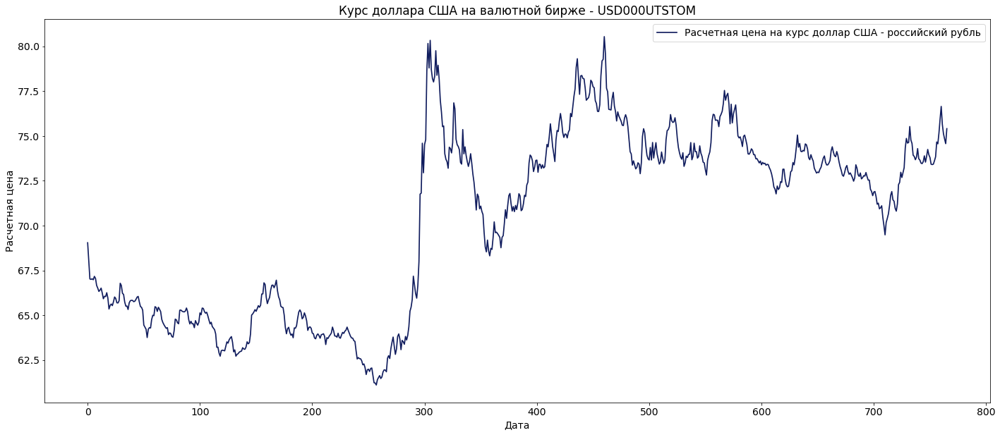

In [288]:
fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(si_dataset, color='#111d5e', label='Расчетная цена на курс доллар США - российский рубль', linewidth=1.7)
plt.xlabel('Дата')
plt.ylabel('Расчетная цена')
plt.title('Курс доллара США на валютной бирже - USD000UTSTOM')
plt.legend()
plt.show()

# fig.savefig('./fig.savefig('./graphs/Si_TSF.png')/Si_TSF.png')

In [289]:
# Preprocessing
si_dataset = si_dataset.reshape(-1, 1)
si_dataset = si_dataset.astype('float32')
si_dataset.shape

(766, 1)

In [290]:
minmax_scaler = MinMaxScaler()
# robust_scaler = RobustScaler()
standard_scaler = StandardScaler()

si_dataset = standard_scaler.fit_transform(si_dataset)
# si_dataset = robust_scaler.fit_transform(si_dataset)
si_dataset = minmax_scaler.fit_transform(si_dataset)

In [291]:
train_size = int(len(si_dataset)*0.51)
test_size = len(si_dataset) - train_size
si_train = si_dataset[0:train_size,:]
si_test = si_dataset[train_size:len(si_dataset),:]
print(len(si_train), len(si_test))

390 376


In [292]:
time_temp = 7
X_temp = []
Y_temp = []
for i in range(len(si_train)-time_temp-1):
    a = si_train[i:(i+time_temp), 0]
    X_temp.append(a)
    Y_temp.append(si_train[i + time_temp, 0])
X_train = np.array(X_temp)
y_train = np.array(Y_temp) 

In [293]:
ast = len(si_train)
act = ast-time_temp-1
aaa = si_train[i, 0]
print(ast, act, aaa)

390 382 0.51536334


In [294]:
X_temp = []
Y_temp = []
for i in range(len(si_test)-time_temp-1):
    a = si_test[i:(i+time_temp), 0]
    X_temp.append(a)
    Y_temp.append(si_test[i + time_temp, 0])
X_test = np.array(X_temp)
y_test = np.array(Y_temp) 

In [295]:
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

In [296]:
model = Sequential([
    LSTM(300, input_shape=(1, time_temp)),
    Dense(1)
])

In [297]:
model.compile(optimizer='adam', loss='mean_squared_error')

In [298]:
%%time
model.fit(X_train, y_train, epochs=50, batch_size=1)

Epoch 1/50
382/382 [==============================] - 2s 2ms/step - loss: 0.0080
Epoch 2/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 3/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 4/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 5/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 6/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 7/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 8/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 9/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 10/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 11/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 12/50
382/382 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 13/50
382/382 [====

In [299]:
trainPredict = model.predict(X_train)
testPredict = model.predict(X_test)

trainPredict = minmax_scaler.inverse_transform(trainPredict)
y_train = minmax_scaler.inverse_transform([y_train])
testPredict = minmax_scaler.inverse_transform(testPredict)
y_test = minmax_scaler.inverse_transform([y_test])

trainScore = math.sqrt(mean_squared_error(y_train[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(y_test[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.13 RMSE
Test Score: 0.16 RMSE


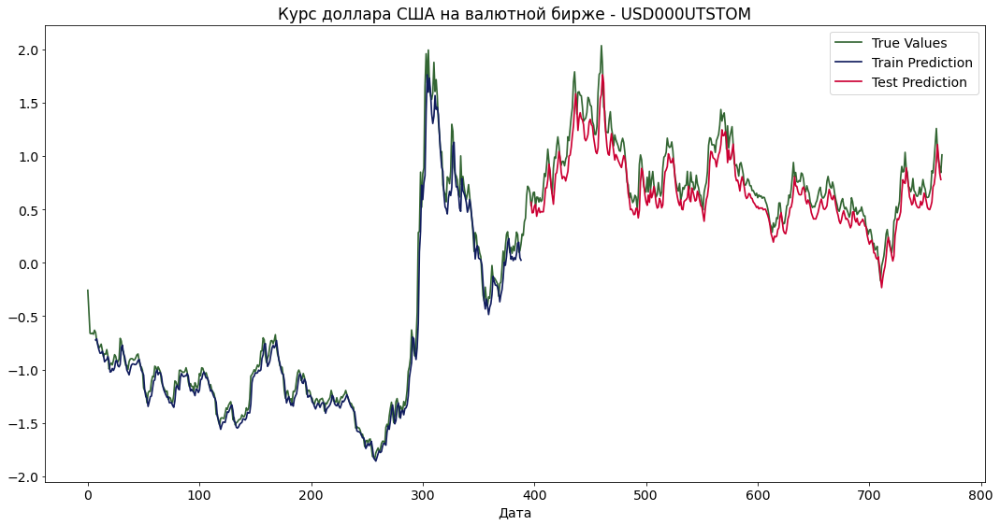

In [300]:
trainPredictPlot = np.empty_like(si_dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[time_temp:len(trainPredict)+time_temp, :] = trainPredict

testPredictPlot = np.empty_like(si_dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(time_temp*2)+1:len(si_dataset)-1, :] = testPredict

fig, ax = plt.subplots(figsize=(18, 9))
plt.plot(minmax_scaler.inverse_transform(si_dataset), label = 'True Values', color='#336633', linewidth=1.7)
plt.plot(trainPredictPlot, label='Train Prediction', color='#111d5e', linewidth=1.7)
plt.plot(testPredictPlot, label = 'Test Prediction', color='#CC0033', linewidth=1.7)
plt.xlabel('Дата')
plt.ylabel('')
plt.title('Курс доллара США на валютной бирже - USD000UTSTOM')
plt.legend()
plt.show()